# Heart Failure Prediction Dataset

For this project, either use your own Kaggle API and proceed with the code or download the dataset on kaggle website<br><br>
Tutorial to create Kaggle API key in Python: https://stackoverflow.com/questions/49310470/using-kaggle-datasets-in-google-colab <br><br>
Link to manually download the dataset : https://www.kaggle.com/fedesoriano/heart-failure-prediction/download 

<br>Estimated runtime : about 2 hours

In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
#! pip install scikit-optimize
import skopt
from scipy import stats
import scipy
#!pip install hypopt
import hypopt
import zipfile

#!pip install -q kaggle
import kaggle

In [2]:
#Run this if you use Kaggle API key
#!kaggle datasets download -d fedesoriano/heart-failure-prediction

In [3]:
#Run this to unzip the dataset and create a folder containing the csv dataset
#with zipfile.ZipFile('heart-failure-prediction.zip', 'r') as zip_ref:
#    zip_ref.extractall('heart-failure-prediction')
#    zip_ref.close()
    
original_df=pd.read_csv('heart-failure-prediction/heart.csv')

In [4]:
original_df

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
0,40,M,ATA,140,289,0,Normal,172,N,0.0,Up,0
1,49,F,NAP,160,180,0,Normal,156,N,1.0,Flat,1
2,37,M,ATA,130,283,0,ST,98,N,0.0,Up,0
3,48,F,ASY,138,214,0,Normal,108,Y,1.5,Flat,1
4,54,M,NAP,150,195,0,Normal,122,N,0.0,Up,0
...,...,...,...,...,...,...,...,...,...,...,...,...
913,45,M,TA,110,264,0,Normal,132,N,1.2,Flat,1
914,68,M,ASY,144,193,1,Normal,141,N,3.4,Flat,1
915,57,M,ASY,130,131,0,Normal,115,Y,1.2,Flat,1
916,57,F,ATA,130,236,0,LVH,174,N,0.0,Flat,1


## Attribute Information

<i> Information available in Kaggle data main page </i>

<ol type="1">
    <li>Age: age of the patient [years]</li> 
    <li>Sex: sex of the patient [M: Male, F: Female]</li>
    <li>ChestPainType: chest pain type [TA: Typical Angina, ATA: Atypical Angina, NAP: Non-Anginal Pain, ASY: Asymptomatic]</li>
    <li>RestingBP:resting blood pressure [mm Hg]</li>
    <li>Cholesterol: serum cholesterol [mm/dl]</li>
    <li>FastingBS: fasting blood sugar [1: if FastingBS > 120 mg/dl, 0: otherwise]</li>
    <li>RestingECG: resting electrocardiogram results [Normal: Normal, ST: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV), LVH: showing probable or definite left ventricular hypertrophy by Estes' criteria]</li>
    <li>MaxHR: maximum heart rate achieved [Numeric value between 60 and 202]</li>
    <li>ExerciseAngina: exercise-induced angina [Y: Yes, N: No]</li>
    <li>Oldpeak: oldpeak = ST [Numeric value measured in depression]</li>
    <li>ST_Slope: the slope of the peak exercise ST segment [Up: upsloping, Flat: flat, Down: downsloping]</li>
    <li>HeartDisease: output class [1: heart disease, 0: Normal]</li>
</ol>

    
    
    


## I. Feature exploration

In [5]:
original_df.isna().info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 918 entries, 0 to 917
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   Age             918 non-null    bool 
 1   Sex             918 non-null    bool 
 2   ChestPainType   918 non-null    bool 
 3   RestingBP       918 non-null    bool 
 4   Cholesterol     918 non-null    bool 
 5   FastingBS       918 non-null    bool 
 6   RestingECG      918 non-null    bool 
 7   MaxHR           918 non-null    bool 
 8   ExerciseAngina  918 non-null    bool 
 9   Oldpeak         918 non-null    bool 
 10  ST_Slope        918 non-null    bool 
 11  HeartDisease    918 non-null    bool 
dtypes: bool(12)
memory usage: 10.9 KB


No missing value 'per say' in the dataset

In [6]:
original_df.dtypes.value_counts()

int64      6
object     5
float64    1
dtype: int64

There are 7 numerical data and 5 categorical data. However, looking at the data type, some of the numerical value are encoded categorical values. For instance, FastingBS is a categorical variable that is one for diabete and 0 for normal. The HeartDisease is the same.
So the true number of cat/num data is 5/7

In [7]:
cat_index=np.asarray(original_df.columns[original_df.dtypes==object])
cat_index=np.insert(cat_index,2,'FastingBS')
num_index=np.asarray(original_df.columns[original_df.dtypes=='int64'])
num_index=np.delete(num_index,(3,5))
num_index=np.insert(num_index,4,'Oldpeak')

In [8]:
print('Categorical predictors :'+str(cat_index)+'\nNumerical predictors'+str(num_index))

Categorical predictors :['Sex' 'ChestPainType' 'FastingBS' 'RestingECG' 'ExerciseAngina'
 'ST_Slope']
Numerical predictors['Age' 'RestingBP' 'Cholesterol' 'MaxHR' 'Oldpeak']


There are 11 predictors, and the response is a binary response, with 1 being Heart Disease and 0 is normal 
<br><br> 
Now, to study the different predictors associations, it is needed to understand the type of the variables used.
<br><br> 
Indeed, some variables here are categorical dichotomous (binary), some are categorical non-dichotomous and some are numerical. 
<br><br>
The correlation is only meaningful for 2 numerical variables together. To study the association between two non-numerical variable, the Pearson Correlation isn't relevant, and other coefficients must be used

<br> To solve this issue, the proposed solution is:
    <ul>
        <li> For 2 numerical values the Pearson coefficient is used
            $$r=\frac{\sum_{i=1}^{n}(x_{i}-\bar{x})(y_{i}-\bar{y})}{\sqrt{\sum_{i=1}^{n}(x_{i}-\bar{x})^{2}\sum_{i=1}^{n}(y_{i}-\bar{y})^{2}}}$$ with $x_{i}$ the $i^{th}$ feature value, $\bar{x}$ the mean of the feature values, with $y_{i}$ the $i^{th}$ response value and $\bar{y}$ the mean of the response values</li><br>
        <li> For 2 categorical variables, the Cramer's V is computed from the chi-square value only if the p value from the chi-square is significant
            $$\phi _{c}=\sqrt{\frac{\chi^{2}}{N(k-1)}}$$
            
with $N$ the sample size,$k$ the lesser number of categories and $\chi^{2}$ the chi-square value.  </li>
</ul>
<br>To measure the association between a categorical and a non categorical data, there are two options:<br><br>
<ul>
    <li> The categorical data is binary, then the Point-biserial correlation coefficient is used:</li>
        $$r_{pb}=\frac{M_{1}-M_{0}}{s_{n}-1}\sqrt{\frac{n_{1}n_{0}}{n(n-1)}}$$
    with $M_{1}$ and $n_{1}$ being respectively the mean value and the sample size of the feature x when the response y is 1;<br>$M_{0}$ and $n_{0}$ being respectively the mean value and the sample size of the feature x when the response y is 0; $n$ the total sample size.<br>
The standard deviation $s_{n}$ is computed using a sample of the population thus is as followed:$$s_{n}=\sqrt{\frac{1}{n-1}\sum_{i=1}^{n}(X_{i}-\bar{X}^{2})}$$
    <li> The categorical data is non-binary, then the Cramer's V coefficient is used</li>
</ul>
<br>
To summarize the results, a dataframe showing the stength of association, a 12x12 pairwise plot and a heatmap using the strength of association are made in the next cells

In [9]:
#create a plot with two variables depending on their type
def pairwise_plot(x1,x2,ax,type_):
    if type_==1:
    #only numerical_variables -> scatterplot
        ax.scatter(x1,x2)
        ax.set_xlabel(x1.name)
        ax.set_ylabel(x2.name)
    elif type_==2:
    #only categorical values -> stacked barplot 
        pd.crosstab(x1,x2,normalize='index').plot(kind='bar',stacked=True,cmap='Set2',ax=ax)
    elif type_==3:
    #cat and num values -> for each category a curve is drawn counting the number of appearance
    #of the categorical variable in the y axis, and the numerical value on the x axis 
        if x2.dtype==object or x2.name=='FastingBS' or x2.name=='HeartDisease':
            x_temp=x1
            x1=x2
            x2=x_temp
        else:
            pass
        cross=pd.crosstab(x1,x2).iloc[1,:].index
        for i in  range(0,pd.crosstab(x1,x2).index.size):
            cat_count=pd.crosstab(x1,x2).iloc[i,:]
            ax.plot(cross,cat_count,label=pd.crosstab(x1,x2).index[i])
        ax.legend()
        ax.set_xlabel(x2.name)
        ax.set_ylabel(x1.name+' count')
    return ax
        
def correlation_calculation(data,data_type=[],plot_=False):
    if plot_==True:
        fig,ax=plt.subplots(len(data_type),len(data_type),figsize=(100,100))
    else:
        pass
    #get type of the data, important for chosing the right correlation calculation
    alpha=0.05
    n_features=data.columns.value_counts().sum()
    if len(data_type)==0:
        data_type=np.asarray(data.dtypes,str)
    else:
        data_type=np.asarray(data_type)
    correlation_matrix=np.empty((data_type.size,data_type.size))
    for i in range(0,data_type.size):
        x1=data.iloc[:,i]
        for j in range(0,data_type.size):
            x2=data.iloc[:,j]
            if data_type[i]!='object' and data_type[j]!='object':
                #'Pearson correlation for two numerical
                type_=1
                x1=np.asarray(x1)
                x2=np.asarray(x2)
                x_mean=np.array([x1.mean(),x2.mean()])
                s=np.array([np.sqrt(np.sum(np.square(x1-x_mean[0]))),
                           np.sqrt(np.sum(np.square(x2-x_mean[1])))])
                r=(np.sum((x1-x_mean[0])*(x2-x_mean[1]))/(s[0]*s[1]))
            elif data_type[i]=='object' and data_type[j]=='object':
                #'Cramer v for two categorical
                type_=2
                cont_table=pd.crosstab(x1,x2)
                stat,p,dof,expected=stats.chi2_contingency(cont_table)
                if p>alpha:
                    r=0
                else:
                    r=stat/((min(cont_table.shape)-1)*x1.size)
            elif np.unique(x1).size==2 or np.unique(x2).size==2:
            #if one of the two data is binary point and there are one cat and one num -> point biserial 
                type_=3
                if np.unique(x1).size==2 :
                    x_bin=np.where(x1==np.unique(x1)[0],0,1)
                    pb=stats.pointbiserialr(x_bin,x2)
                elif np.unique(x2).size==2:
                    x_bin=np.where(x2==np.unique(x2)[0],0,1)
                    pb=stats.pointbiserialr(x_bin,x1)
                if pb[1]>alpha:
                    r=0
                else:
                    r=pb[0]
            else:
            #if cat+num without binary variable --> cramer's v
                type_=3
                cont_table=pd.crosstab(x1,x2)
                stat,p,dof,expected=stats.chi2_contingency(cont_table)
                if p>alpha:
                    r=0
                else:
                    r=stat/((min(cont_table.shape)-1)*x1.size)
            correlation_matrix[i,j]=r
            if plot_==True:
                pairwise_plot(data.iloc[:,i],data.iloc[:,j],ax=ax[i,j],type_=type_)
    df_corr=pd.DataFrame(correlation_matrix,columns=data.columns,index=data.columns)
    return df_corr

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
Age,1.000000,0.000000,0.083348,0.254399,-0.095282,0.198039,0.078584,-0.382045,0.215793,0.258612,0.084695,0.282039
Sex,0.000000,0.993450,0.040173,0.000000,-0.200092,0.013669,0.000000,-0.189186,0.035322,0.105734,0.023764,0.091661
ChestPainType,0.083348,0.040173,1.000000,0.000000,0.000000,0.025820,0.010545,0.175170,0.195287,0.112718,0.085449,0.292012
RestingBP,0.254399,0.000000,0.000000,1.000000,0.100893,0.070193,0.100112,-0.112135,0.155101,0.164803,0.000000,0.107589
Cholesterol,-0.095282,-0.200092,0.000000,0.100893,1.000000,-0.260974,0.000000,0.235792,0.000000,0.050148,0.000000,-0.232741
FastingBS,0.198039,0.013669,0.025820,0.070193,-0.260974,0.993916,0.016583,-0.131438,0.000000,0.000000,0.030903,0.070066
RestingECG,0.078584,0.000000,0.010545,0.100112,0.000000,0.016583,1.000000,0.000000,0.011569,0.094782,0.000000,0.011908
MaxHR,-0.382045,-0.189186,0.175170,-0.112135,0.235792,-0.131438,0.000000,1.000000,-0.370425,-0.160691,0.201924,-0.400421
ExerciseAngina,0.215793,0.035322,0.195287,0.155101,0.000000,0.000000,0.011569,-0.370425,0.995482,0.408752,0.208528,0.242113
Oldpeak,0.258612,0.105734,0.112718,0.164803,0.050148,0.000000,0.094782,-0.160691,0.408752,1.000000,0.266253,0.403951


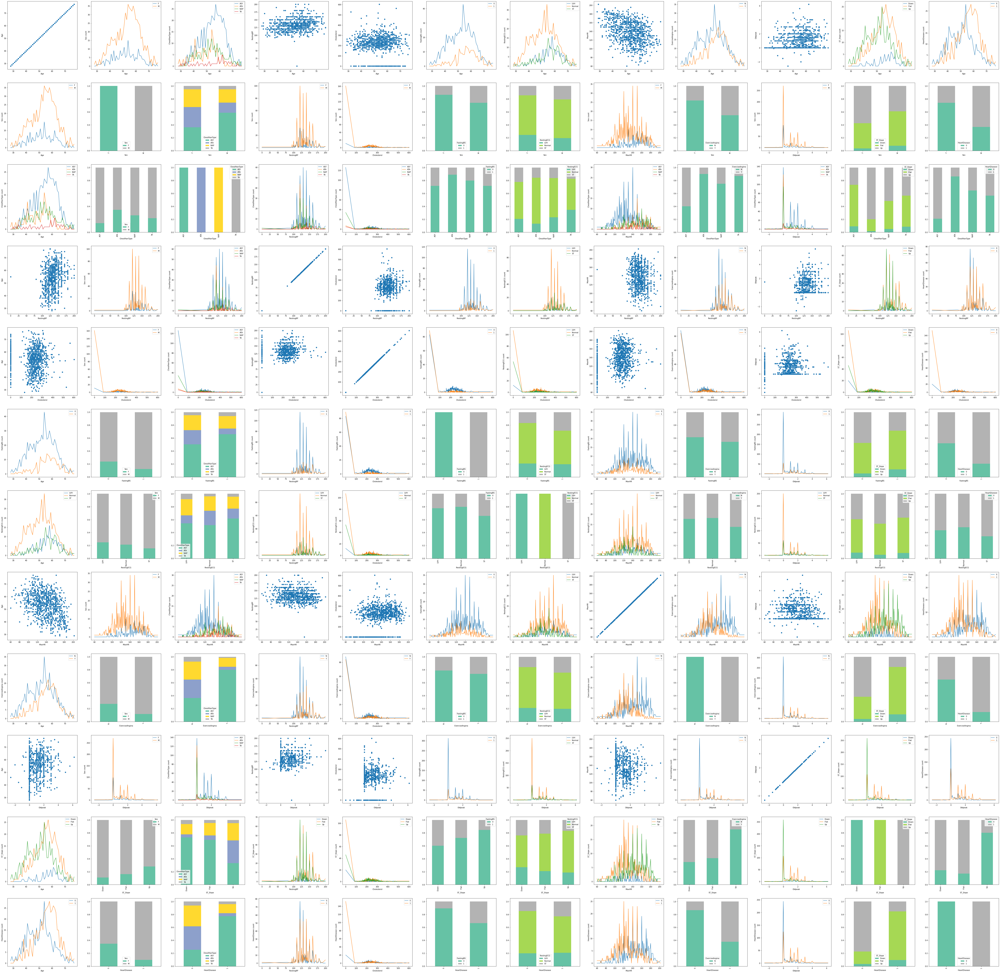

In [10]:
data_type=['int64','object','object','int64','int64','object','object','int64','object','float64','object','object']
corr_mat=correlation_calculation(original_df,data_type=data_type,plot_=True)
corr_mat

This pairwise comparison plot is made for every single x1 and x2 combination.

The strategy was the following:

<ul>
    <li>The variables are numerical, a scatter plot is made</li>
    <li>The variables are categorical, a stacked barplot is made using the number of appearance of each category (scale [0:1])</li>
    <li>The variables are categorical and numerical, a curve representing the number of appearance of a category for every single value of the numerical value is drawn, for each category (Example row 2, column 1)</li>
</ul>
<br> For readability purpose, the plots with a categorical and a numerical variable are the same regardless of x1 and x2 orders. As it is shown above, subplot 2:1 and 1:2 are the same.
<br>
In addition to provide a nice overview of the different relationships, some interesting comments can be made for data processing:
<ul>
    <li>The Oldpeak category contains a lot of 0, however, these are not missing values, only 'normal' values. </li>
    <li>The Cholesterol features has the exact same problem. A null value for Cholesterol is VERY unlikely for a living person. Several interpretations can be done. Either these are missing values or it can be that there are no presence of disease. </li>
</ul>


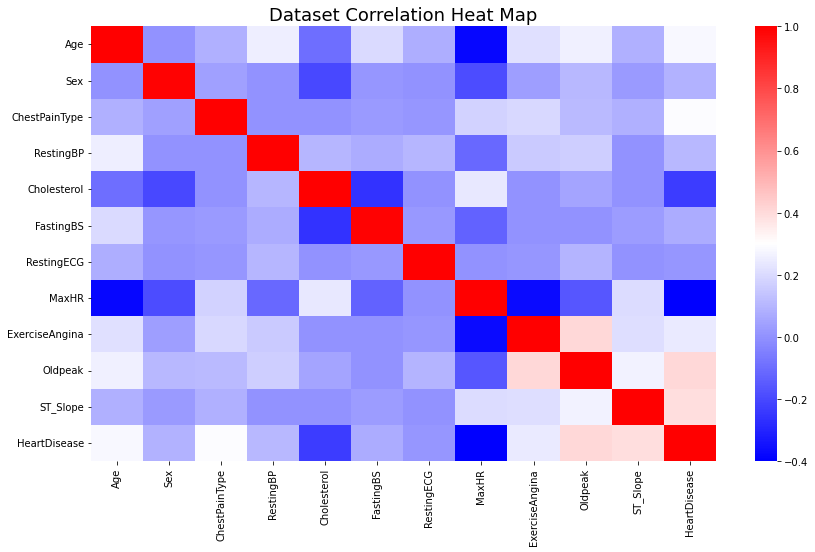

In [11]:
plt.figure(figsize=(14,8))
ax=sns.heatmap(corr_mat,cmap='bwr')
ax.set_title('Dataset Correlation Heat Map',fontsize=18)
plt.show()
#fig = ax.get_figure()
#fig.savefig("Dataset_Correlation_Heat_Map.png")

There are no strong correlation between each predictors. The maximum correlation coefficient is 0.4, which can be considered a medium-strength correlation. <br>It is important to notice that the cholesterol has a <b>negative</b> correlation with the Heart Disease risk, which is quiet unintuitive. </br></br> A further analysis of the predictors compared to the response is presented herebelow

In [12]:
#Function to quickly plot a numerical data against the heart disease prediction.
def plot_overall(feature_name):
    fig,ax=plt.subplots(2,figsize=(20,35))
    x1=pd.crosstab(original_df.iloc[:,11],original_df[feature_name]).iloc[1,:].index
    heartdisease_count=pd.crosstab(original_df.iloc[:,11],original_df[feature_name]).iloc[1,:]
    ax[0].set_title('Frequency of Heart Disease depending on the '+feature_name+' of patients',fontsize=18)
    ax[0].set_xlabel(feature_name)
    ax[0].set_ylabel('Count')
    ax[0].plot(x1,heartdisease_count,label='HeartDisease')
    ax[0].plot(x1,original_df[feature_name].value_counts().sort_index(),label='Repartition of '+feature_name)
    ax[0].grid()
    ax[0].legend()
    
    #plot a less biased representation of the numerical feature, using percentage of the total
    #sampling population instead of counting the number of case.
    ax[1].plot(heartdisease_count/original_df[feature_name].value_counts().sort_index()*100)
    ax[1].grid()
    ax[1].set_xlabel(feature_name)
    ax[1].set_ylabel('Percentage of the sample population having a heartdisease')
    ax[1].set_title('Repartition of heart disease in percentage over the '+feature_name+' sample',fontsize=18)

    plt.show()

### I.1. Age

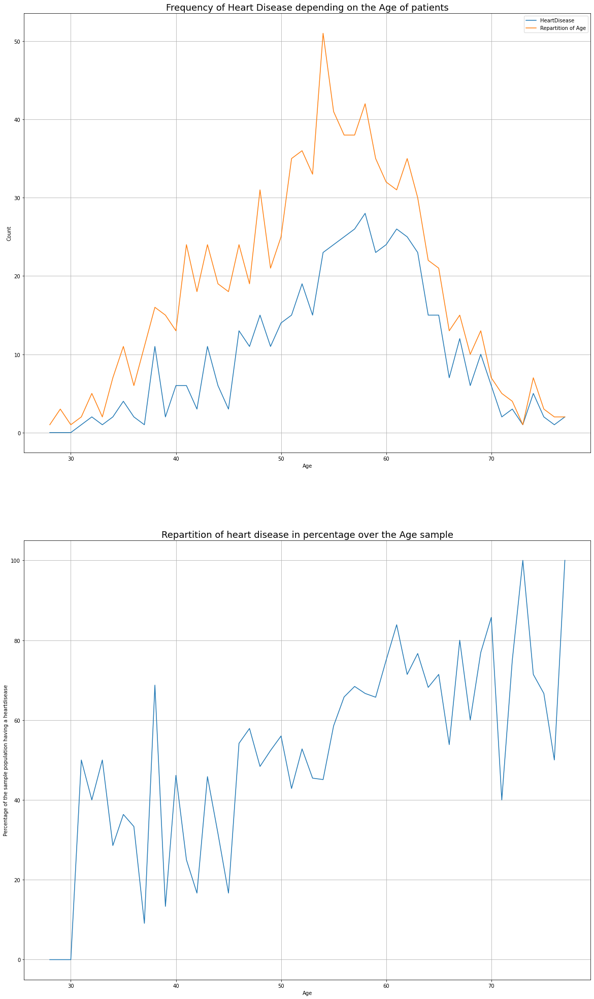

In [13]:
plot_overall('Age')

The graphic on the top represents the number of heart disease case per age, compared to the distribution of age over the entire sample population.
<br>
The number of cases by age follow the age distribution of the entire sample population. 
It is needed to unbias the data from the original distribution.
<br><br>
To do so, the percentage of the sample population at each age is used as the response. To illustrate, if 4 people in the sample population have 74 years old, and 3 get an heart disease at this age, the response will be 75% for the age 74

Comparing the total sampling population to the affected population over age, it seems that there is in fact a direct correlation between Age and risk of Heart Disease (which is expected, according to current medical knowledge).
<br><br>
The older one get, the more likely a heart disease will occur. The plot of occurence of heart disease over age is skewed due to the distribution of the sample population age, which isn't uniform as it is shown herebelow. It seems to follow a gaussian distribution with a mean around 50

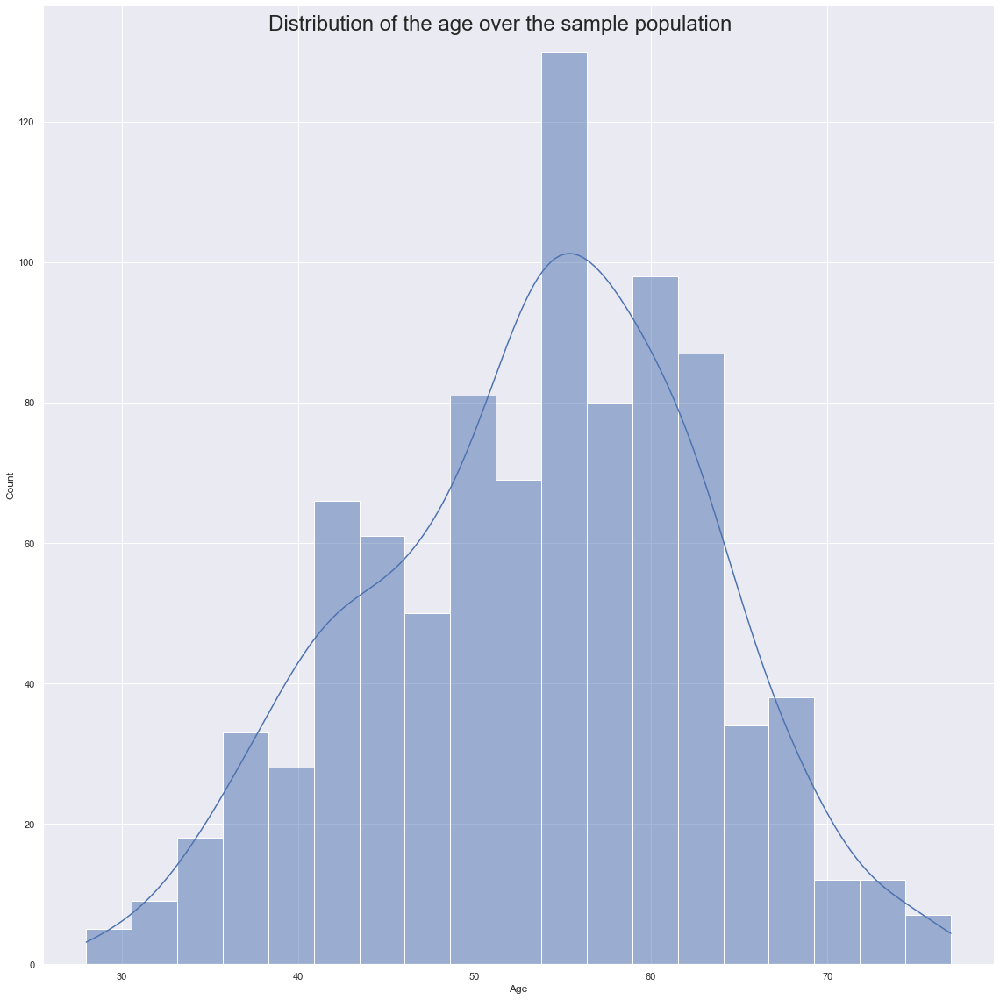

In [14]:
sns.set(rc={'figure.figsize':(14,10)})
sns.displot(x=original_df.iloc[:,0],kde=True,height=16,legend=False)
plt.suptitle("Distribution of the age over the sample population",
fontsize=24)
plt.show()

### I.2. Sex

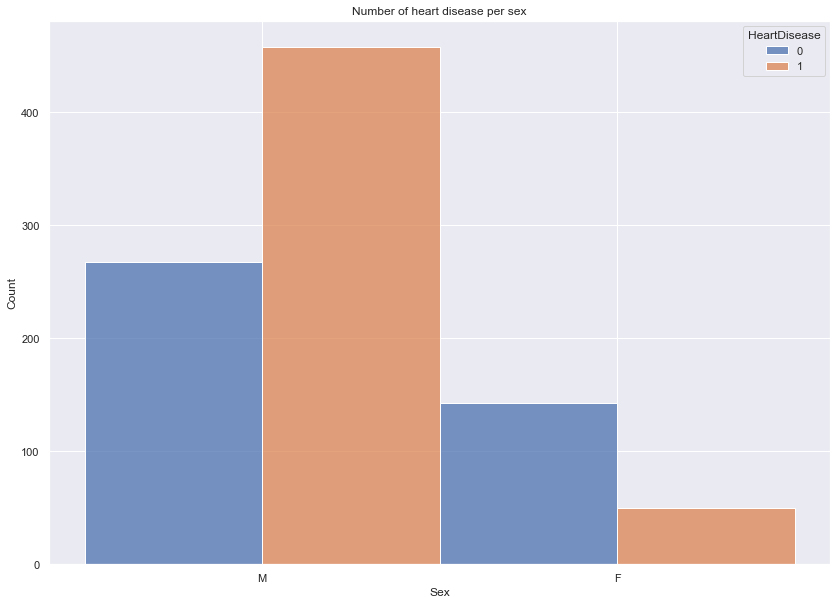

In [15]:
sns.histplot(data=original_df,x='Sex',hue='HeartDisease',multiple='dodge').set_title('Number of heart disease per sex')
plt.show()

In [16]:
pd.crosstab(original_df.iloc[:,1],original_df.iloc[:,11])

HeartDisease,0,1
Sex,,
F,143,50
M,267,458


In [17]:
print('Percentage of women with heart disease : '+str(round(50/(50+143)*100,2))+'%')
print('Percentage of men with heart disease : '+str(round(458/(267+458)*100,2))+'%')

Percentage of women with heart disease : 25.91%
Percentage of men with heart disease : 63.17%


For the sex of the patient, 63% of men got a heart disease, and only about 26% of women. Here the difference is pretty significant, men are more likely to suffer an heart disease than woman. 

### I.3. Chest Pain Type

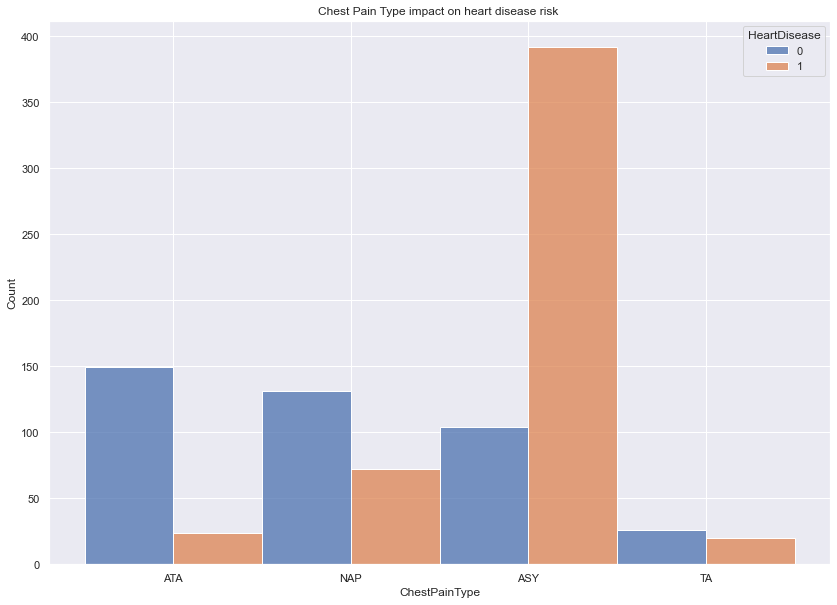

In [18]:
sns.histplot(original_df,x='ChestPainType',hue='HeartDisease',multiple='dodge').set_title('Chest Pain Type impact on heart disease risk ')
plt.show()

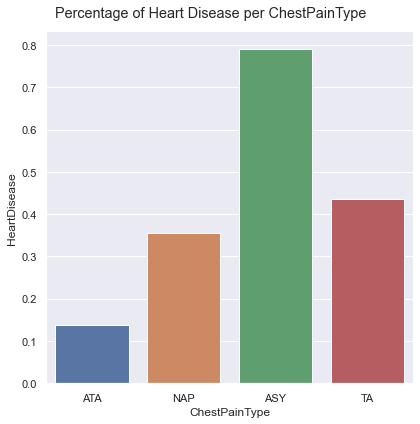

In [19]:
ax=sns.catplot(data=original_df,x='ChestPainType',y='HeartDisease',kind='bar',ci=None,height=6)
ax.fig.subplots_adjust(top=0.92) 
ax.fig.suptitle('Percentage of Heart Disease per ChestPainType')
plt.show()

These two plots shows the type of  chest pain count for both population, and the percentage of each type of pain with heart disease. Two things can be said from these plot. 
<ul>
    <li>
        An Atypical Angina pain type (ATA) is very unlikely to be related with heartdisease. 
    </li>
    <li>
        Most of the illed population had no chest pain (ASY)
        </li>

### I.4.Resting Blood Pressure

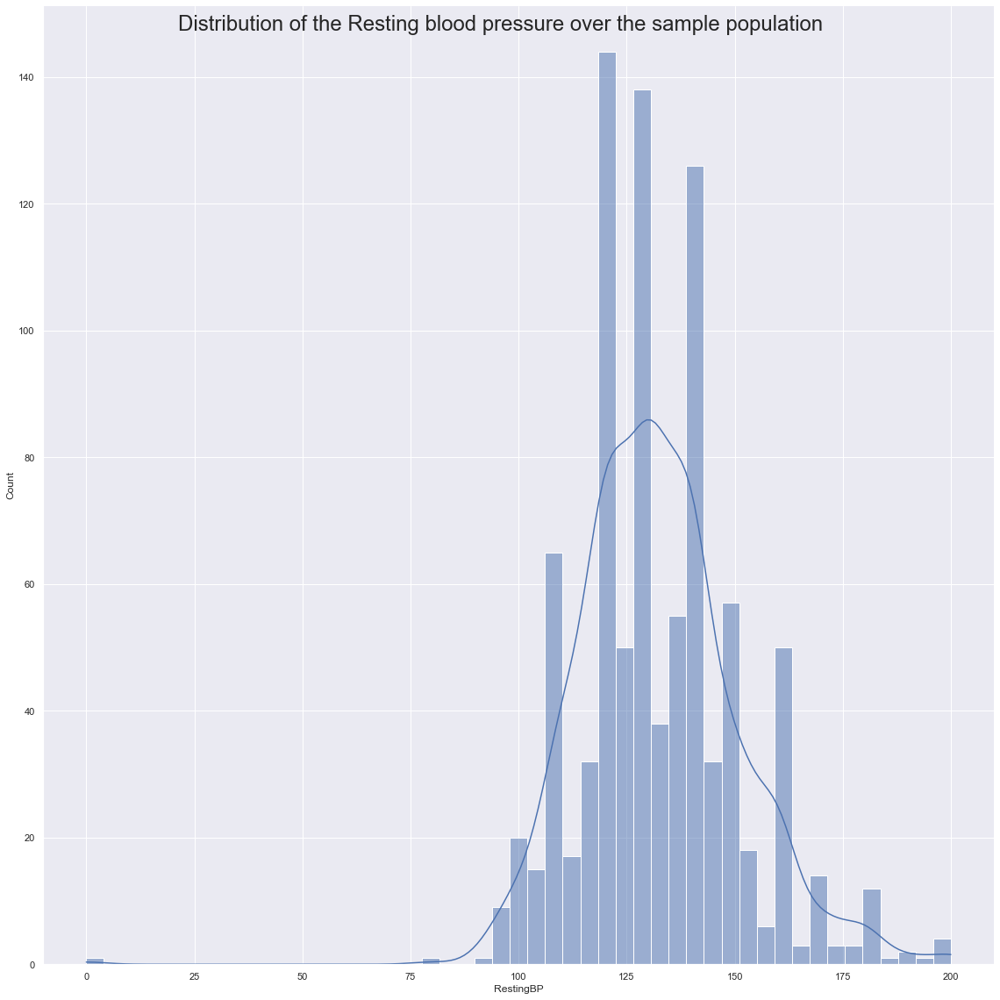

In [20]:
sns.displot(x=original_df.iloc[:,3],kde=True,height=16,legend=False)
plt.suptitle("Distribution of the Resting blood pressure over the sample population",
fontsize=24)
plt.show()

The Resting Blood Pressure distribution seems to be gaussian centered on 130. There is one outlier to drop, with a resting bp of 0, which basically would mean dead.


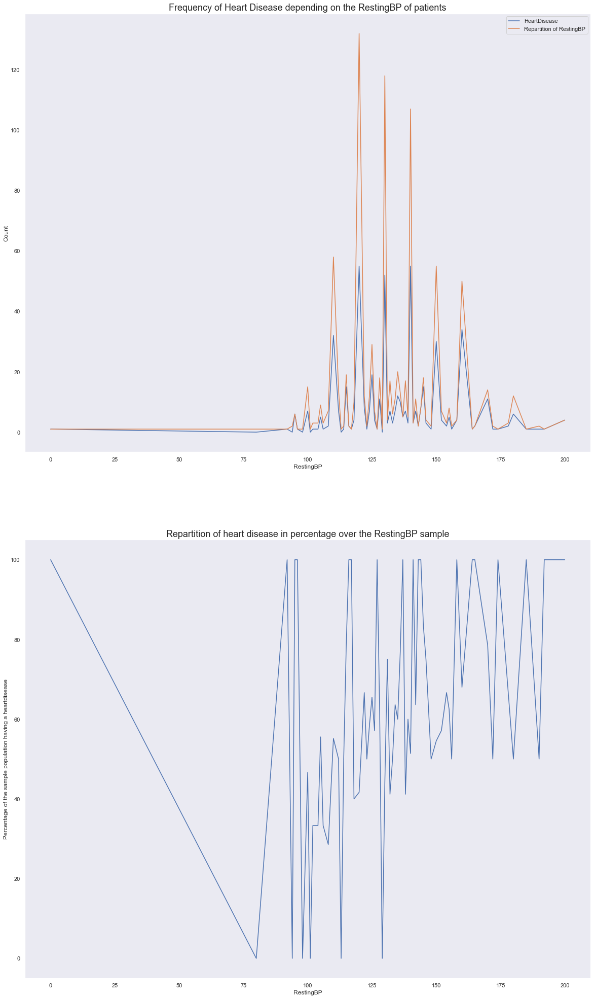

In [21]:
plot_overall('RestingBP')

For the frequency plot, it doesn't seems to have once again a particular trend. It shows that the number of heart disease increases with the number of people in the one category of age. </br> </br>Then the repartition of heart disease depending on the RestingBP is a quiet noisy graph. Moreover, one value makes no sense (0), because the blood pressure is expected to be a positive number. It seems though that the percentage increases with the RestingBP once this odd value being taken out. Applying a filter to denoise the data clearly confirm that assumption.

<br><br> The chosen filter is the Savitzky-Golay filter, because of its simplicity of use. It fits a n order polymomial for each i, using k points for the prediction. The new value is then $\hat{f}(i)$.
<br><br> 
In the example herebelow, it fits a linear model using 21 points for prediction. 

In [22]:
from scipy.signal import savgol_filter
x1=(pd.crosstab(original_df.iloc[:,11],original_df.iloc[:,3]).iloc[1,:].index)[1:]
heartdisease_count=pd.crosstab(original_df.iloc[:,11],original_df.iloc[:,3]).iloc[1,:]
k=21
n=1
yhat = savgol_filter((heartdisease_count/original_df.iloc[:,3].value_counts().sort_index()*100).iloc[1:], k, n)

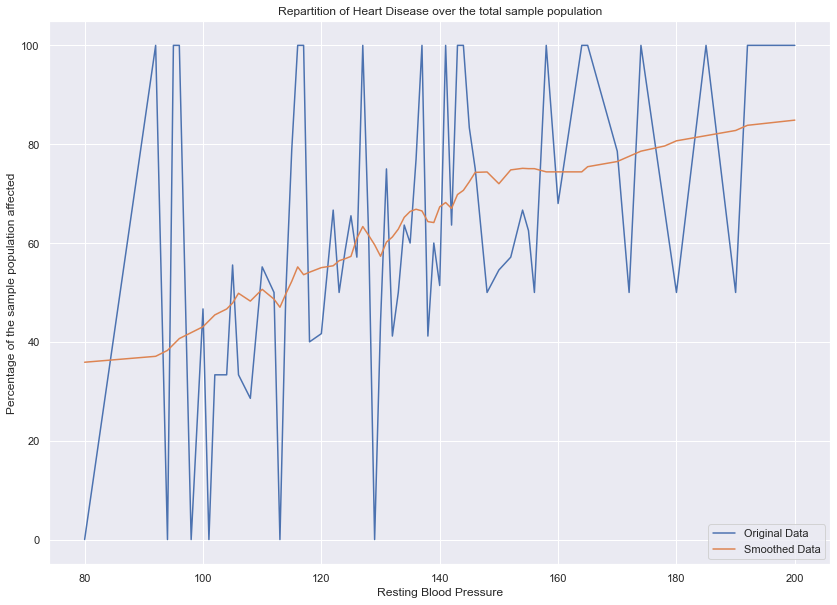

In [23]:
plt.plot((heartdisease_count/original_df.iloc[:,3].value_counts().sort_index()*100).iloc[1:],label='Original Data')
plt.title('Repartition of Heart Disease over the total sample population')
plt.plot(x1,yhat,label='Smoothed Data')
plt.xlabel('Resting Blood Pressure')
plt.ylabel('Percentage of the sample population affected')
plt.legend()
plt.show()

### I.5.Cholesterol

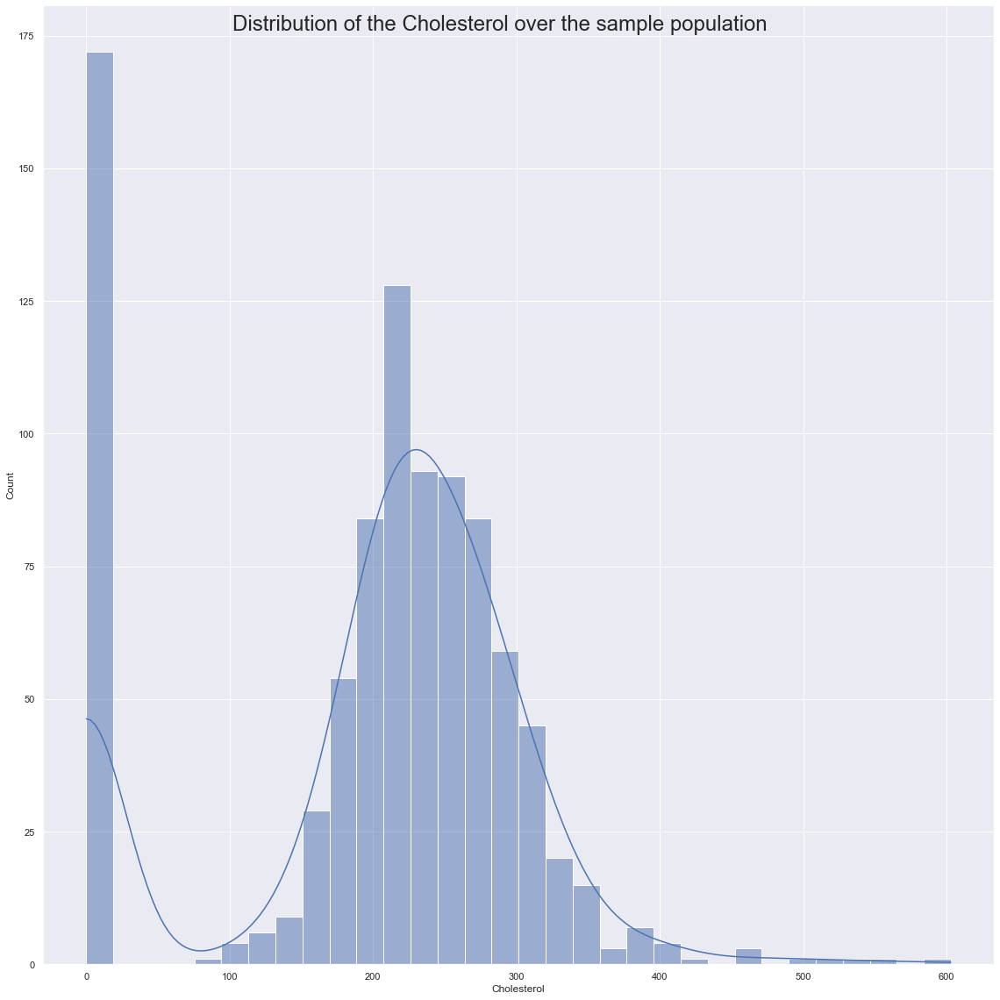

In [24]:
sns.displot(x=original_df.iloc[:,4],kde=True,height=16,legend=False)
plt.suptitle("Distribution of the Cholesterol over the sample population",
fontsize=24)
plt.show()

The cholesterol level is a bit tricky. The 0 represents a big proportion of the sample population, so it would be better to keep it in the dataset 
</br></br>
The very high value are sever case of cholesterol, these are possible values.
<br><br>
First of all, it is important to see the responses associated to this 0

In [25]:
pd.crosstab(original_df.iloc[:,4][original_df.iloc[:,4]==0],original_df.iloc[:,11][original_df.iloc[:,4]==0],normalize='index')

HeartDisease,0,1
Cholesterol,,
0,0.116279,0.883721


Most of the 0 are associated with a heart disease (over 88%). Knowing that, it is very likely that these 0 come from a dataset where cholesterol wasn't reported. (Data comes from several different dataset).
<br><br>
It is obvious that these runs cannot be used as it is, because the model will be biased by these missing values. 

Because, all of the other features for this data are relevant, it would be better to find a way to keep these values.
<br><br>
Some simple solutions are proposed in a first stage:

#### Option 1 : Cholesterol as a binary variable

For the first option, the strategy is to set a threshold splitting high cholesterol and low cholesterol into two categories

In [26]:
np_cho=original_df.iloc[:,4].copy()
for i in range(0,np_cho.size):
    if np_cho[i]<200:
        np_cho[i]=0
    else:
        np_cho[i]=1
cho_unique,cho_count=np.unique(np_cho,return_counts=True)

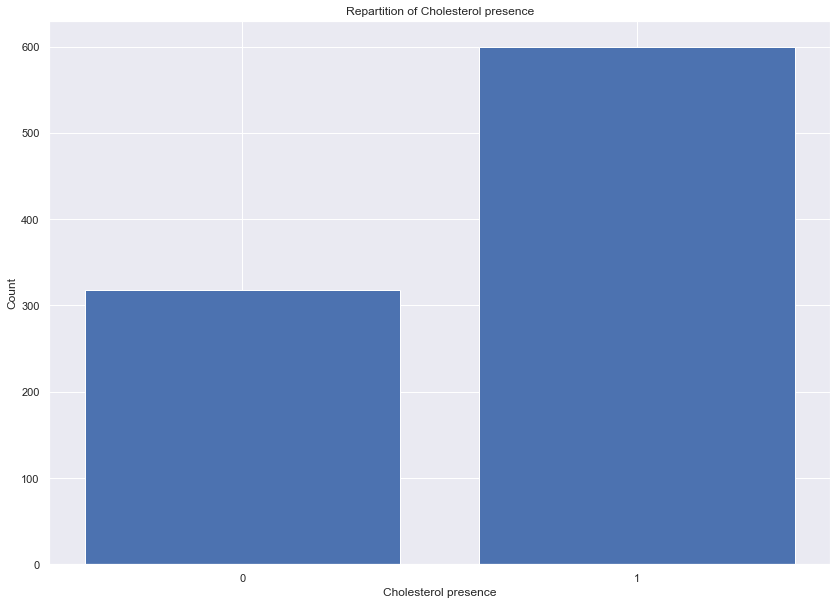

In [27]:
plt.bar(cho_unique,height=cho_count)
plt.xlabel('Cholesterol presence')
plt.xticks([0,1])
plt.ylabel('Count')
plt.title('Repartition of Cholesterol presence')
plt.show()

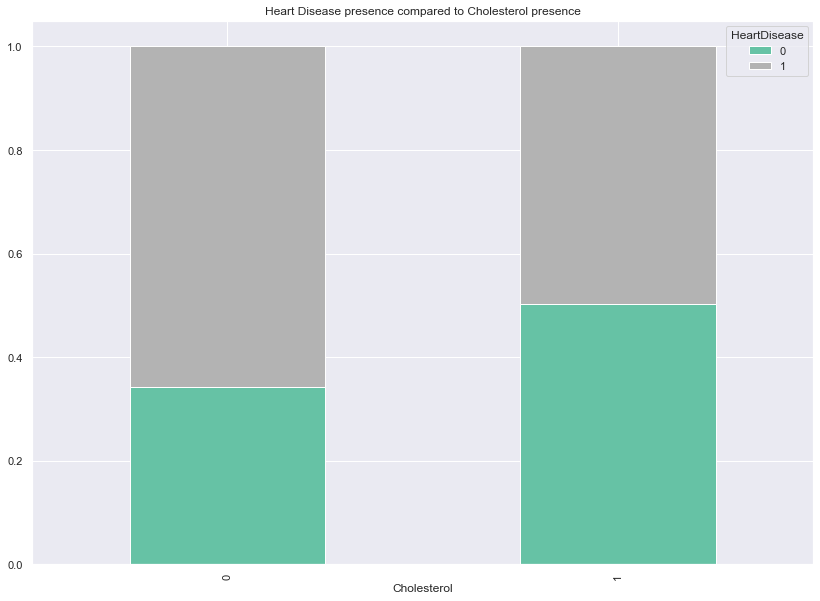

In [28]:
pd.crosstab(np_cho,original_df.iloc[:,11],normalize='index').plot(kind='bar',stacked=True,cmap='Set2')
plt.title('Heart Disease presence compared to Cholesterol presence')
plt.show()

In [29]:
pb=stats.pointbiserialr(np_cho,original_df.iloc[:,11])
pb

PointbiserialrResult(correlation=-0.15208541911533593, pvalue=3.6808518091207524e-06)

Both value are binary, so the Point biserial correlation is a better indicator of a possible correlation between the variables. 
<br><br>
When treated as categorical, the cholesterol level has a weak correlation with the risk of heart disease.
<br><br>
On this sample, it is important to notice that about 37% of people without cholesterol are 
healthy, and about 50% for people with cholesterol.
<br><br>
These numbers are against the current medical knowledge. A high cholesterol is known to induce cardiac problems

#### Option 2 : Cholesterol as a numerical variable

Another strategy is to deal with the cholesterol value as numerical value. But to do so, it is needed to 'guess' the possible values for the missing cholesterol. Knowing that about 90% of the missing cholesterol population had an heart disease, one guess would be that the average cholesterol value for this population was quiet high.
<br><br>
Then it is possible to generate a list of cholesterol value following a gaussian distribution and centered on a high cholesterol value.

In [30]:
cholesterol_x=original_df.iloc[:,4].copy()
number=cholesterol_x[cholesterol_x==0].value_counts()
mu=220
sd=20
new_distri=np.random.normal(mu,sd,number)

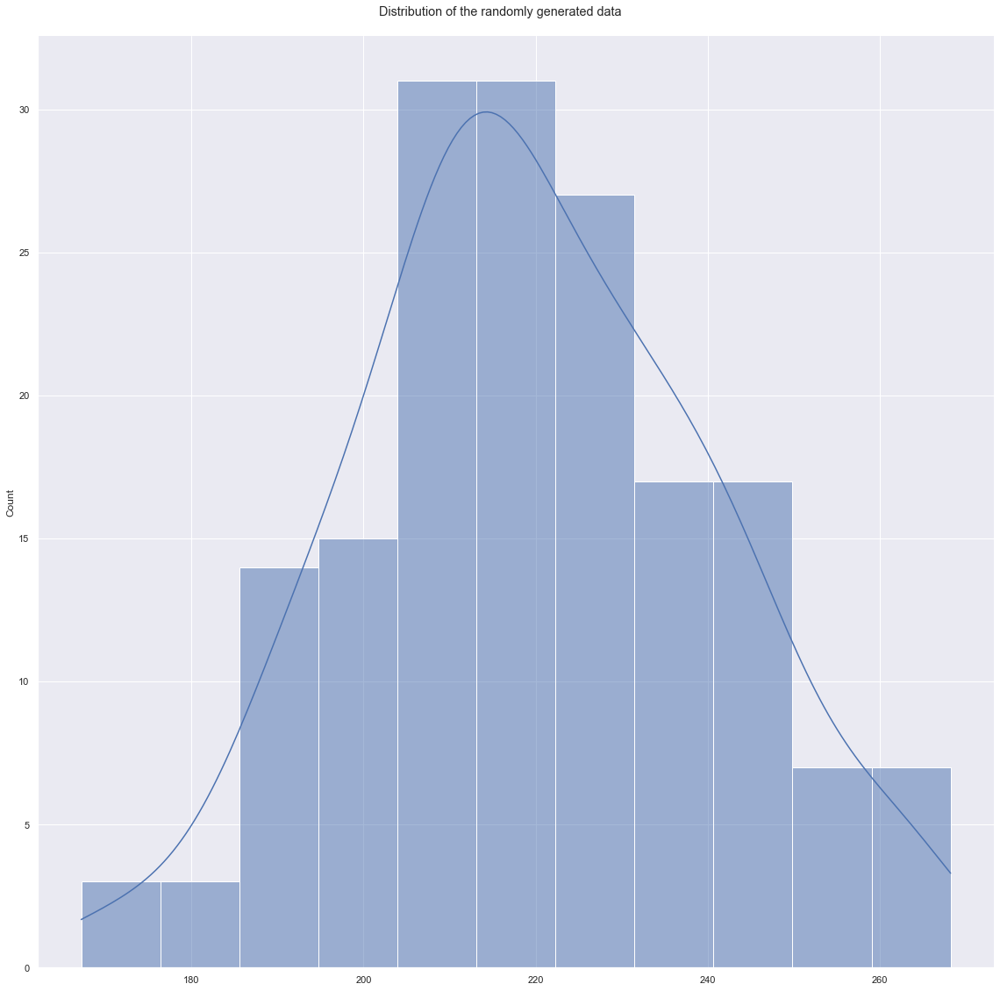

In [31]:
ax=sns.displot(x=new_distri,kde=True,height=16,legend=False)
ax.fig.subplots_adjust(top=0.95) 
ax.fig.suptitle('Distribution of the randomly generated data')
plt.show()

In [32]:
np_co=np.asarray(cholesterol_x)
n=0
for i in range(0,np_co.size):
    if np_co[i]==0:
        np_co[i]=new_distri[n]
        n=n+1
    else:
        pass

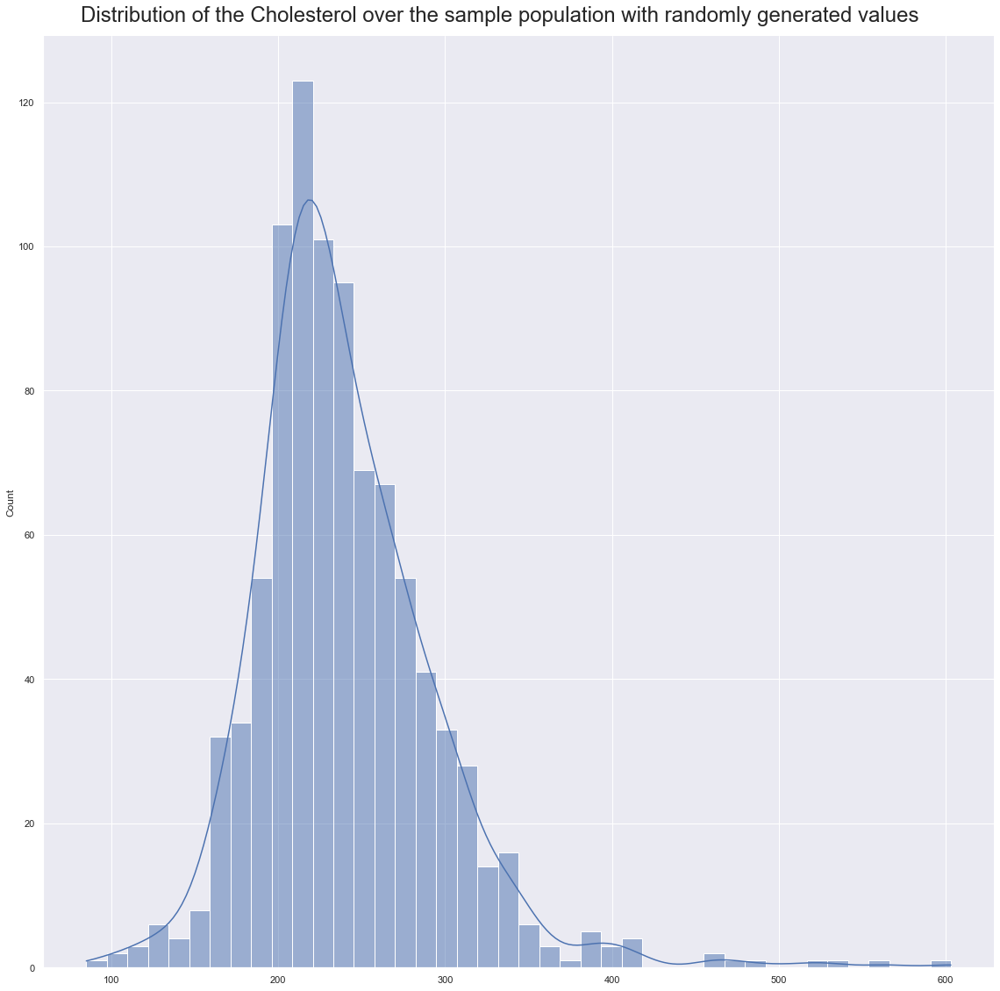

In [33]:
sns.displot(x=np_co,kde=True,height=16,legend=False)
plt.suptitle("Distribution of the Cholesterol over the sample population with randomly generated values",
fontsize=24)
plt.subplots_adjust(top=0.95) 
plt.show()

In [34]:
cross_value=pd.crosstab(np_co,original_df.iloc[:,11])
for i in range (0,cross_value.shape[0]):
    cross_value.iloc[i,0],cross_value.iloc[i,1]=cross_value.iloc[i,:]/(cross_value.iloc[i,0]+cross_value.iloc[i,1])

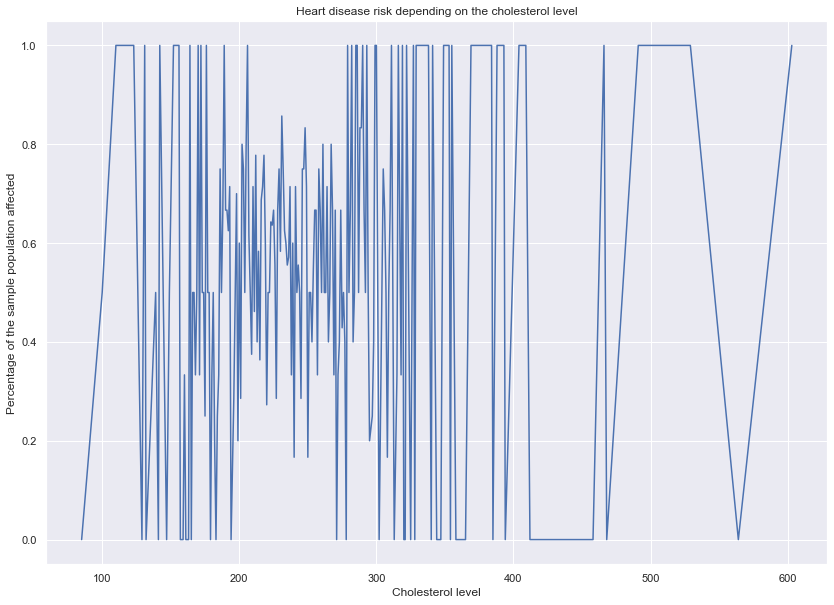

In [35]:
plt.plot(cross_value.index,cross_value[1])
plt.title('Heart disease risk depending on the cholesterol level')
plt.xlabel('Cholesterol level')
plt.ylabel('Percentage of the sample population affected')
plt.show()

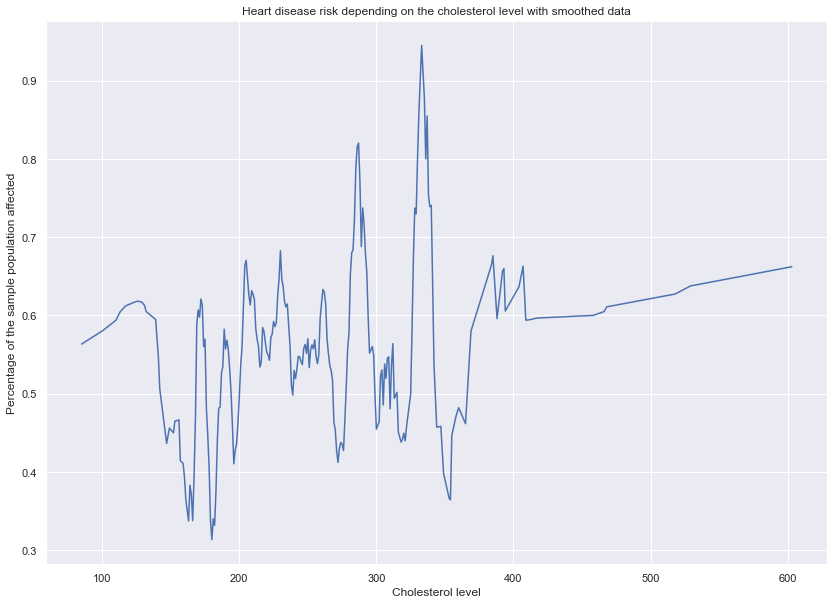

In [36]:
yhat_1 = savgol_filter(cross_value.iloc[:,1],21, 2)
plt.plot(cross_value.index,yhat_1)
plt.title('Heart disease risk depending on the cholesterol level with smoothed data')
plt.xlabel('Cholesterol level')
plt.ylabel('Percentage of the sample population affected')
plt.show()

There are no clear evidence of any impact of the cholesterol level over the risk of getting an heart disease using a gaussian distribution to replace the missing value.

In [37]:
pb=stats.pointbiserialr(np_co,original_df.iloc[:,11])
pb

PointbiserialrResult(correlation=0.03395507500171286, pvalue=0.3040989898337783)

Moreover the point biserial result is very low, meaning that there is a very weak correlation between this new data and the risk of heart disease.
<br><br>
It is needed to replace this missing values, thus an entire part of this project will be dedicated to the imputation of a new cholesterol value.

### I.6. Fasting Blood Sugar

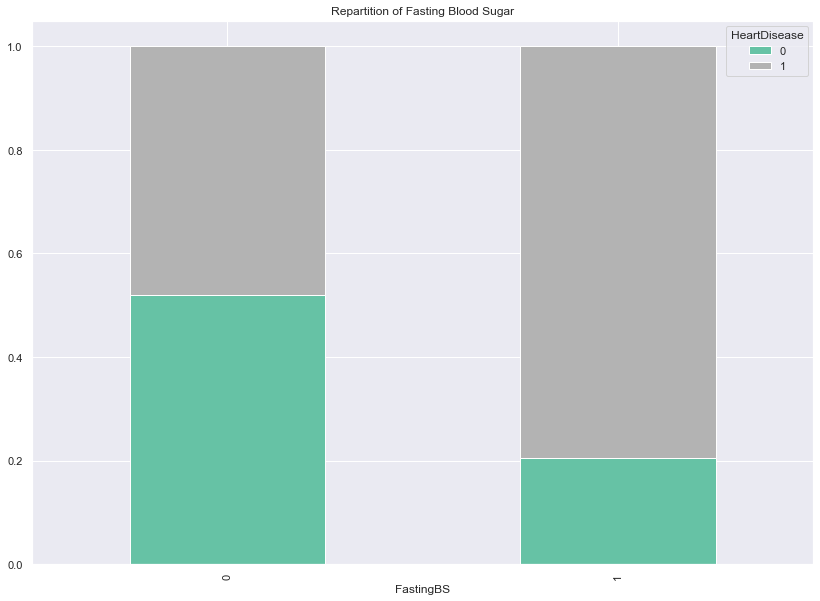

In [38]:
pd.crosstab(original_df.iloc[:,5],original_df.iloc[:,11],normalize='index').plot(kind='bar',stacked=True,cmap='Set2')
plt.title('Repartition of Fasting Blood Sugar')
plt.show()

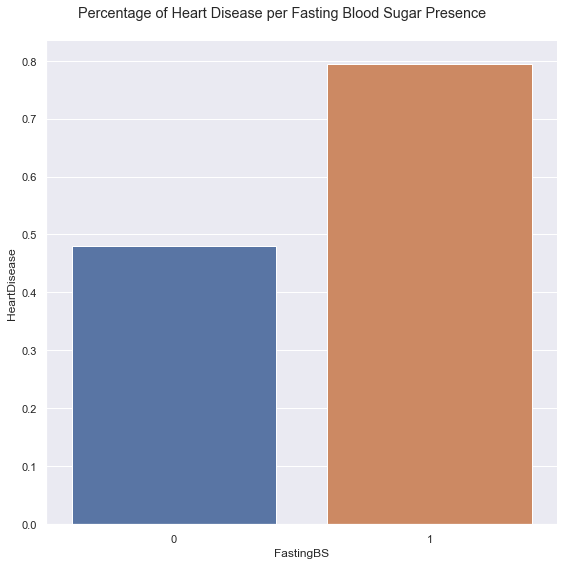

In [39]:
ax=sns.catplot(data=original_df,x='FastingBS',y='HeartDisease',kind='bar',ci=None,height=8)
ax.fig.subplots_adjust(top=0.92) 
ax.fig.suptitle('Percentage of Heart Disease per Fasting Blood Sugar Presence')
plt.show()

In [40]:
pd.crosstab(original_df.iloc[:,5],original_df.iloc[:,11])

HeartDisease,0,1
FastingBS,,
0,366,338
1,44,170


In [41]:
print('Percentage of the sample population without diabete affected by heart disease : '+str(round(338/(366+338)*100,2))+'%')
print('Percentage of the smaple population with diabete affected by heart disease : '+str(round(170/(170+44)*100,2))+'%')

Percentage of the sample population without diabete affected by heart disease : 48.01%
Percentage of the smaple population with diabete affected by heart disease : 79.44%


Fasting Blood Sugar is an indicator of Diabete. According to the data, and medical knowledge, diabete increases the odds of Heart Disease. In fact, without diabete, the odds are almost 50/50  of getting an heart disease. However, the presence of diabete makes this value rise to 80%. 

### I.7.Resting ECG

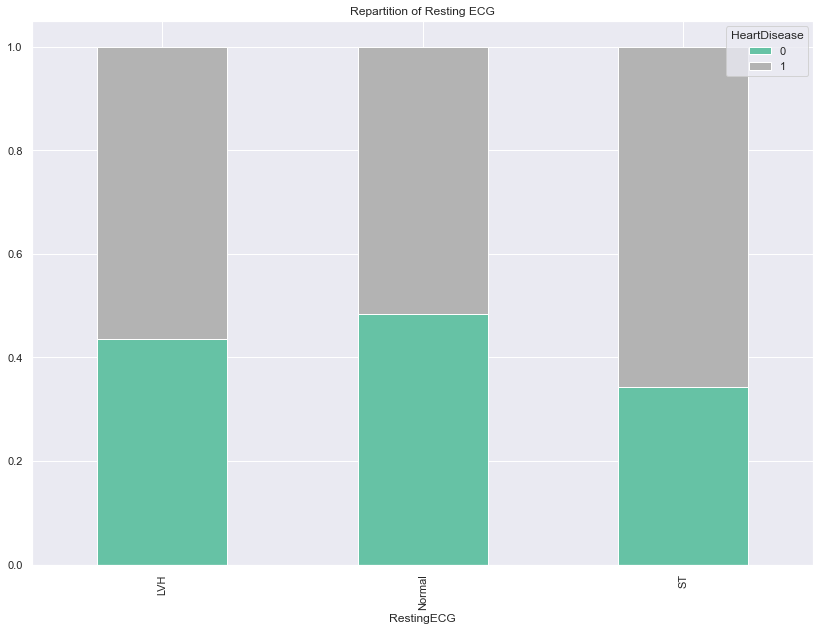

In [42]:
pd.crosstab(original_df.iloc[:,6],original_df.iloc[:,11],normalize='index').plot(kind='bar',stacked=True,cmap='Set2')
plt.title('Repartition of Resting ECG')
plt.show()

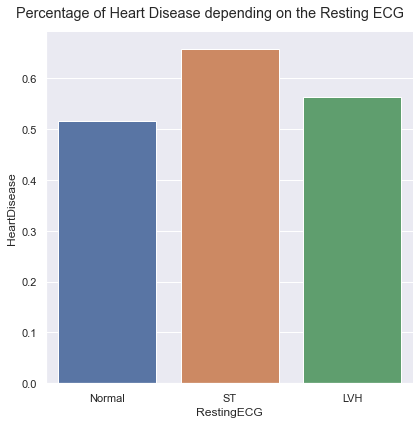

In [43]:
ax=sns.catplot(data=original_df,x='RestingECG',y='HeartDisease',kind='bar',ci=None,height=6)
ax.fig.subplots_adjust(top=0.92) 
ax.fig.suptitle('Percentage of Heart Disease depending on the Resting ECG')
plt.show()

In [44]:
pd.crosstab(original_df.iloc[:,6],original_df.iloc[:,11])

HeartDisease,0,1
RestingECG,,
LVH,82,106
Normal,267,285
ST,61,117


In [45]:
print('Percentage of the sample population showing a left ventricular hypertrophy affected : '+str(round(106/(106+82)*100,2))+'%')
print('Percentage of the sample population showing a ST-T wave abnormality affected : '+str(round(117/(117+61)*100,2))+'%')
print('Percentage of the sample population showing a normal ECG affected : '+str(round(285/(285+267)*100,2))+'%')

Percentage of the sample population showing a left ventricular hypertrophy affected : 56.38%
Percentage of the sample population showing a ST-T wave abnormality affected : 65.73%
Percentage of the sample population showing a normal ECG affected : 51.63%


For the resting ECG, it is very mitigated. One would have guess that a normal ECG means a lower risk of Heart Disease, but this is slightly the case. An abnormal ECG increases the odds of Heart Disease (ie. ST).

### I.8. Maximum Heart Rate

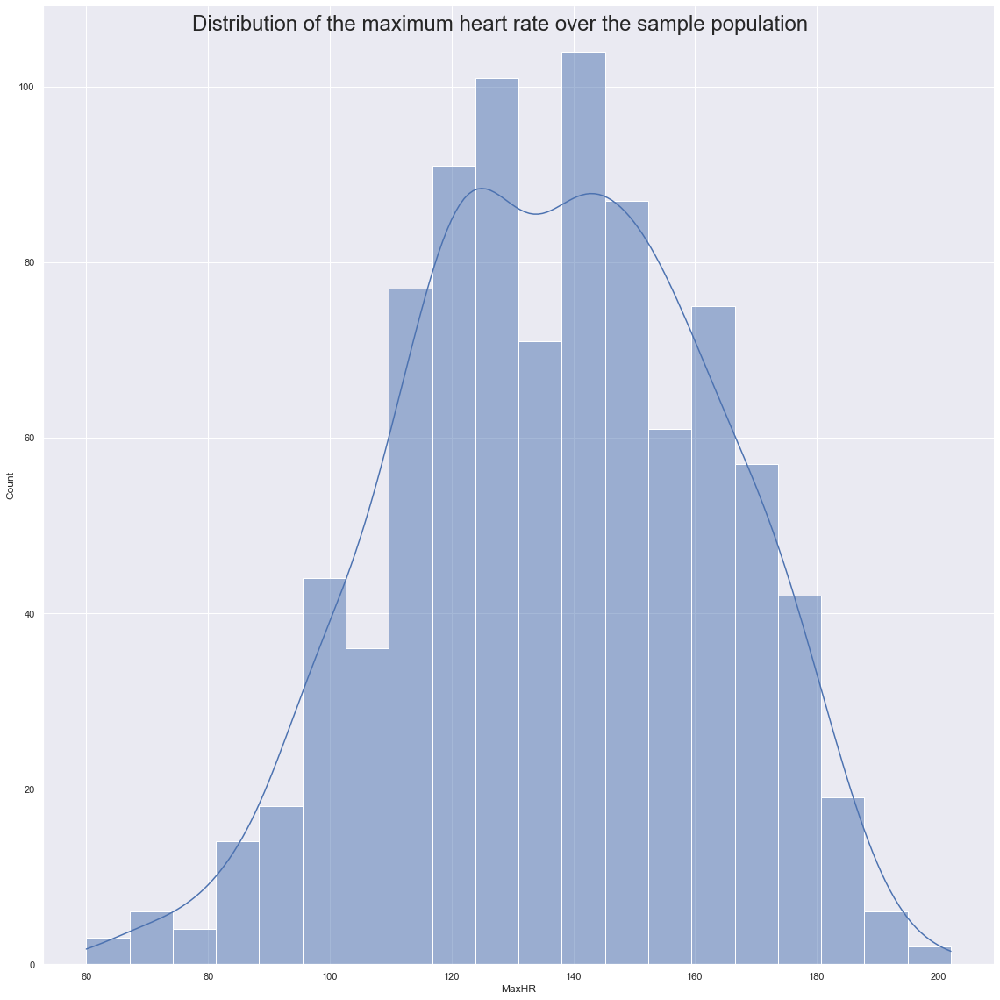

In [46]:
sns.displot(x=original_df.iloc[:,7],kde=True,height=16,legend=False)
plt.suptitle("Distribution of the maximum heart rate over the sample population",
fontsize=24)
plt.show()

There are no clear outliers for the MaxHR variable. Once again, the repartition of the values could be approximated by a gaussian distribution centered on 130-140.

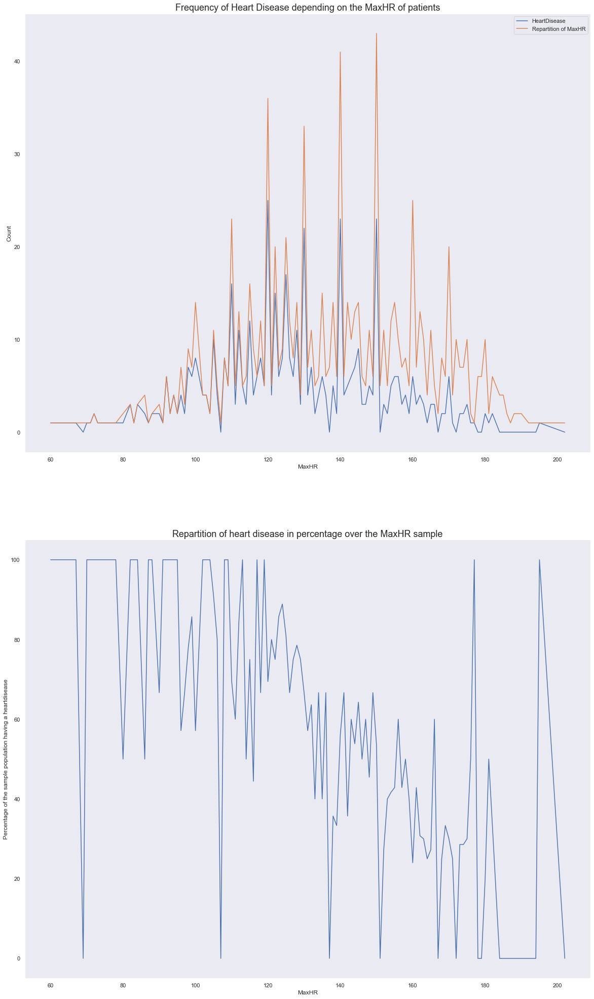

In [47]:
plot_overall('MaxHR')

The Maximum heart rate is one of the most correlated feature with the response according to the correlation matrix, with a correlation of -0.4 . 
Even though the count is skewed by the sample distribution, which is not uniform, the repartition in percentage shows a clear decreasing trend between the percentage of population having a heart disease an the maximum HR.

### I.9. Exercice Angina

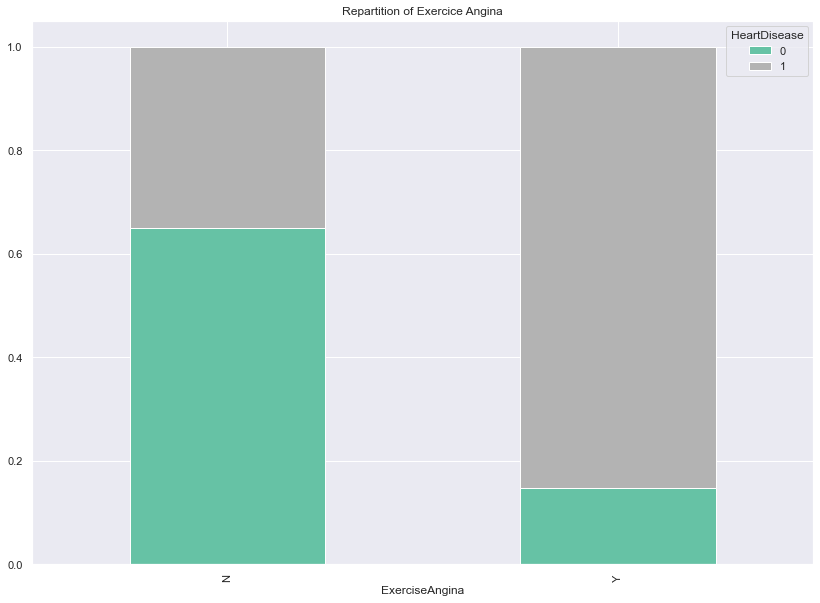

In [48]:
pd.crosstab(original_df.iloc[:,8],original_df.iloc[:,11],normalize='index').plot(kind='bar',stacked=True,cmap='Set2')
plt.title('Repartition of Exercice Angina')
plt.show()

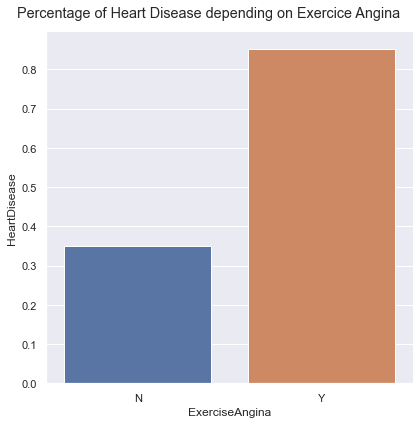

In [49]:
ax=sns.catplot(data=original_df,x='ExerciseAngina',y='HeartDisease',kind='bar',ci=None,height=6)
ax.fig.subplots_adjust(top=0.92) 
ax.fig.suptitle('Percentage of Heart Disease depending on Exercice Angina ')
plt.show()

There is an obvious correlation between Heart Disease and Exercise Angina (chest pain due to exercise), as 35% of population without Exercise Angina had an Heart Disease, but around 85% for those with Exercise Angina

### I.10. Old Peak

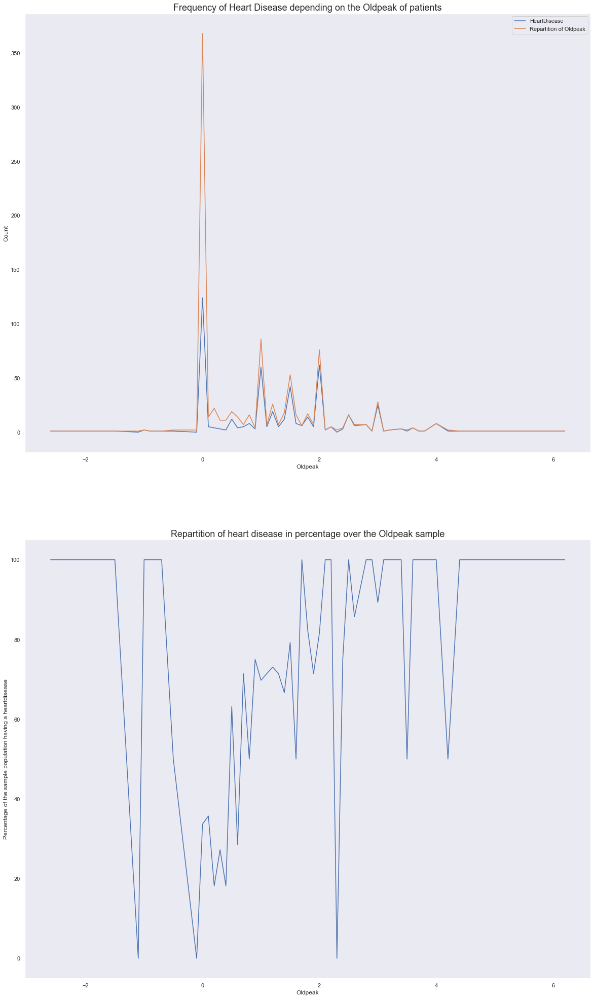

In [50]:
plot_overall('Oldpeak')

Oldpeak is a measurement of the deviation over a flat line of an ECG segment. This is measured as a depression, and negative values should become positive.

In [51]:
original_df.Oldpeak=abs(original_df.Oldpeak)

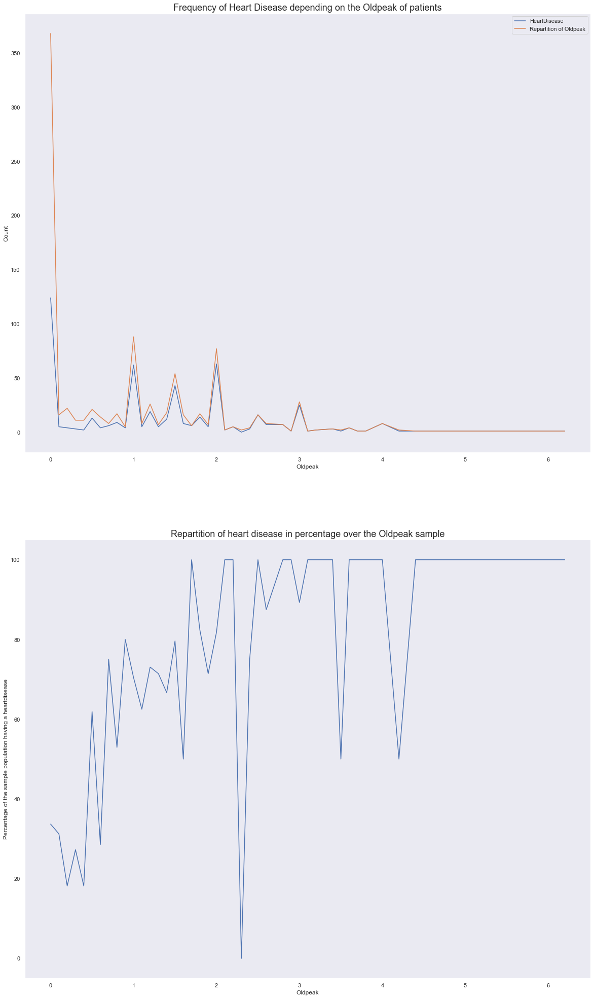

In [52]:
plot_overall('Oldpeak')

The Oldpeak is clearly correlated with heartdisease, as expected. The higher it gets, the higher the odds of heart disease gets. And it makes sense, as this value depicts how weak is the heart

### I.11. ST Slope

Before diving into the analysis of this feature, it is better to understand its meaning. On an ECG, after an heartbeat, the signal values sent to the heart decreases, becoming negative after a peak. The ST slope is then the trend of the section between the S and the start of T (in the picture below). Usually it tends to have a slight upward trend. However, in some cases, mostly related with myocardial infection, it can have a a flat or downslopping shape.

![Pic](img\ST-segment-depression-upsloping-downsloping-horizontal.png)

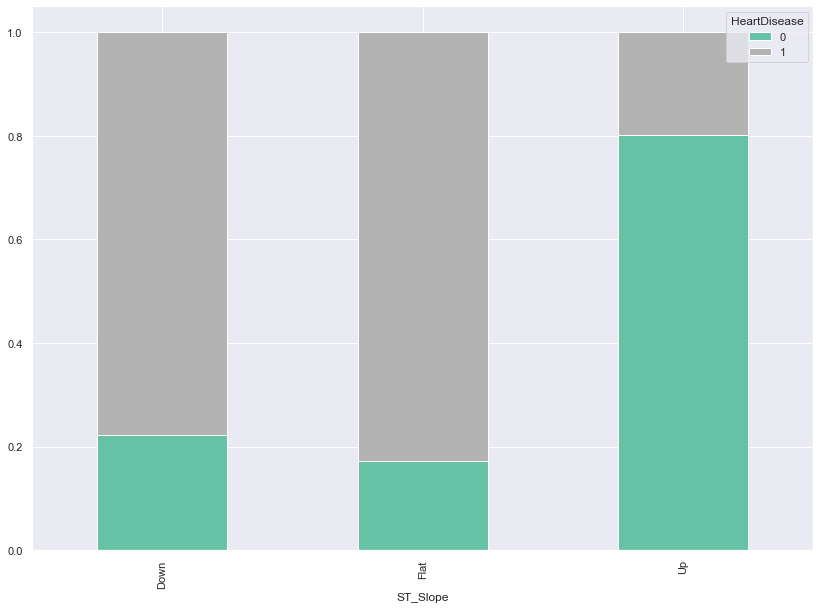

In [53]:
pd.crosstab(original_df.iloc[:,10],original_df.iloc[:,11],normalize='index').plot(kind='bar',stacked=True,cmap='Set2')
plt.show()

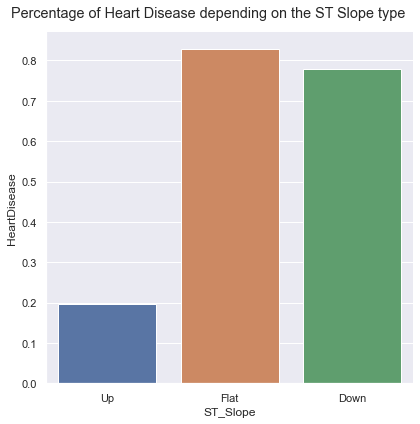

In [54]:
ax=sns.catplot(data=original_df,x='ST_Slope',y='HeartDisease',kind='bar',ci=None,height=6)
ax.fig.subplots_adjust(top=0.92) 
ax.fig.suptitle('Percentage of Heart Disease depending on the ST Slope type ')
plt.show()

In [55]:
pd.crosstab(original_df.iloc[:,10],original_df.iloc[:,11])

HeartDisease,0,1
ST_Slope,,
Down,14,49
Flat,79,381
Up,317,78


In [56]:
print('Percentage of the sample population showing a downward trend affected : '+str(round(49/(49+14)*100,2))+'%')
print('Percentage of the sample population showing a flat trend affected : '+str(round(381/(381+79)*100,2))+'%')
print('Percentage of the sample population showing an upward trend affected : '+str(round(78/(78+317)*100,2))+'%')

Percentage of the sample population showing a downward trend affected : 77.78%
Percentage of the sample population showing a flat trend affected : 82.83%
Percentage of the sample population showing an upward trend affected : 19.75%


ST Slope is one of the highest correlated feature with heart disease. Indeed, as the graphs shows, an heart disease is very likely to happen if the slope is flat or downslopping. The risks are increased by 400% if the slope is not going upward

### Summary

Now that every single feature has been analyzed a first time, some conclusion can be drawn, and data can be transformed toward a more meaningful shape.

<ol>
    <li>Age has a positive correlation;</li>
    <li>Men are most likely to get heart disease than women;</li>
    <li>Most of the population with heart disease does not have any particular chest pain;</li>
    <li>Resting Blood Pressure has a positive correlation, one outlier needs to be removed;</li>
    <li>Cholesterol needs to be preprocessed as there are 0 values;</li>
    <li>Having diabete increases the odds of having an heart disease; </li>
    <li>A normal Resting ECG does not decrease the odds;</li>
    <li>Maximum HR has a negative correlation;</li>
    <li>An Exercice angina is highly correlated;</li>
    <li>Old peak feature has a positive correlation;</li>
    <li>The ST_slope being something else than Up increases the odds of heart disease of 400%;</li>
    
</ol>

## II. Preprocessing

Two actions need to be taken:
<ul>
    <li>Remove the outlier for RestingBloodPressure=0</li>
    <li>Deal with the missing cholesterol values</li>
</ul>

Removing the outlier is a fairly simple operation:

In [57]:
original_df[original_df.RestingBP==0]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
449,55,M,NAP,0,0,0,Normal,155,N,1.5,Flat,1


In [58]:
original_df.drop(index=449,axis=0,inplace=True)

In [59]:
original_df[original_df.RestingBP==0]

,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease


### II.1. Cholesterol  missing values imputation

In [60]:
original_df.Cholesterol[original_df.Cholesterol==0].value_counts()

0    171
Name: Cholesterol, dtype: int64

There are 171 missing values.
<br><br>
In order to keep the 170 runs with the cholesterol missing values, it is necessary to find a way to replace these 0s. 
<br>
The strategy here is to find a model predicting the cholesterol value that have a fairly good prediction rate
<br><br>
The metric used to compare these imputing methods is chosen to be the accuracy of the classifiers 

First, it is needed to transform the categorical variable, one hot encoding them.

In [61]:
#insert dummy variables to get rid of categorical variables

knn_df=original_df.copy()

dummy_1=pd.get_dummies(knn_df.iloc[:,1])
dummy_2=pd.get_dummies(knn_df.iloc[:,2])
dummy_6=pd.get_dummies(knn_df.iloc[:,6])
dummy_8=pd.get_dummies(knn_df.iloc[:,8])
dummy_10=pd.get_dummies(knn_df.iloc[:,10])

knn_df.drop(['Sex','ChestPainType','RestingECG','ExerciseAngina','ST_Slope'],axis=1,inplace=True)

knn_df=knn_df.join(dummy_1).join(dummy_2).join(dummy_6).join(dummy_8).join(dummy_10)

In [62]:
#getting the different data organized
# main code from sklearn  
from sklearn.preprocessing import StandardScaler,MinMaxScaler,RobustScaler,PowerTransformer,normalize
from sklearn.ensemble import RandomForestClassifier
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import SimpleImputer, KNNImputer, IterativeImputer
from sklearn.model_selection import cross_val_score, GridSearchCV, RandomizedSearchCV,train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import BayesianRidge, ElasticNet
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.neighbors import KNeighborsRegressor
import xgboost as xgb
from sklearn.metrics import roc_auc_score

#classifier used to compare the different imputers, randomly chosen
clf = RandomForestClassifier()


def get_train_test_val(X_full,y_full,test_ratio):
#function to permorm two train test split in a row, in order to get a train, test and validation set
    X_full_train, X_test, y_full_train, y_test = train_test_split(
        X_full, y_full, test_size=test_ratio, stratify=y_full
    )
    X_train, X_val, y_train, y_val = train_test_split(
        X_full_train, y_full_train, test_size=test_ratio, stratify=y_full_train
    )
    return X_train,y_train,X_test,y_test,X_val,y_val 

#
def get_clean_score(X_clean,y_clean,clf=clf):
    #get score if no imputer is used. All the patients with missing cholesterol are dropped out
    clean_scores = cross_val_score(
        clf, scaler.fit_transform(X_clean), y_clean, scoring='accuracy', cv=10
    )
    return clean_scores.mean(), clean_scores.std()

def get_scores_for_imputer(imputer,X_full, y_full,clf=clf):
    #perform a crossvalidation on imputed data using clf
    estimator = make_pipeline(imputer,clf)
    impute_scores = cross_val_score(
        estimator, scaler.fit_transform(X_full), y_full, scoring='accuracy', cv=10
    )
    return impute_scores

def get_simple_impute_score(X_full, y_full,strategy):
    imputer = SimpleImputer(
        missing_values=np.nan, strategy=strategy, fill_value=0, add_indicator=True
    )
    simple_impute_scores = get_scores_for_imputer(imputer, X_full, y_full)
    return simple_impute_scores.mean(), simple_impute_scores.std()

def get_iterative_impute_score(X_full, y_full, strategy):
    imputer = IterativeImputer(
        missing_values=np.nan, estimator=strategy, add_indicator=True,max_iter=20
    )
    iterative_impute_scores = get_scores_for_imputer(imputer, X_full, y_full)
    return iterative_impute_scores.mean(), iterative_impute_scores.std()

def plot_imputers(x_labels,acc_mean,acc_std):
    fig, ax = plt.subplots(figsize=(13, 10))
    ax.barh(x_labels, acc_mean, xerr=acc_std, align='center', alpha=0.5, ecolor='black', capsize=10)
    ax.set_ylabel('Imputing Technique')
    ax.set_xlabel('Accuracy score of the prediction')
    ax.set_title('Accuracy score of prediction of different Imputing techniques')
    ax.yaxis.grid(True)
    plt.xlim([0.75,1])




The data is split this way:
<ul>
    <li> Full set, containing the entire dataset </li>
    <li> Clean set, containing only patients with a valid cholesterol value </li>
    <li> Missing set, containing all the patients with missing cholesterol value </li>
    
</ul>

In [63]:
scaler=StandardScaler()

X_full=knn_df.drop('HeartDisease',axis=1).copy()
X_full.Cholesterol.replace(0,np.nan,inplace=True)
X_clean=X_full[X_full.Cholesterol.isnull()==False]
X_missing=X_full[X_full.Cholesterol.isnull()==True].copy()

y_full=knn_df.HeartDisease
y_clean=knn_df[knn_df.Cholesterol!=0].HeartDisease
y_missing=knn_df[knn_df.Cholesterol==0].HeartDisease

#### II.1.a. Simple Imputing

The use of the sklearn.imput class allows a quick lookout on different simple and elaborated imputing techniques.
<br> The simple imputers are:
<ul>
    <li> Only keep the clean dataset, thus getting rid of patients with missing cholesterol</li>
    <li> Fill the missing values with 0</li>
    <li> Fill the missing values with the median of the feature's values</li>
    <li> Fill the missing values with the mean of the feature's values</li>
</ul>

With iterative imputers, a model is fitted to predict the missing values, the different models are:
<ul>
    <li> Bayesian Ridge Regression </li>
    <li> Decision Tree Regressor</li>
    <li> Extra Tree Regressor</li>
    <li> KNeighborsRegressor</li>
</ul>


In [64]:
simple_strategy=['constant','median','mean']

iterative_strategy=[BayesianRidge(),
                    DecisionTreeRegressor(max_features="sqrt"),
                    ExtraTreesRegressor(n_estimators=15),
                    KNeighborsRegressor(n_neighbors=15)]

x_labels=['Clean Data','Simple fill w/ 0','Simple Median','Simple Mean','Iterative w/ BayesianRidge',
         'Iterative w/ Decision Tree','Iterative w/ ExtraTrees','Iterative with KN Reg',
          'Cholesterol data dropped']

The base code has been built over this piece of code to rank different imputers.

https://scikit-learn.org/stable/auto_examples/impute/plot_missing_values.html#sphx-glr-auto-examples-impute-plot-missing-values-py

In [65]:
acc_mean = np.zeros(9)
acc_std=np.zeros(9)

i=0

acc_mean[0], acc_std[0] = get_clean_score(scaler.fit_transform(X_clean), y_clean)
i+=1

for strat in simple_strategy:
    acc_mean[i], acc_std[i] = get_simple_impute_score(X_full, y_full,strategy=strat)
    i+=1
    
for strat in iterative_strategy:
    acc_mean[i], acc_std[i] = get_iterative_impute_score(X_full, y_full,strategy=strat)
    i+=1

chol_drop=cross_val_score(clf, scaler.fit_transform(X_full.drop('Cholesterol',axis=1))
                          , y_full, scoring="accuracy", cv=10)
acc_mean[i], acc_std[i]=chol_drop.mean(),chol_drop.std()

pd.DataFrame(np.c_[acc_mean,acc_std],
                   columns=['Prediction accuracy','Prediction Standard Deviation'],
                   index=x_labels)

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\impute\_iterative.py:699: ConvergenceWarning: [IterativeImputer] Early stopping cr

,Prediction accuracy,Prediction Standard Deviation
Clean Data,0.866901,0.068551
Simple fill w/ 0,0.851469,0.055465
Simple Median,0.856976,0.049874
Simple Mean,0.851505,0.048212
Iterative w/ BayesianRidge,0.855865,0.055839
Iterative w/ Decision Tree,0.852616,0.041811
Iterative w/ ExtraTrees,0.859126,0.049759
Iterative with KN Reg,0.853727,0.049938
Cholesterol data dropped,0.854778,0.055027


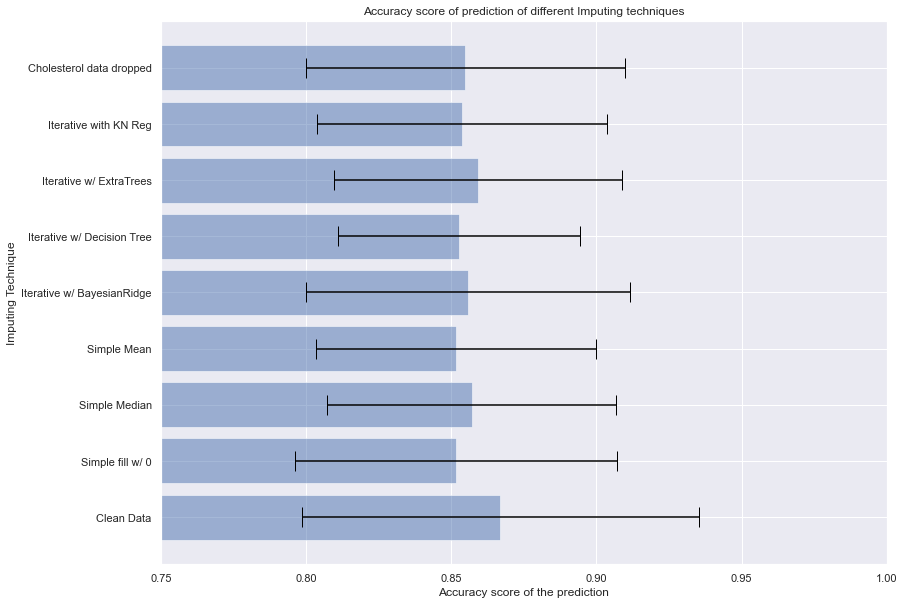

In [66]:
plot_imputers(x_labels,acc_mean,acc_std)

For simple and iterative imputers, the best score is most of the time 'Clean Data'.
However, by fine tuning some of the classifiers, and adding other models to this list, it might be possible to add more accuracy to these predictions

In [67]:
train_imp=knn_df[knn_df.Cholesterol!=0].copy()
y_fulltrain_imp=train_imp.Cholesterol
X_fulltrain_imp=train_imp.drop('Cholesterol',axis=1)

miss_imp=knn_df[knn_df.Cholesterol==0].copy()
y_miss_imp=miss_imp.Cholesterol
X_miss_imp=miss_imp.drop('Cholesterol',axis=1)

#### II.2.b. Custom Imputer

The scikitlearn.impute class didn't yield satisfactory results, and all the advanced algorithms used were not fine tuned. Moreover, other algorithms can be used.
<br><br>
The model accuracy evaluation is done as followed:
<ul>
    <li> First perform a RandomGridSearch on the algorithm hyperparameters</li>
    <li> Use the results to perform a second round of GridSearchCV, using a $\pm$ k interval around each parameters</li>
    <li> Consider the result of the second gridsearch as the 'best estimator', and measure accuracy using this estimator </li>
<ul>

In [68]:
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout

def manual_score(best_estimator,X_missing_chol=X_miss_imp,y_missing_chol=y_miss_imp,
                 X_clean=X_fulltrain_imp,y_clean=y_fulltrain_imp):
    X_full=X_clean.append(X_missing_chol)
    chol_pred=pd.Series(best_estimator.predict(scaler.fit_transform(X_missing_chol)),index=y_missing_chol.index)
    chol_full_man=y_clean.append(chol_pred)
    X_full['Cholesterol']=chol_full_man
    y_full=X_full.HeartDisease
    X_full.drop('HeartDisease',axis=1,inplace=True)
    manual_impute_scores = cross_val_score(RandomForestClassifier(), scaler.fit_transform(X_full), y_full, scoring="accuracy", cv=20)
    return manual_impute_scores

def imputer_random_tuning(imputer,param_grid,X_fulltrain_imp=X_fulltrain_imp,
                         y_fulltrain_imp=y_fulltrain_imp):
    tuned_imputer = RandomizedSearchCV(estimator = imputer, param_distributions = param_grid,
                                     n_iter = 100, cv = 5, n_jobs = -1)
    tuned_imputer.fit(scaler.fit_transform(X_fulltrain_imp),y_fulltrain_imp)
    return tuned_imputer

def nn_manual_score(best_estimator,X_missing_chol=X_miss_imp,y_missing_chol=y_miss_imp,
                 X_clean=X_fulltrain_imp,y_clean=y_fulltrain_imp):
    X_full=X_clean.append(X_missing_chol)
    chol_pred=pd.Series(best_estimator.predict(scaler.fit_transform(X_missing_chol)).reshape(y_miss_imp.index.shape),index=y_miss_imp.index)
    chol_full_man=y_clean.append(chol_pred)
    X_full['Cholesterol']=chol_full_man
    y_full=X_full.HeartDisease
    X_full.drop('HeartDisease',axis=1,inplace=True)
    manual_impute_scores = cross_val_score(RandomForestClassifier(), scaler.fit_transform(X_full), y_full, scoring="accuracy", cv=20)
    return manual_impute_scores


##### 1. ExtraTreesRegressor

###### a. RandomGridSearch

In [69]:
ext_reg=ExtraTreesRegressor()

random_grid = {
               'n_estimators':np.linspace(2,100,20,dtype=int),
               'max_depth': np.linspace(2,100,11,dtype=int),
               'min_samples_split': np.linspace(2,50,18,dtype=int),
               'min_samples_leaf': np.linspace(2,50,18,dtype=int),
               'min_impurity_decrease':np.linspace(2,10,19,dtype=int),
               'ccp_alpha':np.linspace(2,20,20),
               'bootstrap': [True, False]
              }

tuned_ext_reg=imputer_random_tuning(ext_reg,param_grid=random_grid)
print(tuned_ext_reg.best_params_)

{'n_estimators': 17, 'min_samples_split': 41, 'min_samples_leaf': 18, 'min_impurity_decrease': 4, 'max_depth': 90, 'ccp_alpha': 17.157894736842103, 'bootstrap': True}


###### b. GridSearchCV

In [70]:
ext_reg=ExtraTreesRegressor()

param_grid_ext = {'max_depth': [tuned_ext_reg.best_params_['max_depth']-10,
                                tuned_ext_reg.best_params_['max_depth'],
                                tuned_ext_reg.best_params_['max_depth']+10],
               'min_samples_split': [tuned_ext_reg.best_params_['min_samples_split']-1,
                                     tuned_ext_reg.best_params_['min_samples_split'],
                                     tuned_ext_reg.best_params_['min_samples_split']+1],
               'min_samples_leaf': [tuned_ext_reg.best_params_['min_samples_leaf']-1,
                                    tuned_ext_reg.best_params_['min_samples_leaf'],
                                    tuned_ext_reg.best_params_['min_samples_leaf']+1],
               'min_impurity_decrease':[tuned_ext_reg.best_params_['min_impurity_decrease']-1,
                                        tuned_ext_reg.best_params_['min_impurity_decrease'],
                                        tuned_ext_reg.best_params_['min_impurity_decrease']+1],
               'ccp_alpha':[tuned_ext_reg.best_params_['ccp_alpha']-0.1,
                            tuned_ext_reg.best_params_['ccp_alpha'],
                            tuned_ext_reg.best_params_['ccp_alpha']+0.1],
               'bootstrap': [True]
              }
ext_bp=GridSearchCV(ext_reg,param_grid=param_grid_ext,cv=10)
ext_bp.fit(scaler.fit_transform(X_fulltrain_imp),y_fulltrain_imp)
print(ext_bp.best_params_)

{'bootstrap': True, 'ccp_alpha': 17.257894736842104, 'max_depth': 80, 'min_impurity_decrease': 3, 'min_samples_leaf': 19, 'min_samples_split': 40}


###### c. Accuracy score

In [71]:
ext_reg_score=manual_score(ext_bp.best_estimator_)
acc_mean=np.append(acc_mean,ext_reg_score.mean())
acc_std=np.append(acc_std,ext_reg_score.std())
x_labels=np.append(x_labels,'Tuned ExtraTreesRegressor')
print(ext_reg_score.mean())

0.8679468599033818


##### 2. KN Regressor

###### a. RandomGridSearch

In [72]:
kn_reg=KNeighborsRegressor(n_jobs=-1)

random_grid = {'n_neighbors': [int(x) for x in np.linspace(1, 50, num = 50)],
               'weights': ['uniform','distance'],
               'algorithm': ['kd_tree','ball_tree'],
               'p':np.linspace(1,10,10),
               'leaf_size':[int(x) for x in np.linspace(2, 50, num = 15)]
               }
tuned_kn_reg=imputer_random_tuning(imputer=kn_reg,param_grid=random_grid)
print(tuned_kn_reg.best_params_)

{'weights': 'distance', 'p': 5.0, 'n_neighbors': 49, 'leaf_size': 8, 'algorithm': 'kd_tree'}


###### b. GridSearchCV

In [73]:
knn_reg=KNeighborsRegressor(n_jobs=-1)

param_grid_knn = {'n_neighbors': [tuned_kn_reg.best_params_['n_neighbors']-1,
                                  tuned_kn_reg.best_params_['n_neighbors'],
                                  tuned_kn_reg.best_params_['n_neighbors']+1],
               'weights': ['uniform','distance'],
               'algorithm': ['kd_tree','ball_tree'],
               'p':[tuned_kn_reg.best_params_['p']-1,
                    tuned_kn_reg.best_params_['p'],
                    tuned_kn_reg.best_params_['p']+1],
               'leaf_size':[tuned_kn_reg.best_params_['leaf_size']-1,
                            tuned_kn_reg.best_params_['leaf_size'],
                            tuned_kn_reg.best_params_['leaf_size']+1]
               }
knn_bp=GridSearchCV(knn_reg,param_grid=param_grid_knn,cv=10)
knn_bp.fit(scaler.fit_transform(X_fulltrain_imp),y_fulltrain_imp)
print(knn_bp.best_params_)

{'algorithm': 'kd_tree', 'leaf_size': 7, 'n_neighbors': 50, 'p': 6.0, 'weights': 'distance'}


###### c. Accuracy score

In [74]:
kn_reg_score=manual_score(knn_bp.best_estimator_)
acc_mean=np.append(acc_mean,kn_reg_score.mean())
acc_std=np.append(acc_std,kn_reg_score.std())
x_labels=np.append(x_labels,'Tuned KNRegressor')
print(kn_reg_score.mean())

0.8635748792270531


##### 3.Xgboost

###### a. RandomGridSearch

In [75]:
xgb_reg=xgb.XGBRegressor()

random_grid = {'max_depth': [int(x) for x in np.linspace(1, 10, num = 5)],
               'eta': [0.001,0.01,0.1,1],
               'subsample':[float(x) for x in np.linspace(0.7, 1, num = 20)],
               'colsample_bytree':[float(x) for x in np.linspace(0.7, 1, num = 20)]
               }
tuned_xgb_reg=imputer_random_tuning(imputer=xgb_reg,param_grid=random_grid)
print(tuned_xgb_reg.best_params_)

{'subsample': 0.8894736842105263, 'max_depth': 1, 'eta': 0.1, 'colsample_bytree': 0.8578947368421053}


###### b. GridSearchCV

In [76]:
xgb_reg=xgb.XGBRegressor()
param_grid_xgb= {'max_depth': [tuned_xgb_reg.best_params_['max_depth']-1,
                               tuned_xgb_reg.best_params_['max_depth'],
                               tuned_xgb_reg.best_params_['max_depth']+1],
               'eta': [tuned_xgb_reg.best_params_['eta']-0.05,
                       tuned_xgb_reg.best_params_['eta'],
                       tuned_xgb_reg.best_params_['eta']+0.05],
               'subsample':[tuned_xgb_reg.best_params_['subsample']-0.01,
                            tuned_xgb_reg.best_params_['subsample'],
                            tuned_xgb_reg.best_params_['subsample']+0.01],
               'colsample_bytree':[tuned_xgb_reg.best_params_['colsample_bytree']-0.05,
                                   tuned_xgb_reg.best_params_['colsample_bytree'],
                                   tuned_xgb_reg.best_params_['colsample_bytree']+0.05
                                  ]
               }
xgb_bp=GridSearchCV(xgb_reg,param_grid=param_grid_xgb,cv=10)
xgb_bp.fit(scaler.fit_transform(X_fulltrain_imp),y_fulltrain_imp)
print(xgb_bp.best_params_)

{'colsample_bytree': 0.9078947368421053, 'eta': 0.05, 'max_depth': 2, 'subsample': 0.8794736842105263}


###### c. Accuracy Score

In [77]:
xgb_score=manual_score(xgb_bp.best_estimator_)
acc_mean=np.append(acc_mean,xgb_score.mean())
acc_std=np.append(acc_std,xgb_score.std())
x_labels=np.append(x_labels,'Tuned XGBoost Reg')
print(xgb_score.mean())

0.8625120772946862


##### 4.Elastic Net

Elastic Net being very quick to execute, there is no need to perform a RandomGridSearch on it

In [78]:
ela_reg=ElasticNet()
param_grid_xgb= {'l1_ratio': np.linspace(1e-5,1,100),
               'alpha':np.linspace(1e-5,10,100)
               }
ela_bp=GridSearchCV(ela_reg,param_grid=param_grid_xgb,cv=10)
ela_bp.fit(scaler.fit_transform(X_fulltrain_imp),y_fulltrain_imp)
print(ela_bp.best_params_)

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.066e+06, tolerance: 2.301e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.719e+05, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.157e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.138e+06, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.165e+06, tolerance: 2.473e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.146e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.568e+05, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.139e+06, tolerance: 2.437e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.070e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.130e+06, tolerance: 2.429e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.108e+06, tolerance: 2.420e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.046e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.395e+05, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.119e+06, tolerance: 2.437e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.049e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.109e+06, tolerance: 2.429e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.088e+06, tolerance: 2.420e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.029e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.085e+06, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.112e+06, tolerance: 2.473e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.097e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.122e+05, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.087e+06, tolerance: 2.437e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.015e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.003e+06, tolerance: 2.301e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.004e+05, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.073e+06, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.054e+06, tolerance: 2.429e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.036e+06, tolerance: 2.420e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.880e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.685e+05, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.035e+06, tolerance: 2.437e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.613e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.021e+06, tolerance: 2.473e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.012e+06, tolerance: 2.429e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.975e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.408e+05, tolerance: 2.301e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.289e+05, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.882e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.132e+05, tolerance: 2.346e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.687e+05, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.467e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.399e+05, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.188e+05, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.461e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.186e+05, tolerance: 2.437e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.392e+05, tolerance: 2.302e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.562e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.644e+05, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.920e+05, tolerance: 2.473e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.922e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.260e+05, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.538e+05, tolerance: 2.473e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.567e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.821e+05, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.660e+05, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.941e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.127e+05, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.411e+05, tolerance: 2.473e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.522e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.506e+05, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.793e+05, tolerance: 2.473e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.948e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.636e+05, tolerance: 2.301e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.090e+05, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.106e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.739e+05, tolerance: 2.346e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.985e+05, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.904e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.935e+05, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.864e+05, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.159e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.436e+05, tolerance: 2.437e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.412e+05, tolerance: 2.302e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.551e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.217e+05, tolerance: 2.346e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.219e+05, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.250e+05, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.392e+03, tolerance: 2.346e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.068e+05, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.204e+03, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.848e+04, tolerance: 2.301e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.498e+04, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.407e+04, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.821e+03, tolerance: 2.420e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.622e+04, tolerance: 2.301e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.689e+04, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.834e+04, tolerance: 2.301e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.629e+04, tolerance: 2.059e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.029e+04, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.298e+04, tolerance: 2.346e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.099e+04, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.053e+04, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 6.945e+04, tolerance: 2.285e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 5.027e+04, tolerance: 2.407e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.013e+04, to

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.551e+04, tolerance: 2.437e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.047e+04, tolerance: 2.302e+02
  model = cd_fast.enet_coordinate_descent(
C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:647: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 7.312e+04, to

{'alpha': 0.7070799999999999, 'l1_ratio': 1e-05}


In [79]:
elastic_score=manual_score(ela_bp.best_estimator_)
acc_mean=np.append(acc_mean,elastic_score.mean())
acc_std=np.append(acc_std,elastic_score.std())
x_labels=np.append(x_labels,'Tuned ElasticNet')
print(elastic_score.mean())

0.8592512077294685


##### 5.Non Linear regression using Neural Network 

Because of the time of execution, only one neural network will be trained. A further investigation could lead to an enhanced accuracy.

In [80]:
X_train_nn, X_test_nn, y_train_nn, y_test_nn=train_test_split(X_fulltrain_imp,y_fulltrain_imp)
X_train_nn=scaler.fit_transform(X_train_nn)
X_test_nn=scaler.fit_transform(X_test_nn)

#lr adaptation
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-2,
    decay_steps=10000,
    decay_rate=0.9)

epochs=100
learning_rate = 0.0001
decay_rate = learning_rate / epochs

#Optimizer ADAM
adam = Adam(learning_rate=lr_schedule, decay=decay_rate)

input_dim = X_train_nn.shape[1]

#Neural Network 2 hidden layers of 16 neurons each, with dropout to avoid overfitting
lr_model = Sequential()
lr_model.add(Dense(16, activation=tf.nn.softmax, kernel_initializer='normal', 
                input_dim = input_dim)) 
lr_model.add(Dropout(0.2))
lr_model.add(Dense(16, activation=tf.nn.softmax, kernel_initializer='normal', 
                input_dim = input_dim)) 
lr_model.add(Dropout(0.5))
lr_model.add(Dense(1, kernel_initializer='normal', activation=tf.nn.relu))

# compile the model
lr_model.compile(loss=tf.keras.losses.MeanSquaredError(),optimizer=adam,metrics=['mean_absolute_percentage_error'])


In [81]:
#run the optimization
batch_size = int(input_dim/13)
lr_model_history = lr_model.fit(X_train_nn, y_train_nn,
                    batch_size=batch_size,
                    epochs=epochs,
                    verbose=1,
                    validation_data=(X_test_nn, y_test_nn))

Epoch 1/100
559/559 [==============================] - 2s 2ms/step - loss: 61237.8320 - mean_absolute_percentage_error: 97.7899 - val_loss: 57031.9727 - val_mean_absolute_percentage_error: 95.2426
Epoch 2/100
559/559 [==============================] - 1s 2ms/step - loss: 55700.2383 - mean_absolute_percentage_error: 92.4804 - val_loss: 52270.2500 - val_mean_absolute_percentage_error: 90.7369
Epoch 3/100
559/559 [==============================] - 1s 2ms/step - loss: 52139.0703 - mean_absolute_percentage_error: 89.0315 - val_loss: 48393.2305 - val_mean_absolute_percentage_error: 86.9046
Epoch 4/100
559/559 [==============================] - 1s 2ms/step - loss: 47792.7188 - mean_absolute_percentage_error: 84.6860 - val_loss: 44711.9023 - val_mean_absolute_percentage_error: 83.1115
Epoch 5/100
559/559 [==============================] - 1s 2ms/step - loss: 44998.4023 - mean_absolute_percentage_error: 81.8113 - val_loss: 41395.7773 - val_mean_absolute_percentage_error: 79.5487
Epoch 6/100
559

559/559 [==============================] - 1s 2ms/step - loss: 7086.2500 - mean_absolute_percentage_error: 24.4538 - val_loss: 5135.4907 - val_mean_absolute_percentage_error: 20.2589
Epoch 43/100
559/559 [==============================] - 1s 2ms/step - loss: 6751.4883 - mean_absolute_percentage_error: 24.1811 - val_loss: 5029.2681 - val_mean_absolute_percentage_error: 19.9225
Epoch 44/100
559/559 [==============================] - 1s 2ms/step - loss: 6669.0469 - mean_absolute_percentage_error: 23.8434 - val_loss: 4753.5527 - val_mean_absolute_percentage_error: 19.1545
Epoch 45/100
559/559 [==============================] - 1s 2ms/step - loss: 6481.4922 - mean_absolute_percentage_error: 22.9588 - val_loss: 4420.5908 - val_mean_absolute_percentage_error: 18.4106
Epoch 46/100
559/559 [==============================] - 1s 2ms/step - loss: 5983.9604 - mean_absolute_percentage_error: 22.4558 - val_loss: 4333.9028 - val_mean_absolute_percentage_error: 18.2041
Epoch 47/100
559/559 [===========

Epoch 84/100
559/559 [==============================] - 1s 2ms/step - loss: 3851.9817 - mean_absolute_percentage_error: 19.2574 - val_loss: 2936.0615 - val_mean_absolute_percentage_error: 16.9206
Epoch 85/100
559/559 [==============================] - 1s 2ms/step - loss: 3903.7769 - mean_absolute_percentage_error: 19.7506 - val_loss: 2949.5256 - val_mean_absolute_percentage_error: 16.9332
Epoch 86/100
559/559 [==============================] - 1s 2ms/step - loss: 3720.3384 - mean_absolute_percentage_error: 19.1492 - val_loss: 2953.0171 - val_mean_absolute_percentage_error: 16.9778
Epoch 87/100
559/559 [==============================] - 1s 2ms/step - loss: 3694.1738 - mean_absolute_percentage_error: 19.2362 - val_loss: 2941.5317 - val_mean_absolute_percentage_error: 17.0412
Epoch 88/100
559/559 [==============================] - 1s 2ms/step - loss: 4009.1409 - mean_absolute_percentage_error: 19.8271 - val_loss: 2970.0500 - val_mean_absolute_percentage_error: 16.8724
Epoch 89/100
559/559

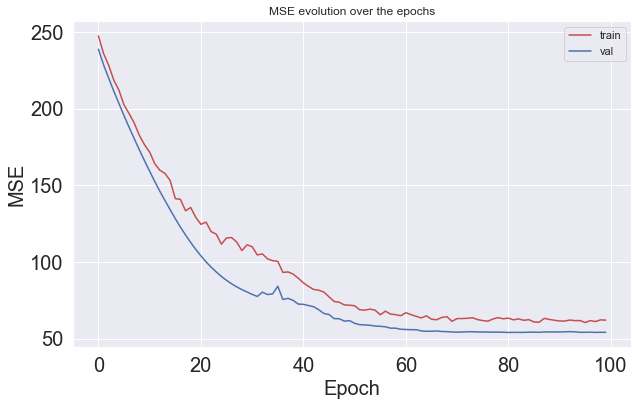

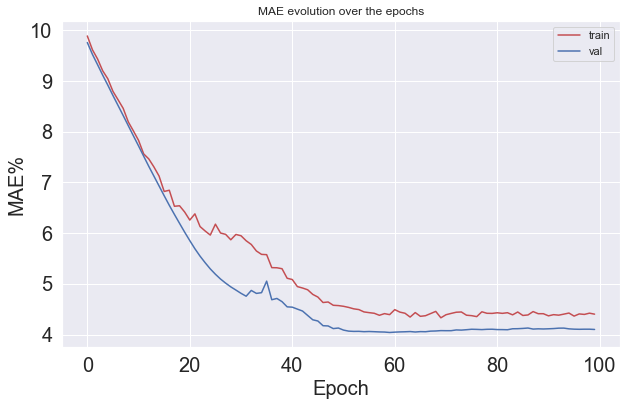

In [82]:
# Plot the loss function 
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(lr_model_history.history['loss']), 'r', label='train')
ax.plot(np.sqrt(lr_model_history.history['val_loss']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'MSE', fontsize=20)
ax.legend()
ax.set_title('MSE evolution over the epochs')
ax.tick_params(labelsize=20)

# Plot the MAE - metric
fig, ax = plt.subplots(1, 1, figsize=(10,6))
ax.plot(np.sqrt(lr_model_history.history['mean_absolute_percentage_error']), 'r', label='train')
ax.plot(np.sqrt(lr_model_history.history['val_mean_absolute_percentage_error']), 'b' ,label='val')
ax.set_xlabel(r'Epoch', fontsize=20)
ax.set_ylabel(r'MAE%', fontsize=20)
ax.set_title('MAE evolution over the epochs')
ax.legend()
ax.tick_params(labelsize=20)

As it is possible to see on the figures above, there are no big sign of overfitting. (The training data curve does not continue to decrease while the validation data curve stays stable)

In [83]:
nn_score=nn_manual_score(lr_model)

acc_mean=np.append(acc_mean,nn_score.mean())
acc_std=np.append(acc_std,nn_score.std())
x_labels=np.append(x_labels,'Simple NN')
print(nn_score.mean())

0.8668357487922705


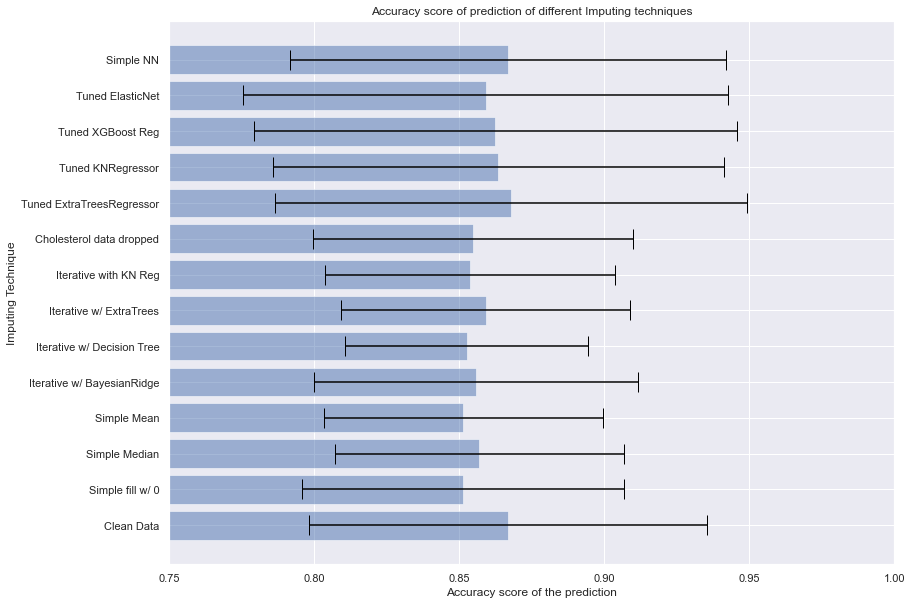

In [84]:
plot_imputers(x_labels,acc_mean,acc_std)

### II.1.c. Imputer Choice

The choice of imputer depends on the accuracy of the imputer. Due to the stochastic nature of the process, the imputer choice might differ from one run to another.


In [85]:
print('The best estimator is: '+str(x_labels[np.argmax(acc_mean)]))

The best estimator is: Tuned ExtraTreesRegressor


In [86]:
#get best estimator
best=np.argmax(acc_mean)
imp_df=original_df.copy()
X_full['HeartDisease']=y_full
X_full=X_fulltrain_imp.append(X_miss_imp)

base_strat=simple_strategy+iterative_strategy
custom_strat=[ext_bp.best_estimator_,knn_bp.best_estimator_,xgb_bp.best_estimator_,
              ela_bp.best_estimator_,lr_model]

if best==0:
#imputer - clean data
    imp_df=None
    X=X_clean.copy()
    y=y_clean.copy()
    X['HeartDisease']=y
    imp_df=original_df.loc[list(X_clean.index)].copy()
    imp_df.Cholesterol=X.Cholesterol
    

elif 0<best<4:
#imputer - SimpleImputer
    imputer = SimpleImputer(missing_values=np.nan, 
                                strategy=base_strrat[best-1], fill_value=0, add_indicator=True)
    new_chol=imputer.fit_transform(X_full)
    imp_df['Cholesterol']=new_chol[:,2]
    X=imp_df.iloc[:,:-1]
    y=imp_df.iloc[:,-1]
    
elif 4<= best <=7:
#imputer - IterativeImputer
    imputer = IterativeImputer(missing_values=np.nan, estimator=base_strat[best-1],
                               add_indicator=True)
    new_chol=imputer.fit_transform(X_full)
    imp_df['Cholesterol']=new_chol[:,2]
    X=imp_df.iloc[:,:-1]
    y=imp_df.iloc[:,-1]
elif 8<best<13:
#imputer- custom imputer
    X_full=X_fulltrain_imp.append(X_miss_imp)
    chol_pred=pd.Series(custom_strat[best-9].predict(scaler.fit_transform(X_miss_imp)),index=y_miss_imp.index)
    chol_full_man=y_fulltrain_imp.append(chol_pred)
    X_full['Cholesterol']=chol_full_man
    X_full.sort_index(ascending=True,inplace=True)
    imp_df['Cholesterol']=X_full['Cholesterol']
    
elif best==13:
#imputer - Neural Network
    X_full=X_fulltrain_imp.append(X_miss_imp)
    chol_pred=pd.Series(custom_strat[-1].predict(scaler.fit_transform(X_miss_imp)).reshape(y_miss_imp.index.shape),index=y_miss_imp.index)
    chol_full_man=y_fulltrain_imp.append(chol_pred)
    X_full['Cholesterol']=chol_full_man
    X_full.sort_index(ascending=True,inplace=True)
    imp_df['Cholesterol']=X_full['Cholesterol']


,Age,Sex,ChestPainType,RestingBP,Cholesterol,FastingBS,RestingECG,MaxHR,ExerciseAngina,Oldpeak,ST_Slope,HeartDisease
Age,1.000000,0.000000,0.083667,0.263084,0.052288,0.198170,0.078909,-0.382280,0.216017,0.259482,0.084675,0.282012
Sex,0.000000,0.993448,0.040344,0.000000,-0.107586,0.013750,0.000000,-0.189668,0.035533,0.121682,0.023655,0.091463
ChestPainType,0.083667,0.040344,1.000000,0.000000,0.000000,0.025747,0.010548,0.176004,0.194978,0.099890,0.085683,0.293235
RestingBP,0.263084,0.000000,0.000000,1.000000,0.088173,0.067823,0.099792,-0.109693,0.153064,0.147278,0.000000,0.117990
Cholesterol,0.052288,-0.107586,0.000000,0.088173,1.000000,0.000000,0.000000,-0.019212,0.081909,0.052070,0.463056,0.102180
FastingBS,0.198170,0.013750,0.025747,0.067823,0.000000,0.993914,0.016503,-0.131067,0.000000,0.088961,0.031054,0.070438
RestingECG,0.078909,0.000000,0.010548,0.099792,0.000000,0.016503,1.000000,0.000000,0.011475,0.082396,0.000000,0.012071
MaxHR,-0.382280,-0.189668,0.176004,-0.109693,-0.019212,-0.131067,0.000000,1.000000,-0.370023,-0.180418,0.202274,-0.401410
ExerciseAngina,0.216017,0.035533,0.194978,0.153064,0.081909,0.000000,0.011475,-0.370023,0.995478,0.409574,0.209528,0.243301
Oldpeak,0.259482,0.121682,0.099890,0.147278,0.052070,0.088961,0.082396,-0.180418,0.409574,1.000000,0.249456,0.429377


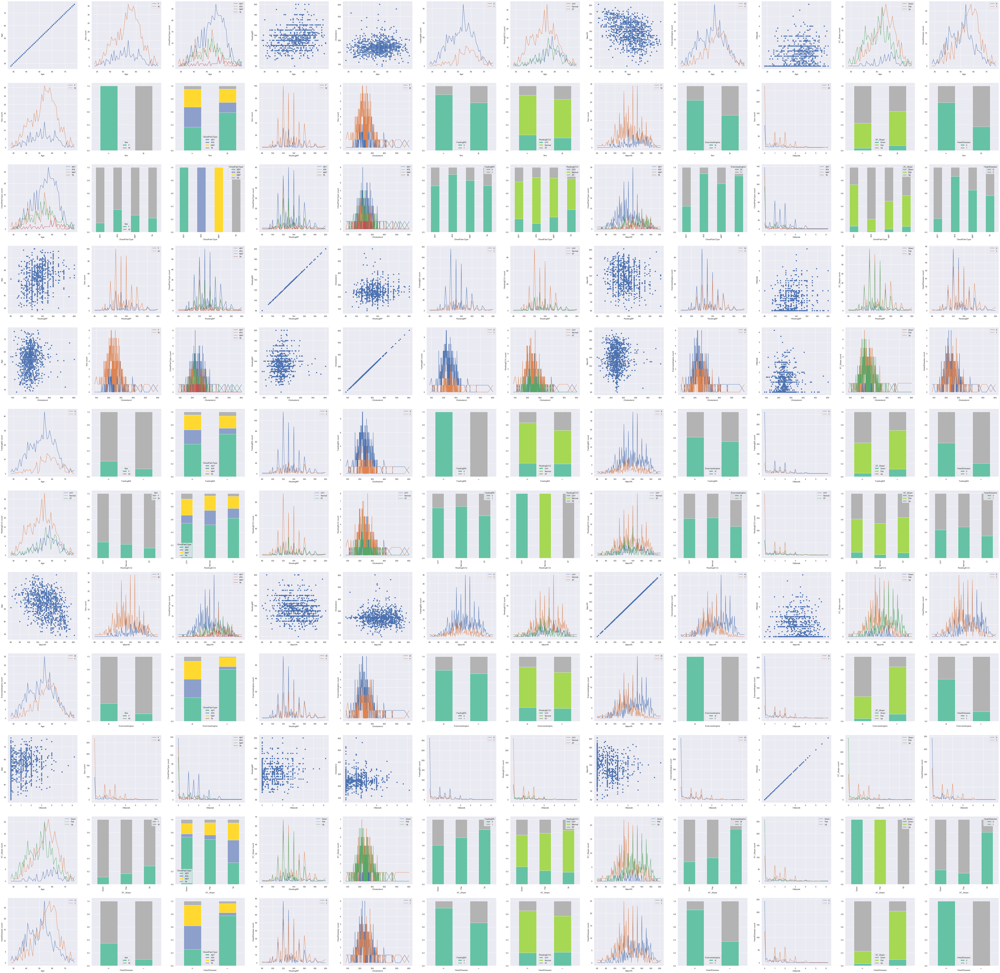

In [87]:
new_corr_mat=correlation_calculation(imp_df,data_type=data_type,plot_=True)
new_corr_mat

The negative correlation between Cholesterol and HeartDisease became slightly positive. 

The classifier used an untuned RandomForestRegressor to find the 'best imputer'. As a reminder, the accuracy was about (it varies because of the stochastic nature of the crossvalidation):

In [88]:
X=knn_df.loc[imp_df.index].copy()
y=X.HeartDisease
X.drop('HeartDisease',axis=1,inplace=True)
cross_val_score(RandomForestClassifier(),X,y,scoring='accuracy',error_score='raise',cv=20).mean()

0.8678019323671498

### II.2. Feature Transformation

#### II.2.a. Decomposition with Principal Component Analysis

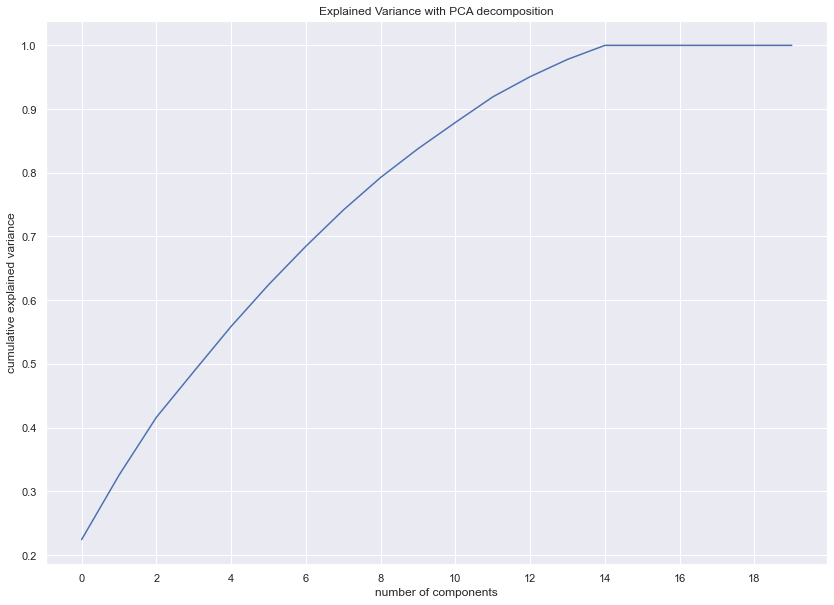

In [89]:
from sklearn.decomposition import PCA

X_scaled=scaler.fit_transform(X)

pca = PCA(n_components=20)

score=pca.fit_transform(X_scaled)
coeff=pca.components_ #eigen vectors.T
latent = pca.explained_variance_
explained = pca.explained_variance_ratio_

plt.plot(np.cumsum(explained))
plt.xticks(range(0,20,2))
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')
plt.title('Explained Variance with PCA decomposition')
plt.show()

<br>The dataset used to perform PCA contains 20 features (11 initially, but 20 once encoded).
To reach a 100% explained variance, it is needed to get the 15 first components with linear PCA. 
<br> With only 9 components, 80% of the variance is explained.

Linear PCA linearity assumption makes it hard to perform decomposition if there are no existing linear combination between each of the feature. To explore non-linearity, PCA with kernel trick is used

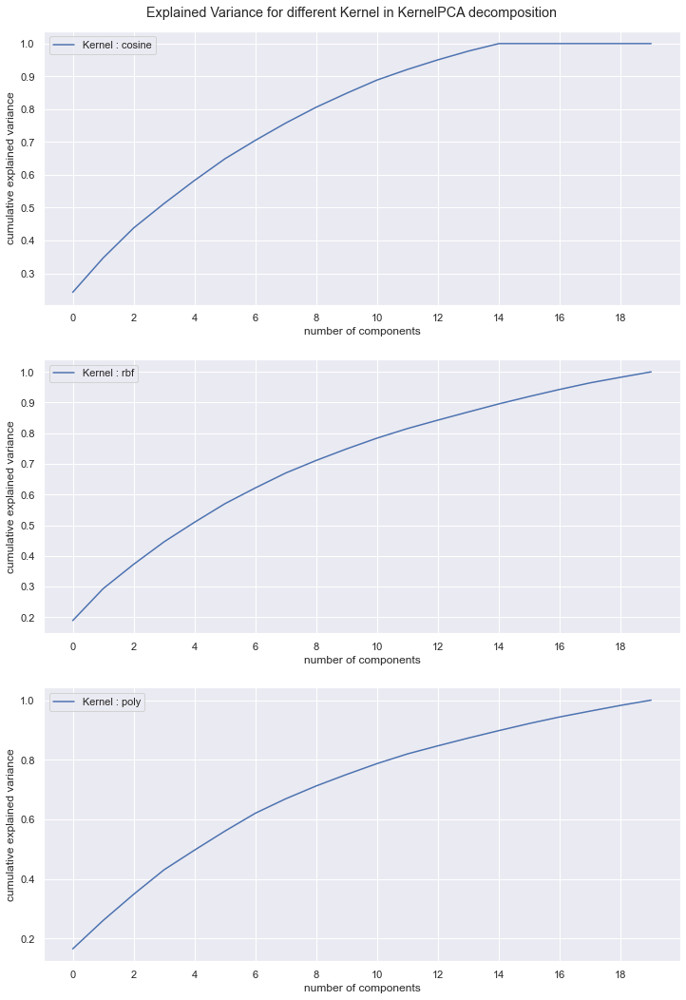

In [90]:
from sklearn.decomposition import KernelPCA

strat=['cosine','rbf','poly']

fig,ax =plt.subplots(3,1,figsize=(12,18))

for i in range(0,len(strat)):
    kpca = KernelPCA(kernel=strat[i],n_components=20)
    k_score=kpca.fit_transform(X_scaled) #eigen vectors.T
    explained_variance = np.var(k_score, axis=0)
    explained_variance_ratio = explained_variance / np.sum(explained_variance)
    ax[i].plot(np.cumsum(explained_variance_ratio),label='Kernel : '+strat[i])
    ax[i].set_xticks(range(0,20,2))
    ax[i].set_xlabel('number of components')
    ax[i].set_ylabel('cumulative explained variance')
    ax[i].legend()
fig.suptitle('Explained Variance for different Kernel in KernelPCA decomposition',y=0.9)
plt.show()

On the graph above it seems that only Cosine Kernel manages to explain 100% Kernel in less than 20 components
<br><br> Regarding 80% explained variance, cosine is very similar to linear PCA, reaching it in 9 components. However rbf and polynomial kernel reaches it in 12 components

It is possible to find the best KernelPCA kernel and hyperparameters by doing a RandomGridSearch.

<br><br>
Optimization for Kernel PCA:

In [91]:
#gain function is the cumsum explained variance to the 4th component
def score_pca(estimator,X):
    X_score=estimator.transform(X)
    explained_variance = np.var(X_score, axis=0)
    explained_variance_ratio = explained_variance / np.sum(explained_variance)
    score=np.cumsum(explained_variance_ratio)
    return score[3]

kpca=KernelPCA()

random_grid={'gamma':np.linspace(0,1,50),
            'degree':[2,3,4],
            'coef0':np.linspace(0,10000,1000),
            'kernel':['rbf','poly','cosine']}

cv=RandomizedSearchCV(kpca,param_distributions=random_grid,n_iter=5000,n_jobs=-1,scoring=score_pca)
cv.fit(X_scaled)
print('Best score for a non-linear Kernel PCA: '+str(cv.best_score_))
print('Best estimation of a linear PCA: '+str(np.cumsum(pca.explained_variance_ratio_)[3]))

C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py:372: FitFailedWarning: 
43 fits failed out of a total of 25000.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
14 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\model_selection\_validation.py", line 678, in _fit_and_score
    estimator.fit(X_train, **fit_params)
  File "C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\decomposition\_kernel_pca.py", line 432, in fit
    self._fit_transform(K)
  File "C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\decomposition\_kernel_pca.py", line 360, in _fit_transform
    self.eigenvalues_ = _check_psd_eigenvalues(
  File "

Best score for a non-linear Kernel PCA: 0.4409314217816404
Best estimation of a linear PCA: 0.4878953372423539


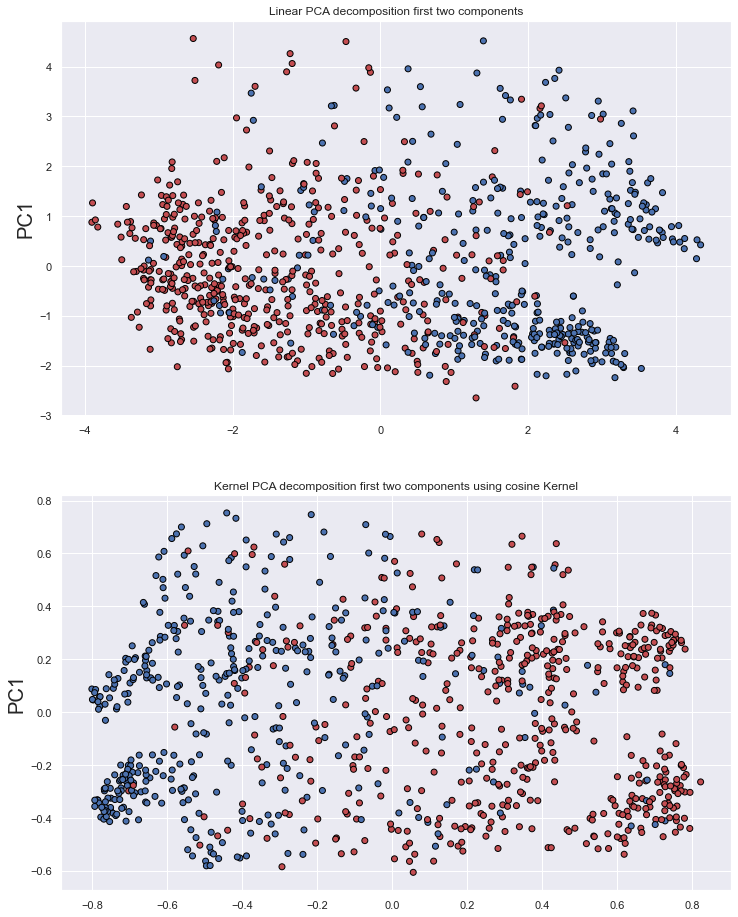

In [92]:
pca=PCA(n_components=10)
pc=pca.fit_transform(X_scaled)
pc1=pc[:,0]
pc2=pc[:,1]
pc3=pc[:,2]

kpca=KernelPCA(n_components=10,kernel='cosine')
kpc=kpca.fit_transform(X_scaled)
kpc1=kpc[:,0]
kpc2=kpc[:,1]
kpc3=kpc[:,2]

fig,ax=plt.subplots(2,1,figsize=(12,16))
ax.flat

colour = ['r' if y == 1 else 'b' for y in y]
ax[0].scatter(pc1,pc2,c=colour,edgecolors='#000000')
ax[0].set_ylabel("PC2",size=20)
ax[0].set_ylabel("PC1",size=20)
ax[0].set_title('Linear PCA decomposition first two components')


ax[1].scatter(kpc1,kpc2,c=colour,edgecolors='#000000')
ax[1].set_ylabel("PC2",size=20)
ax[1].set_ylabel("PC1",size=20)
ax[1].set_title('Kernel PCA decomposition first two components using cosine Kernel')
plt.show()

This is a representation of the PCA decomposition in 2D for Cosine Kernel PCA and Linear PCA. 
<br>
The explained variance with 4 components is 49.83% for the linear PCA, and 47.00% for the Kernel PCA with cosine function.

#### II.2.b. Decomposition using MCA and FAMD

Another option for dimensionality reduction would be to use Multiple Correspondence Analysis, which is PCA applied to categorical variables. 
<br><br>
Another technique called Factor Analysis of Mixed Data (FAMD) combines Principal Component Analysis (PCA) to deal with numerical variables and Multiple Correspondence Analysis (MCA) for categorical ones.
<br><br> To use MCA, it is needed to have a fully categorical data set. The strategy to convert the numerical data to categorical is:
<ul>
    <li>Age 40-/40:60/60+ = Low/Medium/High </li>
    <li>RestingBP 90-/90:140/140+ = Low/Normal/High </li>
    <li>Cholesterol 120-/120:220/220+ = Low/Medium/High </li>
    <li>Age -40/40:60/60+ = Low/Medium/High </li>
    <li>MaximumHR depends on a threshold, which is 220-Age. If MaximumHR is higher than 220-Age it is alarming.</li>
    <li>OldPeak 0/0+ = No/Yes </li>    
</ul>
<br>
The values are chosen arbitrarily and could be optimized to maximize the explained variance

In [93]:
X_cat=imp_df.iloc[:,:-1].copy()

age_cat=[]

for age in X_cat['Age']:
    if age<=40:
        age_cat.append('Low')
    elif 60<=age>40:
        age_cat.append('Medium')
    else:
        age_cat.append('High')
X_cat['Age']=age_cat

bp_cat=[]

for bp in X_cat['RestingBP']:
    if bp<90:
        bp_cat.append('Low')
    elif 90<=age>140:
        bp_cat.append('Normal')
    else:
        bp_cat.append('High')
X_cat['RestingBP']=bp_cat

chol_cat=[]

for chol in X_cat['Cholesterol']:
    if chol<120:
        chol_cat.append('Low')
    elif 120<=chol>220:
        chol_cat.append('Normal')
    else:
        chol_cat.append('High')
X_cat['Cholesterol']=chol_cat

diab_cat=[]

for diab in X_cat['FastingBS']:
    if diab==1:
        diab_cat.append('Yes')
    else:
        diab_cat.append('No')
X_cat['FastingBS']=diab_cat

hr_cat=[]
estimated_hr=220-imp_df['Age']-imp_df['MaxHR']

for hr in estimated_hr:
    if hr<0:
        hr_cat.append('Alarming')
    else:
        hr_cat.append('Normal')
X_cat['MaxHR']=hr_cat

op_cat=[]

for op in X_cat['Oldpeak'].astype(int):
    if op==0:
        op_cat.append('No')
    else:
        op_cat.append('Yes')

X_cat['Oldpeak']=op_cat


In [94]:
import prince
mca=prince.MCA(n_components=4)
mca.fit(X_cat)
print('MCA - Explained variance with 4 components: '+str(np.cumsum(mca.explained_inertia_)[-1]))

MCA - Explained variance with 4 components: 0.37111507429630414


Transforming the dataset into a categorical dataset does not yield a better explained variance. MCA with 4 components reaches 40.83% explained variance. It can be explained by the loss of information due to transformation from num-cat and the 'arbitrary' values to split the different categories.
<br>

In [95]:
X_ori=imp_df.iloc[:,:-1].copy()
X_ori.iloc[:,[0,3,4,7,9]]=scaler.fit_transform(X_ori.iloc[:,[0,3,4,7,9]])

In [96]:
import prince
famd = prince.FAMD(n_components=4,n_iter=100,copy=True,check_input=True,engine='auto')
famd.fit(X_ori)

FAMD(n_components=4, n_iter=100)

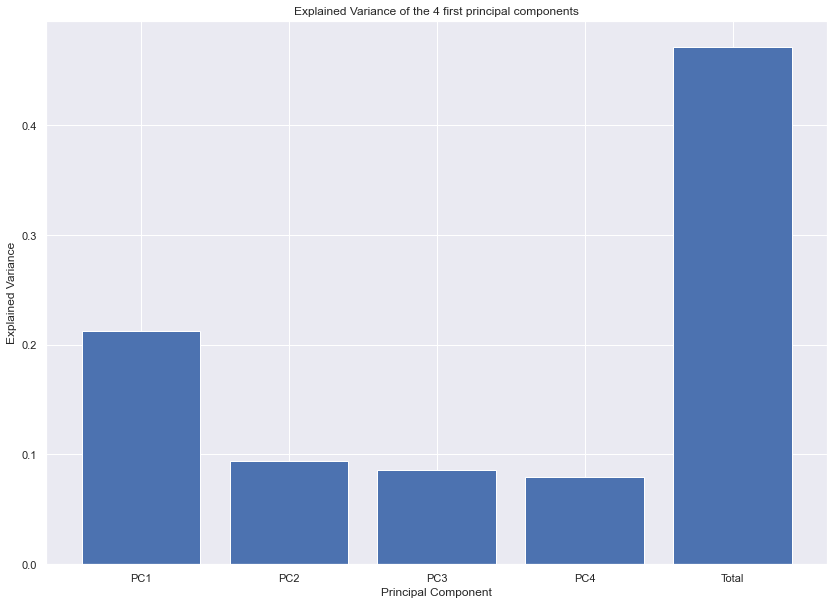

In [97]:
plt.bar(['PC1','PC2','PC3','PC4','Total'],np.append(famd.explained_inertia_,np.cumsum(famd.explained_inertia_)[-1]))
plt.ylabel('Explained Variance')
plt.xlabel('Principal Component')
plt.title('Explained Variance of the 4 first principal components')
plt.show()

In [98]:
print('FAMD - Explained variance with 4 components: '+str(np.cumsum(famd.explained_inertia_)[-1]))

FAMD - Explained variance with 4 components: 0.4715994313324581


In [99]:
famd.column_correlations(X_ori)

,0,1,2,3
Age,0.744713,0.473113,-0.434988,0.087509
ChestPainType_ASY,0.381785,0.029912,0.010625,-0.038128
ChestPainType_ATA,-0.347889,-0.046267,0.066804,-0.058270
ChestPainType_NAP,-0.126176,-0.017714,-0.055254,0.042519
ChestPainType_TA,-0.008494,0.048270,-0.039085,0.110755
Cholesterol,0.168305,0.607847,0.753955,-0.611174
ExerciseAngina_N,-0.475324,-0.096879,-0.025298,-0.090609
ExerciseAngina_Y,0.475324,0.096879,0.025298,0.090609
FastingBS,0.282824,0.178592,-0.314182,-0.238845
MaxHR,-0.692026,0.032978,0.301067,0.287299


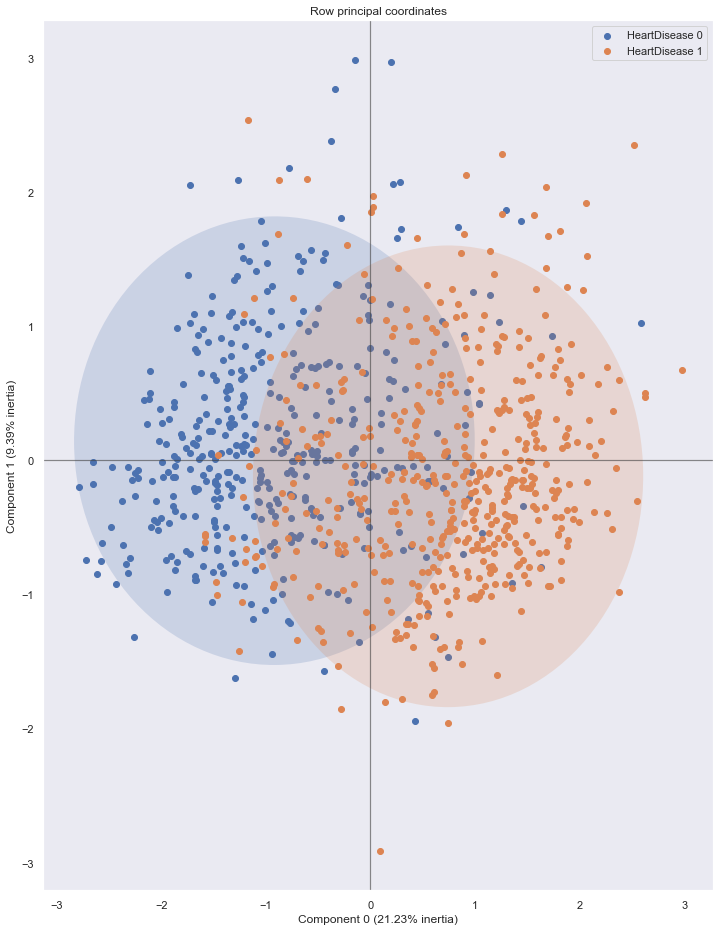

In [100]:
ax = famd.plot_row_coordinates(X_ori,ax=None,figsize=(12, 16),x_component=0,y_component=1,
                               color_labels=['HeartDisease {}'.format(t) for t in y],
                               ellipse_outline=False,ellipse_fill=True,show_points=True)

As we can see, decomposition using PCA and MCA combined results in a similar explained variance than the linear PCA.

## III. Models Exploration

Now that the imputing method has been selected, data can be used to build models. A non-exhaustive list of models has been elaborated:
<ul>
    <li>Logistic Regressor</li>
    <li>Support Vector Machine</li>
    <li>K-Nearest-Neighbors</li>
    <li>Naive Bayes</li>
</ul>
<br>
Ensemble Methods:
<ul>
    <li>Random Forrest </li>
    <li>ADABoosting</li>
    <li>Voting Classifier</li>
</ul>

In [108]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

X_pca=PCA(n_components=20).fit_transform(X_scaled)
X_kpca=KernelPCA(kernel='cosine',n_components=20).fit_transform(X_scaled)
X_famd=prince.FAMD(n_components=20).fit_transform(X_ori)

X_train_ori,y_train,X_test_ori,y_test,X_val_ori,y_val=get_train_test_val(X,y,0.3)
X_test=scaler.fit_transform(X_test_ori)
X_train=scaler.fit_transform(X_train_ori)
X_val=scaler.fit_transform(X_val_ori)
X_train_pca,y_train_pca,X_test_pca,y_test_pca,X_val_pca,y_val_pca=get_train_test_val(X_pca,y,0.3)
X_train_kpca,y_train_kpca,X_test_kpca,y_test_kpca,X_val_kpca,y_val_kpca=get_train_test_val(X_kpca,y,0.3)
X_train_famd,y_train_famd,X_test_famd,y_test_famd,X_val_famd,y_val_famd=get_train_test_val(X_famd,y,0.3)
X_train_famd=np.array(X_train_famd)
y_train_famd=np.array(y_train_famd)
X_test_famd=np.asarray(X_test_famd)
y_test_famd=np.asarray(y_test_famd)
X_val_famd=np.asarray(X_val_famd)
y_val_famd=np.asarray(y_val_famd)


In [109]:
from sklearn.preprocessing import MinMaxScaler,RobustScaler,PowerTransformer,normalize
# automatic svm hyperparameter tuning using skopt for the ionosphere dataset
from pandas import read_csv
from sklearn.model_selection import cross_val_score
from sklearn.svm import SVC
from sklearn.model_selection import RepeatedStratifiedKFold
from skopt import BayesSearchCV


#get Accuracy and ROC_AUC for the validatation and the test set, aswell as the confusion matrix 
def clf_score(estimator,X_val,y_val,X_test,y_test,cv,summary=True):
    cv_=cross_val_score(estimator,X_val,y_val,scoring='roc_auc',cv=cv)
    if summary==True:
        print('Roc_AUC validation set: '+str(cv_.mean()))
        print('ROC_AUC test set: '+str(roc_auc_score(estimator.predict(X_test),y_test)))
        print('Accuracy validation set:'+str(accuracy_score(estimator.predict(X_val),y_val)))
        print('Accuracy test set:'+str(accuracy_score(estimator.predict(X_test),y_test)))
        print('Confusion Matrix:')
        print(confusion_matrix(y_test,estimator.predict(X_test)))
    else:
        pass
    return cv_,roc_auc_score(estimator.predict(X_test),y_test),accuracy_score(estimator.predict(X_val),y_val),accuracy_score(estimator.predict(X_test),y_test)

#display ROC and Accuracy for different feature scaling methods
def transformation_comp(name,estimator,X_train=X_train_ori,X_test=X_test_ori,X_val=X_val_ori,
                        y_train=y_train,y_test=y_test,y_val=y_val):
    
    stdscaler=StandardScaler()
    minmaxscaler=MinMaxScaler()
    robustscaler=RobustScaler()
    power=PowerTransformer()
    
    scalers=[stdscaler,minmaxscaler,robustscaler,power]
    scalers_name=['Standard Scaling','MinMax Scaling','Robust Scaling','Power Transformation']
       
    val_acc=[]
    test_acc=[]
    val_roc=[]
    test_roc=[] 
    
    for scaler in scalers:
        print(scaler)
        X_t=scaler.fit_transform(X_train)
        X_tt=scaler.fit_transform(X_test)
        X_v=scaler.fit_transform(X_val)
        estimator.fit(X_t,y_train)
        scores=clf_score(estimator,X_v,y_val,X_tt,y_test,cv=20)
        val_roc.append(scores[0].mean())
        test_roc.append(scores[1])
        val_acc.append(scores[2])
        test_acc.append(scores[3])
    
    
    length = len(test_acc)
    width = 0.2 
    x = np.arange(length)
    fig,ax=plt.subplots(1)
    ax.bar(x, val_roc, width, color='b', label='Validation ROC')
    ax.bar(x + width, test_roc, width, color='r', label='Test ROC')
    ax.bar(x + (2 * width), val_acc, width, color='y', label='Validation Accuracy')
    ax.bar(x + (3 * width), test_acc, width, color='g', label='Test Accuracy')
    ax.set_xticks(x + width + width/2)
    ax.set_xticklabels(scalers_name)
    ax.set_ylabel('Score')
    ax.set_ylim(0.7,1)
    ax.set_xlabel('Feature Transformation Strategy')
    ax.set_title('Comparison of prediction accuracy using '+name+' for Heart Disease Prediction')
    ax.legend()
    plt.grid(True, 'major', 'y', ls='--', lw=.5, c='k', alpha=.3)
    

#Compare an estimator using PCA/KernelPCA using cosine/FAMD and original data
def plot_perf_comp(name,best_estimator_,ori_val_roc,ori_test_roc,ori_val_acc,ori_test_acc,
                   X_train_pca=X_train_pca,y_train_pca=y_train_pca, X_test_pca=X_test_pca,
                   y_test_pca=y_test_pca,X_val_pca=X_val_pca, y_val_pca=y_val_pca,
                   X_train_famd=X_train_famd,y_train_famd=y_train_famd, X_test_famd=X_test_famd,
                   y_test_famd=y_test_famd,X_val_famd=X_val_famd,y_val_famd=y_val_famd,
                   X_train_kpca=X_train_kpca, y_train_kpca=y_train_kpca,X_val_kpca=X_val_kpca,
                   y_val_kpca=y_val_kpca, X_test_kpca=X_test_kpca,y_test_kpca=y_test_kpca):
    
    n_components=np.linspace(1,20,20).astype(int)
    famd_test_score=[]
    famd_val_score=[]
    pca_test_score=[]
    pca_val_score=[]
    kpca_test_score=[]
    kpca_val_score=[]
    pca_test_acc=[]
    pca_val_acc=[]
    famd_test_acc=[]
    famd_val_acc=[]
    kpca_test_acc=[]
    kpca_val_acc=[]
    for n in n_components:
        clf1=best_estimator_
        clf2=best_estimator_
        clf3=best_estimator_
        clf1.fit(X_train_pca[:,:n],y_train_pca)
        score1=clf_score(clf1,X_val_pca[:,:n],y_val_pca,X_test_pca[:,:n],y_test_pca,cv=5,summary=False)
        clf2.fit(X_train_famd[:,:n],y_train_famd)
        score2=clf_score(clf2,X_val_famd[:,:n],y_val_famd,X_test_famd[:,:n],y_test_famd,cv=5,summary=False)
        clf3.fit(X_train_kpca[:,:n],y_train_kpca)
        score3=clf_score(clf3,X_val_kpca[:,:n],y_val_kpca,X_test_kpca[:,:n],y_test_kpca,cv=5,summary=False)
        pca_test_score.append(score1[1])
        pca_val_score.append(score1[0].mean())
        pca_val_acc.append(score1[2])
        pca_test_acc.append(score1[3])
        famd_test_score.append(score2[1])
        famd_val_score.append(score2[0].mean())
        famd_val_acc.append(score2[2])
        famd_test_acc.append(score2[3])
        kpca_test_score.append(score3[1])
        kpca_val_score.append(score3[0].mean())
        kpca_val_acc.append(score3[2])
        kpca_test_acc.append(score3[3])
        
    fig,ax=plt.subplots(2,1,figsize=(12,18))
    ax.flat
    
    ax[0].plot(n_components,pca_test_score,label='PCA_test (AUC='+str(round(max(pca_test_score),3))+')')
    ax[0].plot(n_components,pca_val_score,label='PCA_val (AUC='+str(round(max(pca_val_score),3))+')')
    ax[0].plot(n_components,famd_val_score,label='FAMD_val (AUC='+str(round(max(famd_val_score),3))+')')
    ax[0].plot(n_components,famd_test_score,label='FAMD_test (AUC='+str(round(max(famd_test_score),3))+')')
    ax[0].plot(n_components,np.full(len(n_components),ori_val_roc),label='Original_val (AUC='+str(round(ori_val_roc,3))+')',
               linestyle='dashed')
    ax[0].plot(n_components,np.full(len(n_components),ori_test_roc),label='Original_test (AUC='+str(round(ori_test_roc,3))+')',
               linestyle='dashed')
    ax[0].plot(n_components,kpca_test_score,label='KernelPCA_test (AUC='+str(round(max(kpca_test_score),3))+')')
    ax[0].plot(n_components,kpca_val_score,label='KernelPCA_val (AUC='+str(round(max(kpca_val_score),3))+')')
    ax[0].legend(loc='lower right')
    ax[0].set_xlabel('Number of components')
    ax[0].set_ylabel('ROC_AUC Score')
    ax[0].set_title('Comparison of ROC_AUC score using '+name+' for Heart Disease Prediction')
    
    ax[1].plot(n_components,pca_test_acc,label='PCA_test (acc='+str(round(max(pca_test_acc),3))+')')
    ax[1].plot(n_components,pca_val_acc,label='PCA_val (acc='+str(round(max(pca_val_acc),3))+')')
    ax[1].plot(n_components,famd_val_acc,label='FAMD_val (acc='+str(round(max(famd_val_acc),3))+')')
    ax[1].plot(n_components,famd_test_acc,label='FAMD_test (acc='+str(round(max(famd_test_acc),3))+')')
    ax[1].plot(n_components,np.full(len(n_components),ori_val_acc),label='Original_val (acc='+str(round(ori_val_acc,3))+')',
               linestyle='dashed')
    ax[1].plot(n_components,np.full(len(n_components),ori_test_acc),label='Original_test (acc='+str(round(ori_test_acc,3))+')',
               linestyle='dashed')
    ax[1].plot(n_components,kpca_test_acc,label='KernelPCA_test (acc='+str(round(max(kpca_test_acc),3))+')')
    ax[1].plot(n_components,kpca_val_acc,label='KernelPCA_val (acc='+str(round(max(kpca_val_acc),3))+')')
    ax[1].legend(loc='lower right')
    ax[1].set_xlabel('Number of components')
    ax[1].set_ylabel('Accuracy')
    ax[1].set_title('Comparison of prediction accuracy using '+name+' for Heart Disease Prediction')
    return famd_test_acc,pca_test_acc,kpca_test_acc

For each classifier a comparison of the scaling impact is performed, as well as an accuracy comparison using different data (PCA,FAMD,KernelPCA and original). Two metrics are used to compare models’ performance – Accuracy and ROC-AUC score

### III.1. Logistic Regression Classification

In [110]:
from sklearn.linear_model import LogisticRegression


log_clf=LogisticRegression(max_iter=1000,n_jobs=-1)
param_grid_lr={
            'solver':['newton-cg', 'lbfgs'],
            'penalty':['l2'],
            'C':np.linspace(1e-3,1e-1,100)
           }
log_bp=GridSearchCV(log_clf,param_grid=param_grid_lr,cv=20)
log_bp.fit(X_train,y_train)
print(log_bp.best_params_)
log_cv,log_score,log_acc_valscore,log_acc_testscore=clf_score(log_bp.best_estimator_,X_val,y_val,X_test,y_test,cv=20)

{'C': 0.018000000000000002, 'penalty': 'l2', 'solver': 'newton-cg'}
Roc_AUC validation set: 0.9141666666666666
ROC_AUC test set: 0.8644334654432922
Accuracy validation set:0.8497409326424871
Accuracy test set:0.8623188405797102
Confusion Matrix:
[[ 99  24]
 [ 14 139]]


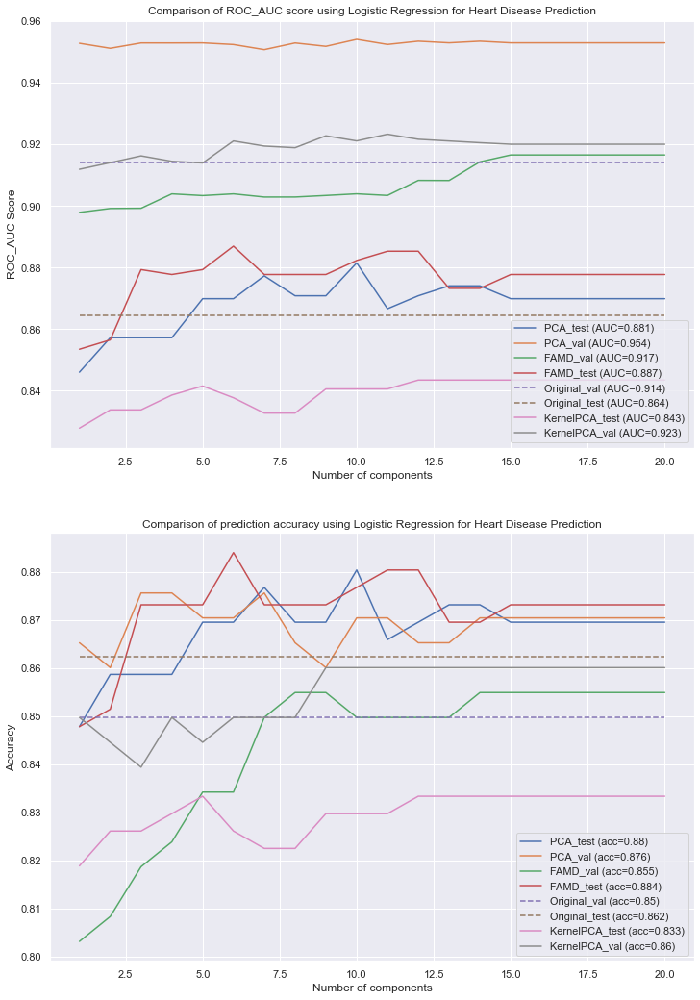

In [111]:
log_famd_acc,log_pca_acc,log_kpca_acc=plot_perf_comp('Logistic Regression',log_bp.best_estimator_,log_cv.mean(),log_score,log_acc_valscore,log_acc_testscore)

StandardScaler()
Roc_AUC validation set: 0.9141666666666666
ROC_AUC test set: 0.8644334654432922
Accuracy validation set:0.8497409326424871
Accuracy test set:0.8623188405797102
Confusion Matrix:
[[ 99  24]
 [ 14 139]]
MinMaxScaler()
Roc_AUC validation set: 0.9010833333333332
ROC_AUC test set: 0.8810765815760268
Accuracy validation set:0.844559585492228
Accuracy test set:0.8731884057971014
Confusion Matrix:
[[ 97  26]
 [  9 144]]
RobustScaler()
Roc_AUC validation set: 0.9195
ROC_AUC test set: 0.8378151260504201
Accuracy validation set:0.8341968911917098
Accuracy test set:0.8369565217391305
Confusion Matrix:
[[109  14]
 [ 31 122]]
PowerTransformer()


C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Roc_AUC validation set: 0.9097500000000001
ROC_AUC test set: 0.8559006211180126
Accuracy validation set:0.8497409326424871
Accuracy test set:0.855072463768116
Confusion Matrix:
[[ 99  24]
 [ 16 137]]


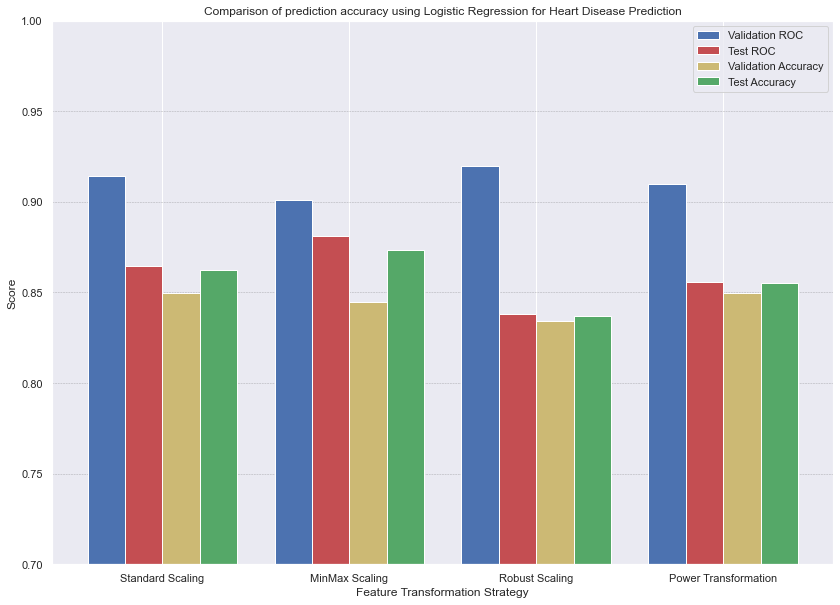

In [112]:
transformation_comp('Logistic Regression',log_bp.best_estimator_)

### III.2 Support Vector Machine

In [113]:
from sklearn.svm import SVC
svm_clf=SVC(max_iter=-1,probability=True)

param_grid_svm={
            'gamma':[0.001,0.01,0.05,0.1,0.5],
            'kernel':['linear','rbf','sigmoid'],
            'C':[0.01,0.05,0.1,0.5]
           }
svm_bp=GridSearchCV(svm_clf,param_grid=param_grid_svm,cv=20)
svm_bp.fit(X_train,y_train)
print(svm_bp.best_params_)
svm_cv,svm_score,svm_acc_v,svm_acc_t=clf_score(svm_bp.best_estimator_,X_val,y_val,X_test,y_test,cv=20)

{'C': 0.5, 'gamma': 0.001, 'kernel': 'linear'}
Roc_AUC validation set: 0.9078333333333333
ROC_AUC test set: 0.8583458485303583
Accuracy validation set:0.8186528497409327
Accuracy test set:0.8586956521739131
Confusion Matrix:
[[101  22]
 [ 17 136]]


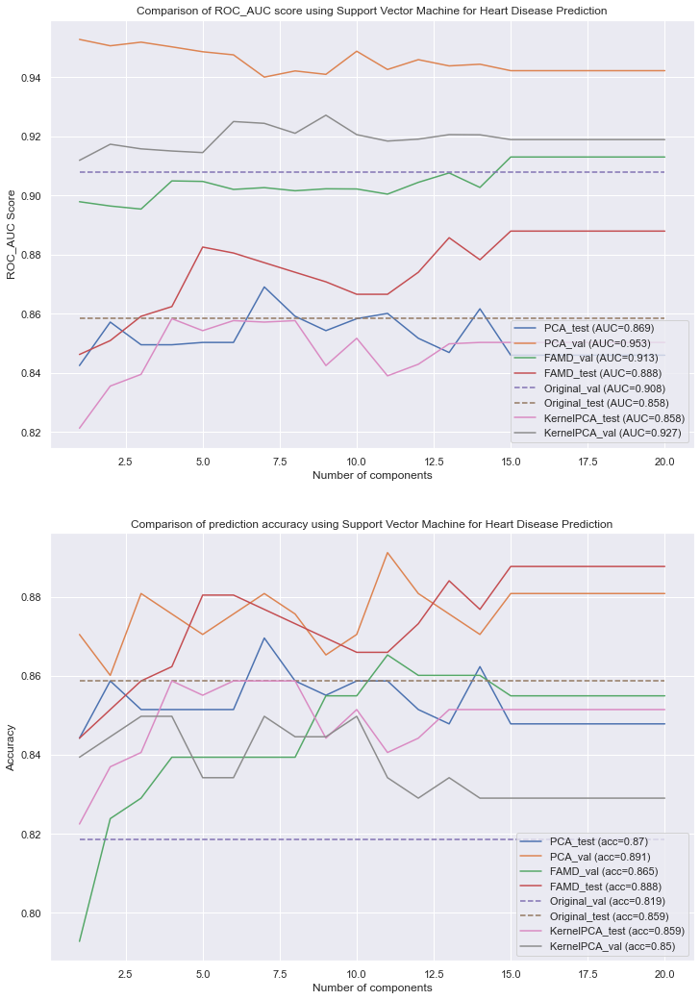

In [115]:
svm_famd_acc,svm_pca_acc,svm_kpca_acc=plot_perf_comp('Support Vector Machine',svm_bp.best_estimator_,svm_cv.mean(),svm_score,svm_acc_v,svm_acc_t)

StandardScaler()
Roc_AUC validation set: 0.9078333333333333
ROC_AUC test set: 0.8583458485303583
Accuracy validation set:0.8186528497409327
Accuracy test set:0.8586956521739131
Confusion Matrix:
[[101  22]
 [ 17 136]]
MinMaxScaler()
Roc_AUC validation set: 0.9091666666666667
ROC_AUC test set: 0.8628237259816207
Accuracy validation set:0.844559585492228
Accuracy test set:0.855072463768116
Confusion Matrix:
[[ 94  29]
 [ 11 142]]
RobustScaler()
Roc_AUC validation set: 0.9087499999999998
ROC_AUC test set: 0.8030830166461489
Accuracy validation set:0.8238341968911918
Accuracy test set:0.7898550724637681
Confusion Matrix:
[[111  12]
 [ 46 107]]
PowerTransformer()


C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Roc_AUC validation set: 0.8934166666666666
ROC_AUC test set: 0.8550233833252701
Accuracy validation set:0.8290155440414507
Accuracy test set:0.855072463768116
Confusion Matrix:
[[100  23]
 [ 17 136]]


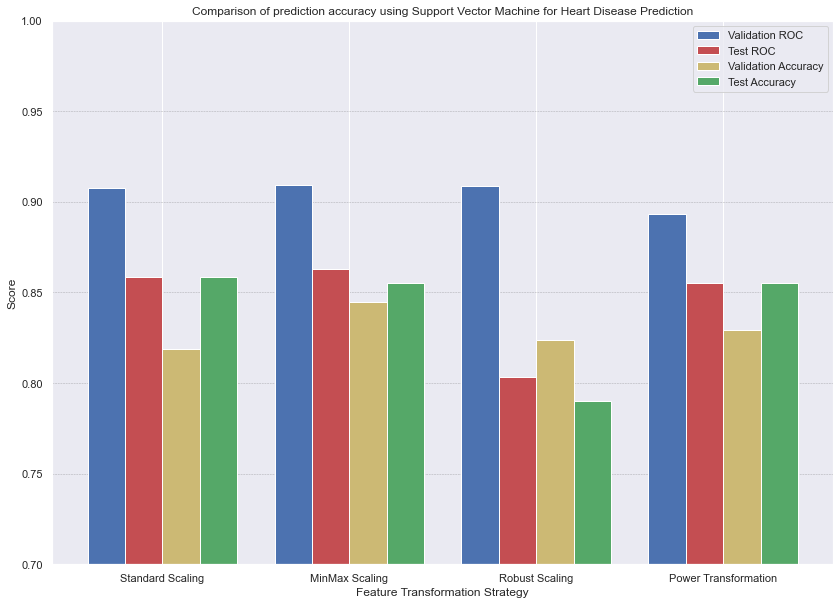

In [116]:
transformation_comp('Support Vector Machine',svm_bp.best_estimator_)

### III.3 K-Nearest Neighbors

In [117]:
from sklearn.neighbors import KNeighborsClassifier

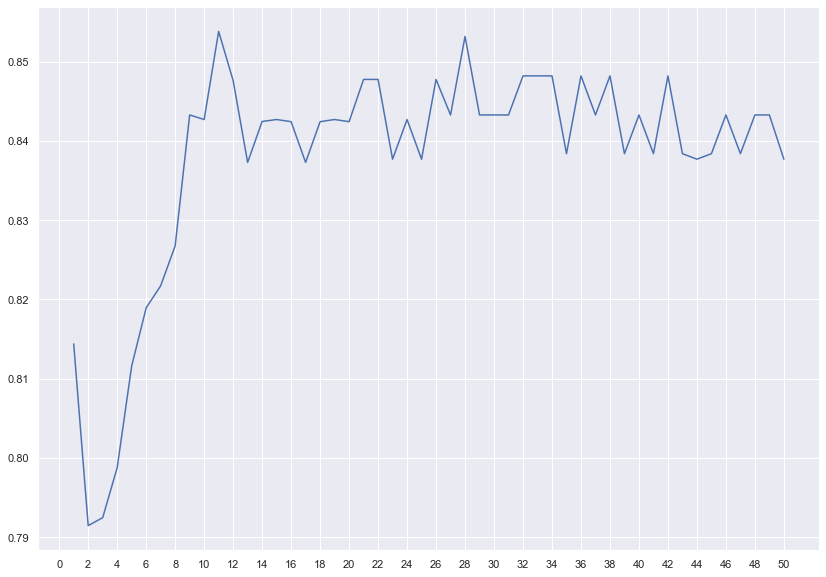

In [118]:
number_n=np.linspace(1,50,50).astype(int)
knn_score=[]
for n in number_n:
    knn_clf=KNeighborsClassifier(n_neighbors=n)
    knn_clf.fit(X_train,y_train)
    knn_score.append(roc_auc_score(knn_clf.predict(X_val),y_val))
        
plt.plot(number_n,knn_score)
plt.xticks(np.linspace(0,50,26))
plt.show()

In [119]:
knn_clf=KNeighborsClassifier(n_neighbors=30)
knn_clf.fit(X_train,y_train)
knn_cv,knn_score,knn_acc_v,knn_acc_t=clf_score(knn_clf,X_val,y_val,X_test,y_test,cv=20)

Roc_AUC validation set: 0.9017916666666667
ROC_AUC test set: 0.8537456678219141
Accuracy validation set:0.844559585492228
Accuracy test set:0.855072463768116
Confusion Matrix:
[[102  21]
 [ 19 134]]


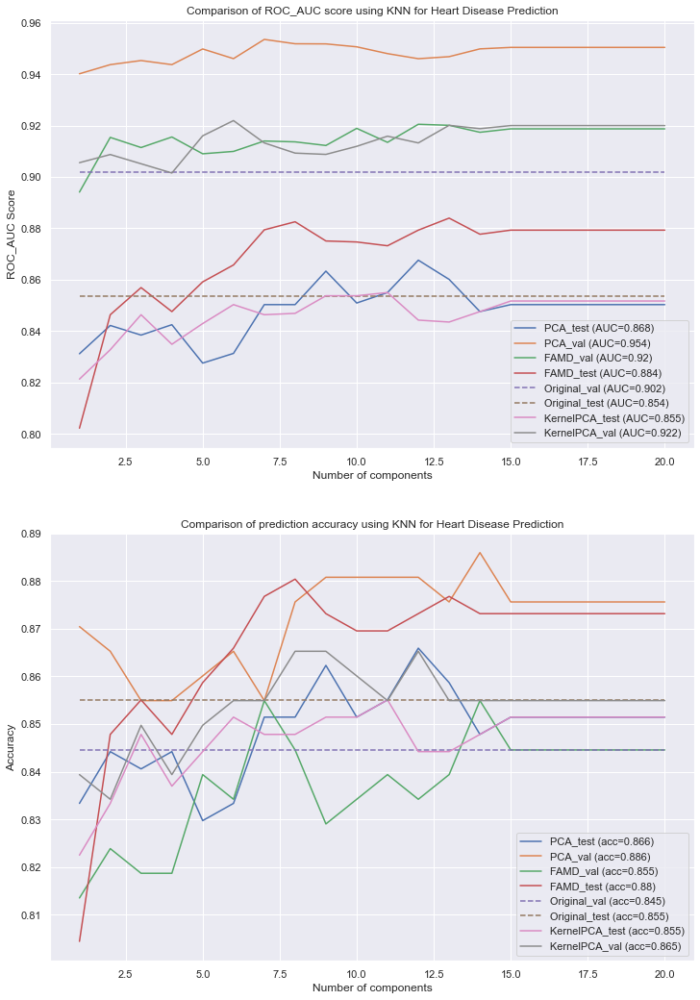

In [120]:
knn_famd_acc,knn_pca_acc,knn_kpca_acc=plot_perf_comp('KNN',knn_clf,knn_cv.mean(),knn_score,knn_acc_v,knn_acc_t)

StandardScaler()
Roc_AUC validation set: 0.9017916666666667
ROC_AUC test set: 0.8537456678219141
Accuracy validation set:0.844559585492228
Accuracy test set:0.855072463768116
Confusion Matrix:
[[102  21]
 [ 19 134]]
MinMaxScaler()
Roc_AUC validation set: 0.8994166666666666
ROC_AUC test set: 0.8701533406352683
Accuracy validation set:0.844559585492228
Accuracy test set:0.8659420289855072
Confusion Matrix:
[[ 98  25]
 [ 12 141]]
RobustScaler()
Roc_AUC validation set: 0.9290833333333334
ROC_AUC test set: 0.8274231678486997
Accuracy validation set:0.8393782383419689
Accuracy test set:0.8260869565217391
Confusion Matrix:
[[108  15]
 [ 33 120]]
PowerTransformer()


C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Roc_AUC validation set: 0.9043333333333333
ROC_AUC test set: 0.8583458485303583
Accuracy validation set:0.8549222797927462
Accuracy test set:0.8586956521739131
Confusion Matrix:
[[101  22]
 [ 17 136]]


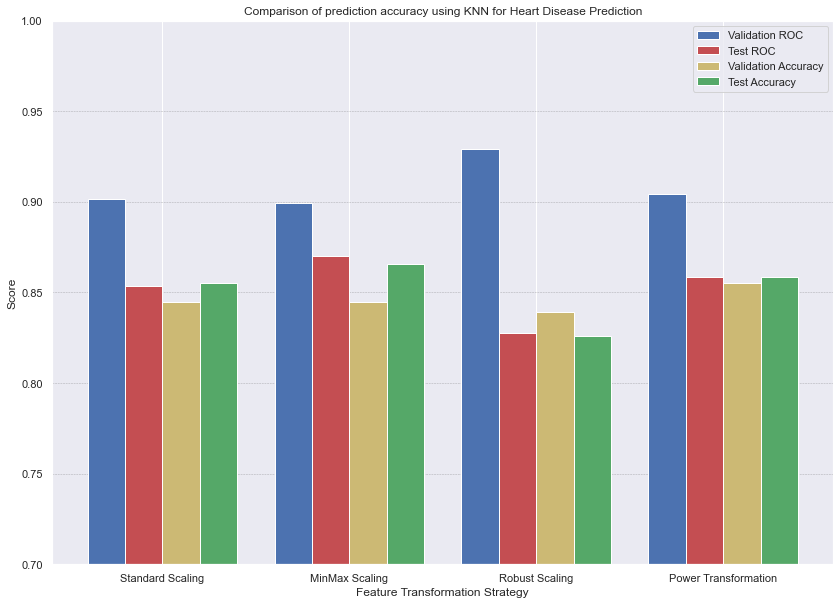

In [121]:
transformation_comp('KNN',knn_clf)

### III.4. Naive Bayes

In [122]:
from sklearn.naive_bayes import GaussianNB
nb_clf=GaussianNB()

param_grid_nb={'var_smoothing': np.logspace(-1,1, num=100)}
nb_bp=GridSearchCV(nb_clf,param_grid=param_grid_nb,cv=20)
nb_bp.fit(X_train,y_train)
print(nb_bp.best_params_)
nb_cv,nb_score,nb_acc_v,nb_acc_t=clf_score(nb_bp.best_estimator_,X_val,y_val,X_test,y_test,cv=20)

{'var_smoothing': 2.4770763559917115}
Roc_AUC validation set: 0.9194166666666665
ROC_AUC test set: 0.8571960826059186
Accuracy validation set:0.8238341968911918
Accuracy test set:0.8586956521739131
Confusion Matrix:
[[103  20]
 [ 19 134]]


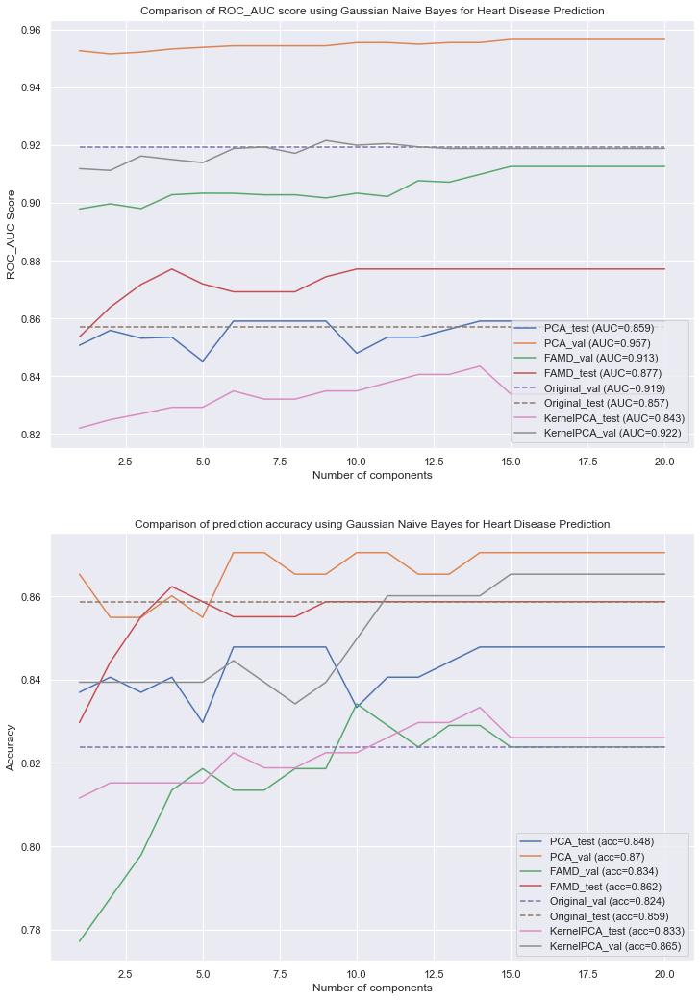

In [123]:
nb_famd_acc,nb_pca_acc,nb_kpca_acc=plot_perf_comp('Gaussian Naive Bayes',nb_bp.best_estimator_,nb_cv.mean(),nb_score,nb_acc_v,nb_acc_t)

StandardScaler()
Roc_AUC validation set: 0.9194166666666665
ROC_AUC test set: 0.8571960826059186
Accuracy validation set:0.8238341968911918
Accuracy test set:0.8586956521739131
Confusion Matrix:
[[103  20]
 [ 19 134]]
MinMaxScaler()
Roc_AUC validation set: 0.90525
ROC_AUC test set: 0.877710843373494
Accuracy validation set:0.8341968911917098
Accuracy test set:0.8731884057971014
Confusion Matrix:
[[ 99  24]
 [ 11 142]]
RobustScaler()
Roc_AUC validation set: 0.9315
ROC_AUC test set: 0.8369565217391305
Accuracy validation set:0.8238341968911918
Accuracy test set:0.8369565217391305
Confusion Matrix:
[[108  15]
 [ 30 123]]
PowerTransformer()
Roc_AUC validation set: 0.91225


C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


ROC_AUC test set: 0.8571960826059186
Accuracy validation set:0.8186528497409327
Accuracy test set:0.8586956521739131
Confusion Matrix:
[[103  20]
 [ 19 134]]


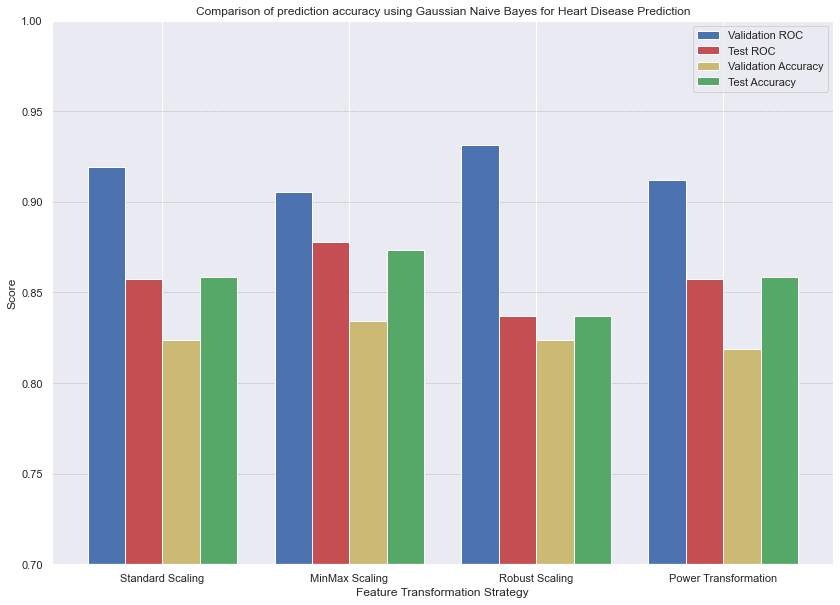

In [124]:
transformation_comp('Gaussian Naive Bayes',nb_bp.best_estimator_)

### III.5 Random Forest Classification

In [125]:
random_rf_clf=RandomForestClassifier(n_jobs=-1)

random_grid = {'n_estimators': np.linspace(10,1000,331,dtype=int),
               'max_features': ['auto', 'sqrt'],
               'max_depth': np.linspace(10,255,50,dtype=int),
               'min_samples_split': [2,5,10,50],
               'min_samples_leaf': [2,4,10,20],
               'bootstrap': [True,False]
              }        

In [126]:
random_rf=RandomizedSearchCV(estimator = random_rf_clf, param_distributions = random_grid, n_iter = 1000, cv = 5, verbose=2)
random_rf.fit(X_val,y_val)

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits
[CV] END bootstrap=False, max_depth=245, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=277; total time=   0.4s
[CV] END bootstrap=False, max_depth=245, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=277; total time=   0.3s
[CV] END bootstrap=False, max_depth=245, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=277; total time=   0.3s
[CV] END bootstrap=False, max_depth=245, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=277; total time=   0.3s
[CV] END bootstrap=False, max_depth=245, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=277; total time=   0.3s
[CV] END bootstrap=False, max_depth=130, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=901; total time=   0.9s
[CV] END bootstrap=False, max_depth=130, max_features=sqrt, min_samples_leaf=10, min_samples_split=1

[CV] END bootstrap=True, max_depth=45, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=424; total time=   0.5s
[CV] END bootstrap=True, max_depth=135, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=781; total time=   0.6s
[CV] END bootstrap=True, max_depth=135, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=781; total time=   0.7s
[CV] END bootstrap=True, max_depth=135, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=781; total time=   0.7s
[CV] END bootstrap=True, max_depth=135, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=781; total time=   0.7s
[CV] END bootstrap=True, max_depth=135, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=781; total time=   0.8s
[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=361; total time=   0.6s
[CV] END bootstrap=False, max_depth=35

[CV] END bootstrap=True, max_depth=135, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=112; total time=   0.1s
[CV] END bootstrap=True, max_depth=85, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=544; total time=   0.5s
[CV] END bootstrap=True, max_depth=85, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=544; total time=   0.5s
[CV] END bootstrap=True, max_depth=85, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=544; total time=   0.6s
[CV] END bootstrap=True, max_depth=85, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=544; total time=   0.5s
[CV] END bootstrap=True, max_depth=85, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=544; total time=   0.5s
[CV] END bootstrap=True, max_depth=25, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=34; total time=   0.0s
[CV] END bootstrap=True, max_depth=2

[CV] END bootstrap=False, max_depth=165, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=391; total time=   0.4s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.6s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.6s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.6s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.6s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.6s
[CV] END bootstrap=True, max_depth=120, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=793; total time=   0.8s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=556; total time=   0.6s
[CV] END bootstrap=True, max_depth=220, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=220, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=220, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=220, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=220, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=481; total time=   0.6s
[CV] END bootstrap=False, max_depth=165, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=775; total time=   0.7s
[CV] END bootstrap=False, max

[CV] END bootstrap=False, max_depth=215, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=286; total time=   0.3s
[CV] END bootstrap=False, max_depth=210, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=718; total time=   0.8s
[CV] END bootstrap=False, max_depth=210, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=718; total time=   0.8s
[CV] END bootstrap=False, max_depth=210, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=718; total time=   0.8s
[CV] END bootstrap=False, max_depth=210, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=718; total time=   0.7s
[CV] END bootstrap=False, max_depth=210, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=718; total time=   0.9s
[CV] END bootstrap=False, max_depth=155, max_features=auto, min_samples_leaf=20, min_samples_split=5, n_estimators=262; total time=   0.2s
[CV] END bootstrap=Fa

[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=20, min_samples_split=5, n_estimators=517; total time=   0.4s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=220; total time=   0.2s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=220; total time=   0.2s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=220; total time=   0.2s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=220; total time=   0.3s
[CV] END bootstrap=False, max_depth=10, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=220; total time=   0.3s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=577; total time=   0.6s
[CV] END bootstrap=False, ma

[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=145; total time=   0.2s
[CV] END bootstrap=True, max_depth=120, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=166; total time=   0.2s
[CV] END bootstrap=True, max_depth=120, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=166; total time=   0.2s
[CV] END bootstrap=True, max_depth=120, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=166; total time=   0.3s
[CV] END bootstrap=True, max_depth=120, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=166; total time=   0.2s
[CV] END bootstrap=True, max_depth=120, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=166; total time=   0.2s
[CV] END bootstrap=False, max_depth=250, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=280; total time=   0.3s
[CV] END bootstrap=False, max_depth=250

[CV] END bootstrap=False, max_depth=170, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=493; total time=   0.7s
[CV] END bootstrap=True, max_depth=125, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=298; total time=   0.3s
[CV] END bootstrap=True, max_depth=125, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=298; total time=   0.3s
[CV] END bootstrap=True, max_depth=125, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=298; total time=   0.3s
[CV] END bootstrap=True, max_depth=125, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=298; total time=   0.4s
[CV] END bootstrap=True, max_depth=125, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=298; total time=   0.3s
[CV] END bootstrap=False, max_depth=95, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=328; total time=   0.5s
[CV] END bootstrap=False, max_dep

[CV] END bootstrap=True, max_depth=195, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=658; total time=   0.7s
[CV] END bootstrap=True, max_depth=235, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=994; total time=   1.0s
[CV] END bootstrap=True, max_depth=235, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=994; total time=   1.1s
[CV] END bootstrap=True, max_depth=235, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=994; total time=   0.9s
[CV] END bootstrap=True, max_depth=235, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=994; total time=   1.0s
[CV] END bootstrap=True, max_depth=235, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=994; total time=   0.9s
[CV] END bootstrap=False, max_depth=140, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=673; total time=   0.7s
[CV] END bootstrap=False, max_depth=14

[CV] END bootstrap=False, max_depth=20, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=553; total time=   0.4s
[CV] END bootstrap=False, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=874; total time=   0.9s
[CV] END bootstrap=False, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=874; total time=   0.9s
[CV] END bootstrap=False, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=874; total time=   1.0s
[CV] END bootstrap=False, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=874; total time=   1.0s
[CV] END bootstrap=False, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=874; total time=   1.0s
[CV] END bootstrap=True, max_depth=185, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=76; total time=   0.1s
[CV] END bootstrap=True,

[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=439; total time=   0.5s
[CV] END bootstrap=True, max_depth=70, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=544; total time=   0.5s
[CV] END bootstrap=True, max_depth=70, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=544; total time=   0.5s
[CV] END bootstrap=True, max_depth=70, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=544; total time=   0.5s
[CV] END bootstrap=True, max_depth=70, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=544; total time=   0.5s
[CV] END bootstrap=True, max_depth=70, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=544; total time=   0.6s
[CV] END bootstrap=False, max_depth=100, max_features=sqrt, min_samples_leaf=20, min_samples_split=5, n_estimators=124; total time=   0.1s
[CV] END bootstrap=False, max_depth=10

[CV] END bootstrap=False, max_depth=145, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=109; total time=   0.1s
[CV] END bootstrap=False, max_depth=95, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=799; total time=   0.8s
[CV] END bootstrap=False, max_depth=95, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=799; total time=   0.8s
[CV] END bootstrap=False, max_depth=95, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=799; total time=   0.8s
[CV] END bootstrap=False, max_depth=95, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=799; total time=   0.7s
[CV] END bootstrap=False, max_depth=95, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=799; total time=   0.7s
[CV] END bootstrap=False, max_depth=225, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=637; total time=   0.7s
[CV] END bootstrap=False, max_depth=

[CV] END bootstrap=True, max_depth=105, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=424; total time=   0.5s
[CV] END bootstrap=True, max_depth=215, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=433; total time=   0.5s
[CV] END bootstrap=True, max_depth=215, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=433; total time=   0.5s
[CV] END bootstrap=True, max_depth=215, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=433; total time=   0.5s
[CV] END bootstrap=True, max_depth=215, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=433; total time=   0.5s
[CV] END bootstrap=True, max_depth=215, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=433; total time=   0.5s
[CV] END bootstrap=True, max_depth=230, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=103; total time=   0.2s
[CV] END bootstrap=True, max_depth=230, m

[CV] END bootstrap=True, max_depth=185, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=811; total time=   0.9s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.7s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.7s
[CV] END bootstrap=False, max_depth=105, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=148; total time=   0.2s
[CV] END bootstrap=False, max_depth=10

[CV] END bootstrap=False, max_depth=130, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=832; total time=   0.8s
[CV] END bootstrap=False, max_depth=215, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=556; total time=   0.5s
[CV] END bootstrap=False, max_depth=215, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=556; total time=   0.5s
[CV] END bootstrap=False, max_depth=215, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=556; total time=   0.5s
[CV] END bootstrap=False, max_depth=215, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=556; total time=   0.6s
[CV] END bootstrap=False, max_depth=215, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=556; total time=   0.5s
[CV] END bootstrap=False, max_depth=35, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=775; total time=   0.5s
[CV] END bootstrap=Fals

[CV] END bootstrap=False, max_depth=210, max_features=sqrt, min_samples_leaf=2, min_samples_split=2, n_estimators=253; total time=   0.2s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=868; total time=   0.9s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=868; total time=   0.9s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=868; total time=   1.1s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=868; total time=   1.0s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=868; total time=   0.9s
[CV] END bootstrap=True, max_depth=105, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=820; total time=   0.7s
[CV] END bootstrap=True, max_

[CV] END bootstrap=False, max_depth=195, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=541; total time=   0.5s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=970; total time=   1.1s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=970; total time=   1.0s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=970; total time=   1.0s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=970; total time=   0.9s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=970; total time=   1.0s
[CV] END bootstrap=True, max_depth=55, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=805; total time=   0.8s
[CV] END bootstrap=True, max_depth=

[CV] END bootstrap=False, max_depth=115, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=25; total time=   0.0s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=286; total time=   0.3s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=286; total time=   0.3s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=286; total time=   0.3s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=286; total time=   0.3s
[CV] END bootstrap=True, max_depth=50, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=286; total time=   0.3s
[CV] END bootstrap=False, max_depth=40, max_features=sqrt, min_samples_leaf=2, min_samples_split=50, n_estimators=742; total time=   0.8s
[CV] END bootstrap=False, max_dept

[CV] END bootstrap=False, max_depth=225, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=940; total time=   1.0s
[CV] END bootstrap=False, max_depth=200, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.0s
[CV] END bootstrap=False, max_depth=200, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.0s
[CV] END bootstrap=False, max_depth=200, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.0s
[CV] END bootstrap=False, max_depth=200, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.0s
[CV] END bootstrap=False, max_depth=200, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=25; total time=   0.0s
[CV] END bootstrap=True, max_depth=240, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=256; total time=   0.3s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=True, max_depth=105, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=688; total time=   0.8s
[CV] END bootstrap=True, max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=13; total time=   0.0s
[CV] END bootstrap=True, max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=13; total time=   0.0s
[CV] END bootstrap=True, max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=13; total time=   0.0s
[CV] END bootstrap=True, max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=13; total time=   0.0s
[CV] END bootstrap=True, max_depth=35, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=13; total time=   0.0s
[CV] END bootstrap=False, max_depth=130, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=97; total time=   0.1s
[CV] END bootstrap=False, max_depth=130, max

[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=388; total time=   0.4s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=139; total time=   0.2s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=139; total time=   0.2s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=139; total time=   0.2s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=139; total time=   0.1s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=139; total time=   0.2s
[CV] END bootstrap=False, max_depth=225, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=430; total time=   0.5s
[CV] END bootstrap=False, max

[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=898; total time=   1.0s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=898; total time=   1.1s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=898; total time=   1.1s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=898; total time=   1.0s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=898; total time=   1.0s
[CV] END bootstrap=False, max_depth=50, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=559; total time=   0.6s
[CV] END bootstrap=False, max_depth=50, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=559; total time=   0.5s
[CV] END bootstrap=False, m

[CV] END bootstrap=True, max_depth=45, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=526; total time=   0.5s
[CV] END bootstrap=True, max_depth=45, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=526; total time=   0.5s
[CV] END bootstrap=True, max_depth=45, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=526; total time=   0.4s
[CV] END bootstrap=True, max_depth=45, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=526; total time=   0.5s
[CV] END bootstrap=True, max_depth=45, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=526; total time=   0.4s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=745; total time=   0.7s
[CV] END bootstrap=True, max_depth=10, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=745; total time=   0.7s
[CV] END bootstrap=True, max_depth=10,

[CV] END bootstrap=True, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=154; total time=   0.2s
[CV] END bootstrap=True, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=154; total time=   0.2s
[CV] END bootstrap=True, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=154; total time=   0.2s
[CV] END bootstrap=True, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=154; total time=   0.3s
[CV] END bootstrap=True, max_depth=190, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=154; total time=   0.2s
[CV] END bootstrap=False, max_depth=140, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=946; total time=   1.0s
[CV] END bootstrap=False, max_depth=140, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=946; total time=   0.9s
[CV] END bootstrap=False, max_de

[CV] END bootstrap=False, max_depth=240, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=850; total time=   0.9s
[CV] END bootstrap=False, max_depth=240, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=850; total time=   1.0s
[CV] END bootstrap=False, max_depth=240, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=850; total time=   0.9s
[CV] END bootstrap=False, max_depth=240, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=850; total time=   0.8s
[CV] END bootstrap=False, max_depth=240, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=850; total time=   0.8s
[CV] END bootstrap=False, max_depth=35, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=190; total time=   0.2s
[CV] END bootstrap=False, max_depth=35, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=190; total time=   0.2s
[CV] END bootstrap=False, 

[CV] END bootstrap=False, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=592; total time=   0.7s
[CV] END bootstrap=False, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=592; total time=   0.7s
[CV] END bootstrap=False, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=592; total time=   0.6s
[CV] END bootstrap=False, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=592; total time=   0.6s
[CV] END bootstrap=False, max_depth=70, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=592; total time=   0.6s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=889; total time=   1.1s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=889; total time=   0.9s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=True, max_depth=65, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=325; total time=   0.5s
[CV] END bootstrap=True, max_depth=65, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=325; total time=   0.4s
[CV] END bootstrap=True, max_depth=65, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=325; total time=   0.5s
[CV] END bootstrap=True, max_depth=65, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=325; total time=   0.5s
[CV] END bootstrap=True, max_depth=65, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=325; total time=   0.5s
[CV] END bootstrap=False, max_depth=170, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=571; total time=   0.5s
[CV] END bootstrap=False, max_depth=170, max_features=sqrt, min_samples_leaf=4, min_samples_split=10, n_estimators=571; total time=   0.6s
[CV] END bootstrap=False, max_de

[CV] END bootstrap=True, max_depth=55, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=745; total time=   0.8s
[CV] END bootstrap=True, max_depth=55, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=745; total time=   0.7s
[CV] END bootstrap=True, max_depth=55, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=745; total time=   0.8s
[CV] END bootstrap=True, max_depth=55, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=745; total time=   0.7s
[CV] END bootstrap=True, max_depth=55, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=745; total time=   0.8s
[CV] END bootstrap=False, max_depth=55, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=556; total time=   0.5s
[CV] END bootstrap=False, max_depth=55, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=556; total time=   0.6s
[CV] END bootstrap=False, max_depth=55, m

[CV] END bootstrap=True, max_depth=155, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=916; total time=   1.2s
[CV] END bootstrap=True, max_depth=155, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=916; total time=   1.0s
[CV] END bootstrap=True, max_depth=155, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=916; total time=   0.8s
[CV] END bootstrap=True, max_depth=155, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=916; total time=   1.0s
[CV] END bootstrap=True, max_depth=155, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=916; total time=   0.8s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=829; total time=   0.7s
[CV] END bootstrap=False, max_depth=10, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=829; total time=   0.9s
[CV] END bootstrap=False, max_depth=

[CV] END bootstrap=False, max_depth=105, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=361; total time=   0.5s
[CV] END bootstrap=False, max_depth=105, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=361; total time=   0.6s
[CV] END bootstrap=False, max_depth=105, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=361; total time=   0.4s
[CV] END bootstrap=False, max_depth=105, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=361; total time=   0.6s
[CV] END bootstrap=False, max_depth=105, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=361; total time=   0.5s
[CV] END bootstrap=False, max_depth=170, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, max_depth=170, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=100; total time=   0.1s
[CV] END bootstrap=False, m

[CV] END bootstrap=False, max_depth=75, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=325; total time=   0.5s
[CV] END bootstrap=False, max_depth=75, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=325; total time=   0.6s
[CV] END bootstrap=False, max_depth=75, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=325; total time=   0.6s
[CV] END bootstrap=False, max_depth=75, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=325; total time=   0.6s
[CV] END bootstrap=False, max_depth=75, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=325; total time=   0.5s
[CV] END bootstrap=True, max_depth=105, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=961; total time=   1.1s
[CV] END bootstrap=True, max_depth=105, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=961; total time=   1.2s
[CV] END bootstrap=True, max_depth=105,

[CV] END bootstrap=False, max_depth=150, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=22; total time=   0.0s
[CV] END bootstrap=False, max_depth=150, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=22; total time=   0.0s
[CV] END bootstrap=False, max_depth=150, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=22; total time=   0.0s
[CV] END bootstrap=False, max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=538; total time=   0.7s
[CV] END bootstrap=False, max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=538; total time=   0.8s
[CV] END bootstrap=False, max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=538; total time=   0.6s
[CV] END bootstrap=False, max_depth=20, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=538; total time=   0.7s
[CV] END bootstrap=False, max_dept

[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=820; total time=   1.0s
[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=820; total time=   1.0s
[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=820; total time=   1.0s
[CV] END bootstrap=False, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=811; total time=   0.8s
[CV] END bootstrap=False, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=811; total time=   1.0s
[CV] END bootstrap=False, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=811; total time=   1.0s
[CV] END bootstrap=False, max_depth=15, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=811; total time=   0.9s
[CV] END bootstrap=False, max_depth

[CV] END bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=16; total time=   0.0s
[CV] END bootstrap=True, max_depth=20, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=16; total time=   0.0s
[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=61; total time=   0.1s
[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=61; total time=   0.0s
[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=61; total time=   0.1s
[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=61; total time=   0.0s
[CV] END bootstrap=False, max_depth=35, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=61; total time=   0.1s
[CV] END bootstrap=False, max_depth=105,

[CV] END bootstrap=True, max_depth=250, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=997; total time=   1.2s
[CV] END bootstrap=True, max_depth=250, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=997; total time=   1.2s
[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=436; total time=   0.6s
[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=436; total time=   0.6s
[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=436; total time=   0.6s
[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=436; total time=   0.6s
[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=436; total time=   0.6s
[CV] END bootstrap=False, m

[CV] END bootstrap=True, max_depth=95, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=73; total time=   0.1s
[CV] END bootstrap=True, max_depth=95, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=73; total time=   0.1s
[CV] END bootstrap=False, max_depth=150, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=181; total time=   0.2s
[CV] END bootstrap=False, max_depth=150, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=181; total time=   0.3s
[CV] END bootstrap=False, max_depth=150, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=181; total time=   0.2s
[CV] END bootstrap=False, max_depth=150, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=181; total time=   0.2s
[CV] END bootstrap=False, max_depth=150, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=181; total time=   0.2s
[CV] END bootstrap=False, 

[CV] END bootstrap=True, max_depth=200, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=613; total time=   0.9s
[CV] END bootstrap=True, max_depth=200, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=613; total time=   0.9s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=643; total time=   1.0s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=643; total time=   1.0s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=643; total time=   0.9s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=643; total time=   1.0s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=643; total time=   1.0s
[CV] END bootstrap=False, m

[CV] END bootstrap=False, max_depth=85, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=667; total time=   0.9s
[CV] END bootstrap=False, max_depth=85, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=667; total time=   0.9s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=25; total time=   0.0s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=25; total time=   0.0s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=25; total time=   0.0s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=25; total time=   0.0s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=25; total time=   0.0s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=False, max_depth=125, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=622; total time=   0.9s
[CV] END bootstrap=False, max_depth=125, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=622; total time=   0.9s
[CV] END bootstrap=False, max_depth=255, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=349; total time=   0.6s
[CV] END bootstrap=False, max_depth=255, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=349; total time=   0.5s
[CV] END bootstrap=False, max_depth=255, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=349; total time=   0.6s
[CV] END bootstrap=False, max_depth=255, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=349; total time=   0.7s
[CV] END bootstrap=False, max_depth=255, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=349; total time=   0.5s
[CV] END bootstrap=True, 

[CV] END bootstrap=True, max_depth=240, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=106; total time=   0.2s
[CV] END bootstrap=True, max_depth=240, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=106; total time=   0.2s
[CV] END bootstrap=True, max_depth=225, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=127; total time=   0.2s
[CV] END bootstrap=True, max_depth=225, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=127; total time=   0.2s
[CV] END bootstrap=True, max_depth=225, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=127; total time=   0.2s
[CV] END bootstrap=True, max_depth=225, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=127; total time=   0.2s
[CV] END bootstrap=True, max_depth=225, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=127; total time=   0.2s
[CV] END bootstrap=False, max_dept

[CV] END bootstrap=False, max_depth=135, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=754; total time=   0.7s
[CV] END bootstrap=False, max_depth=135, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=754; total time=   0.7s
[CV] END bootstrap=False, max_depth=170, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=859; total time=   1.2s
[CV] END bootstrap=False, max_depth=170, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=859; total time=   1.0s
[CV] END bootstrap=False, max_depth=170, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=859; total time=   1.2s
[CV] END bootstrap=False, max_depth=170, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=859; total time=   1.1s
[CV] END bootstrap=False, max_depth=170, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=859; total time=   1.0s
[CV] END bootstrap=True, max_

[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=883; total time=   1.3s
[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=883; total time=   1.1s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=418; total time=   0.6s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=418; total time=   0.5s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=418; total time=   0.6s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=418; total time=   0.5s
[CV] END bootstrap=True, max_depth=30, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=418; total time=   0.5s
[CV] END bootstrap=True, max_depth=215, ma

[CV] END bootstrap=True, max_depth=240, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=457; total time=   0.7s
[CV] END bootstrap=True, max_depth=240, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=457; total time=   0.7s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=340; total time=   0.6s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=340; total time=   0.6s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=340; total time=   0.6s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=340; total time=   0.6s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=340; total time=   0.5s
[CV] END bootstrap=True, ma

[CV] END bootstrap=False, max_depth=185, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=958; total time=   1.2s
[CV] END bootstrap=False, max_depth=185, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=958; total time=   1.1s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=931; total time=   1.0s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=931; total time=   1.1s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=931; total time=   1.2s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=931; total time=   1.1s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=931; total time=   1.1s
[CV] END bootstrap=True, max_depth=85, max

[CV] END bootstrap=False, max_depth=235, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=715; total time=   1.0s
[CV] END bootstrap=False, max_depth=235, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=715; total time=   1.0s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=328; total time=   0.5s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=328; total time=   0.5s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=328; total time=   0.6s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=328; total time=   0.5s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=328; total time=   0.5s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=736; total time=   1.0s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=736; total time=   0.9s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=301; total time=   0.4s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=301; total time=   0.5s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=301; total time=   0.4s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=301; total time=   0.4s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=301; total time=   0.4s
[CV] END bootstrap=False, max

[CV] END bootstrap=False, max_depth=130, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=379; total time=   0.3s
[CV] END bootstrap=False, max_depth=130, max_features=sqrt, min_samples_leaf=10, min_samples_split=2, n_estimators=379; total time=   0.4s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=658; total time=   0.8s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=658; total time=   0.8s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=658; total time=   0.8s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=658; total time=   0.8s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=658; total time=   0.9s
[CV] END bootstrap=False, max_depth=5

[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=667; total time=   0.9s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=667; total time=   0.9s
[CV] END bootstrap=True, max_depth=245, max_features=sqrt, min_samples_leaf=2, min_samples_split=50, n_estimators=691; total time=   0.9s
[CV] END bootstrap=True, max_depth=245, max_features=sqrt, min_samples_leaf=2, min_samples_split=50, n_estimators=691; total time=   0.9s
[CV] END bootstrap=True, max_depth=245, max_features=sqrt, min_samples_leaf=2, min_samples_split=50, n_estimators=691; total time=   0.9s
[CV] END bootstrap=True, max_depth=245, max_features=sqrt, min_samples_leaf=2, min_samples_split=50, n_estimators=691; total time=   0.9s
[CV] END bootstrap=True, max_depth=245, max_features=sqrt, min_samples_leaf=2, min_samples_split=50, n_estimators=691; total time=   0.9s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=484; total time=   0.8s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=484; total time=   0.8s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=232; total time=   0.4s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=232; total time=   0.4s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=232; total time=   0.4s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=232; total time=   0.3s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=232; total time=   0.3s
[CV] END bootstrap=True, max_

[CV] END bootstrap=True, max_depth=185, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=241; total time=   0.4s
[CV] END bootstrap=True, max_depth=185, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=241; total time=   0.3s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=535; total time=   0.7s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=535; total time=   0.7s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=535; total time=   0.6s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=535; total time=   0.6s
[CV] END bootstrap=False, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=535; total time=   0.6s
[CV] END bootstrap=True, max_

[CV] END bootstrap=True, max_depth=220, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=31; total time=   0.0s
[CV] END bootstrap=True, max_depth=220, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=31; total time=   0.0s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=481; total time=   0.7s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=481; total time=   0.7s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=481; total time=   0.7s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=481; total time=   0.7s
[CV] END bootstrap=False, max_depth=240, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=481; total time=   0.8s
[CV] END bootstrap=True, max_de

[CV] END bootstrap=True, max_depth=230, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=841; total time=   1.0s
[CV] END bootstrap=True, max_depth=230, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=841; total time=   1.0s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=166; total time=   0.3s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=166; total time=   0.3s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=166; total time=   0.3s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=166; total time=   0.3s
[CV] END bootstrap=False, max_depth=230, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=166; total time=   0.4s
[CV] END bootstrap=False, max

[CV] END bootstrap=False, max_depth=180, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=412; total time=   0.5s
[CV] END bootstrap=False, max_depth=180, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=412; total time=   0.5s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=568; total time=   0.7s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=568; total time=   0.7s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=568; total time=   0.6s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=568; total time=   0.6s
[CV] END bootstrap=True, max_depth=180, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=568; total time=   0.7s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=True, max_depth=95, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=559; total time=   0.7s
[CV] END bootstrap=True, max_depth=95, max_features=sqrt, min_samples_leaf=4, min_samples_split=5, n_estimators=559; total time=   0.6s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=997; total time=   1.1s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=997; total time=   1.1s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=997; total time=   1.3s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=997; total time=   1.1s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=50, n_estimators=997; total time=   1.2s
[CV] END bootstrap=True, max_dept

[CV] END bootstrap=False, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=199; total time=   0.3s
[CV] END bootstrap=False, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=199; total time=   0.3s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=901; total time=   1.3s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=901; total time=   1.3s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=901; total time=   1.2s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=901; total time=   1.1s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=4, min_samples_split=5, n_estimators=901; total time=   1.2s
[CV] END bootstrap=True, max_depth=105,

[CV] END bootstrap=True, max_depth=30, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=289; total time=   0.3s
[CV] END bootstrap=True, max_depth=30, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=289; total time=   0.4s
[CV] END bootstrap=False, max_depth=160, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=931; total time=   1.2s
[CV] END bootstrap=False, max_depth=160, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=931; total time=   1.0s
[CV] END bootstrap=False, max_depth=160, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=931; total time=   1.3s
[CV] END bootstrap=False, max_depth=160, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=931; total time=   1.2s
[CV] END bootstrap=False, max_depth=160, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=931; total time=   1.1s
[CV] END bootstrap=False, max_dept

[CV] END bootstrap=False, max_depth=160, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=280; total time=   0.4s
[CV] END bootstrap=False, max_depth=160, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=280; total time=   0.4s
[CV] END bootstrap=False, max_depth=120, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=466; total time=   0.8s
[CV] END bootstrap=False, max_depth=120, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=466; total time=   0.7s
[CV] END bootstrap=False, max_depth=120, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=466; total time=   0.6s
[CV] END bootstrap=False, max_depth=120, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=466; total time=   0.8s
[CV] END bootstrap=False, max_depth=120, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=466; total time=   0.7s
[CV] END bootstrap=True, max_

[CV] END bootstrap=False, max_depth=110, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=967; total time=   0.9s
[CV] END bootstrap=False, max_depth=110, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=967; total time=   1.1s
[CV] END bootstrap=True, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=934; total time=   1.0s
[CV] END bootstrap=True, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=934; total time=   1.0s
[CV] END bootstrap=True, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=934; total time=   0.9s
[CV] END bootstrap=True, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=934; total time=   1.0s
[CV] END bootstrap=True, max_depth=90, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=934; total time=   0.8s
[CV] END bootstrap=True, max_d

[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=196; total time=   0.2s
[CV] END bootstrap=True, max_depth=110, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=196; total time=   0.3s
[CV] END bootstrap=False, max_depth=235, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.6s
[CV] END bootstrap=False, max_depth=235, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.7s
[CV] END bootstrap=False, max_depth=235, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.6s
[CV] END bootstrap=False, max_depth=235, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.7s
[CV] END bootstrap=False, max_depth=235, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=772; total time=   0.6s
[CV] END bootstrap=Tru

[CV] END bootstrap=False, max_depth=20, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=931; total time=   0.9s
[CV] END bootstrap=False, max_depth=20, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=931; total time=   0.8s
[CV] END bootstrap=True, max_depth=165, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=574; total time=   0.6s
[CV] END bootstrap=True, max_depth=165, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=574; total time=   0.6s
[CV] END bootstrap=True, max_depth=165, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=574; total time=   0.6s
[CV] END bootstrap=True, max_depth=165, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=574; total time=   0.7s
[CV] END bootstrap=True, max_depth=165, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=574; total time=   0.6s
[CV] END bootstrap=False, max_de

[CV] END bootstrap=False, max_depth=65, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=334; total time=   0.4s
[CV] END bootstrap=False, max_depth=65, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=334; total time=   0.4s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=559; total time=   0.5s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=559; total time=   0.6s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=559; total time=   0.6s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=559; total time=   0.5s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=559; total time=   0.5s
[CV] END bootstrap=True,

[CV] END bootstrap=False, max_depth=250, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=838; total time=   0.8s
[CV] END bootstrap=False, max_depth=250, max_features=auto, min_samples_leaf=10, min_samples_split=10, n_estimators=838; total time=   0.8s
[CV] END bootstrap=True, max_depth=230, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=736; total time=   1.0s
[CV] END bootstrap=True, max_depth=230, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=736; total time=   0.7s
[CV] END bootstrap=True, max_depth=230, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=736; total time=   0.7s
[CV] END bootstrap=True, max_depth=230, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=736; total time=   0.8s
[CV] END bootstrap=True, max_depth=230, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=736; total time=   0.9s
[CV] END bootstrap=True, 

[CV] END bootstrap=False, max_depth=210, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=805; total time=   0.8s
[CV] END bootstrap=False, max_depth=210, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=805; total time=   0.8s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=421; total time=   0.5s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=421; total time=   0.5s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=421; total time=   0.5s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=421; total time=   0.6s
[CV] END bootstrap=False, max_depth=30, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=421; total time=   0.5s
[CV] END bootstrap=False, m

[CV] END bootstrap=False, max_depth=115, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=208; total time=   0.3s
[CV] END bootstrap=False, max_depth=115, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=208; total time=   0.2s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=334; total time=   0.4s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=334; total time=   0.4s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=334; total time=   0.5s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=334; total time=   0.4s
[CV] END bootstrap=True, max_depth=110, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=334; total time=   0.4s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=False, max_depth=85, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=976; total time=   1.0s
[CV] END bootstrap=False, max_depth=85, max_features=sqrt, min_samples_leaf=4, min_samples_split=50, n_estimators=976; total time=   1.0s
[CV] END bootstrap=False, max_depth=105, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=403; total time=   0.4s
[CV] END bootstrap=False, max_depth=105, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=403; total time=   0.4s
[CV] END bootstrap=False, max_depth=105, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=403; total time=   0.4s
[CV] END bootstrap=False, max_depth=105, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=403; total time=   0.4s
[CV] END bootstrap=False, max_depth=105, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=403; total time=   0.4s
[CV] END bootstrap=False, max_dept

[CV] END bootstrap=True, max_depth=150, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=337; total time=   0.5s
[CV] END bootstrap=True, max_depth=150, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=337; total time=   0.5s
[CV] END bootstrap=False, max_depth=60, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=700; total time=   0.8s
[CV] END bootstrap=False, max_depth=60, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=700; total time=   0.8s
[CV] END bootstrap=False, max_depth=60, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=700; total time=   0.8s
[CV] END bootstrap=False, max_depth=60, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=700; total time=   0.8s
[CV] END bootstrap=False, max_depth=60, max_features=auto, min_samples_leaf=10, min_samples_split=50, n_estimators=700; total time=   0.8s
[CV] END bootstrap=True, max_

[CV] END bootstrap=False, max_depth=60, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=259; total time=   0.3s
[CV] END bootstrap=False, max_depth=60, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=259; total time=   0.3s
[CV] END bootstrap=False, max_depth=235, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=208; total time=   0.2s
[CV] END bootstrap=False, max_depth=235, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=208; total time=   0.3s
[CV] END bootstrap=False, max_depth=235, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=208; total time=   0.2s
[CV] END bootstrap=False, max_depth=235, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=208; total time=   0.2s
[CV] END bootstrap=False, max_depth=235, max_features=auto, min_samples_leaf=10, min_samples_split=2, n_estimators=208; total time=   0.2s
[CV] END bootstrap=False, m

[CV] END bootstrap=True, max_depth=175, max_features=auto, min_samples_leaf=20, min_samples_split=5, n_estimators=151; total time=   0.2s
[CV] END bootstrap=True, max_depth=175, max_features=auto, min_samples_leaf=20, min_samples_split=5, n_estimators=151; total time=   0.2s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=343; total time=   0.4s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=343; total time=   0.5s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=343; total time=   0.4s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=343; total time=   0.5s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=343; total time=   0.4s
[CV] END bootstrap=False, max_dept

[CV] END bootstrap=True, max_depth=15, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=13; total time=   0.0s
[CV] END bootstrap=True, max_depth=15, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=13; total time=   0.0s
[CV] END bootstrap=False, max_depth=175, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.6s
[CV] END bootstrap=False, max_depth=175, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.6s
[CV] END bootstrap=False, max_depth=175, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.6s
[CV] END bootstrap=False, max_depth=175, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.6s
[CV] END bootstrap=False, max_depth=175, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=481; total time=   0.6s
[CV] END bootstrap=False, max_depth=30

[CV] END bootstrap=False, max_depth=150, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=376; total time=   0.3s
[CV] END bootstrap=False, max_depth=150, max_features=auto, min_samples_leaf=2, min_samples_split=5, n_estimators=376; total time=   0.4s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=628; total time=   0.8s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=628; total time=   0.7s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=628; total time=   0.8s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=628; total time=   0.9s
[CV] END bootstrap=True, max_depth=160, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=628; total time=   0.7s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=True, max_depth=225, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=139; total time=   0.2s
[CV] END bootstrap=True, max_depth=225, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=139; total time=   0.2s
[CV] END bootstrap=True, max_depth=25, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=457; total time=   0.5s
[CV] END bootstrap=True, max_depth=25, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=457; total time=   0.6s
[CV] END bootstrap=True, max_depth=25, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=457; total time=   0.7s
[CV] END bootstrap=True, max_depth=25, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=457; total time=   0.5s
[CV] END bootstrap=True, max_depth=25, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=457; total time=   0.5s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=271; total time=   0.3s
[CV] END bootstrap=False, max_depth=50, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=271; total time=   0.3s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=283; total time=   0.3s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=283; total time=   0.3s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=283; total time=   0.3s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=283; total time=   0.4s
[CV] END bootstrap=True, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=283; total time=   0.3s
[CV] END bootstrap=True, max_depth=50, 

[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=214; total time=   0.1s
[CV] END bootstrap=True, max_depth=205, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=214; total time=   0.1s
[CV] END bootstrap=False, max_depth=115, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=952; total time=   0.5s
[CV] END bootstrap=False, max_depth=115, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=952; total time=   0.5s
[CV] END bootstrap=False, max_depth=115, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=952; total time=   0.5s
[CV] END bootstrap=False, max_depth=115, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=952; total time=   0.5s
[CV] END bootstrap=False, max_depth=115, max_features=auto, min_samples_leaf=4, min_samples_split=2, n_estimators=952; total time=   0.5s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=False, max_depth=80, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=739; total time=   0.7s
[CV] END bootstrap=False, max_depth=80, max_features=auto, min_samples_leaf=20, min_samples_split=2, n_estimators=739; total time=   0.8s
[CV] END bootstrap=False, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=280; total time=   0.3s
[CV] END bootstrap=False, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=280; total time=   0.3s
[CV] END bootstrap=False, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=280; total time=   0.3s
[CV] END bootstrap=False, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=280; total time=   0.3s
[CV] END bootstrap=False, max_depth=145, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=280; total time=   0.3s
[CV] END bootstrap=True, max_

[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=931; total time=   1.0s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=931; total time=   0.9s
[CV] END bootstrap=True, max_depth=225, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=225, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=225, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=481; total time=   0.6s
[CV] END bootstrap=True, max_depth=225, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=481; total time=   0.7s
[CV] END bootstrap=True, max_depth=225, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=481; total time=   0.7s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=False, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=259; total time=   0.3s
[CV] END bootstrap=False, max_depth=80, max_features=auto, min_samples_leaf=2, min_samples_split=2, n_estimators=259; total time=   0.3s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=568; total time=   0.5s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=568; total time=   0.6s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=568; total time=   0.6s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=568; total time=   0.6s
[CV] END bootstrap=False, max_depth=125, max_features=sqrt, min_samples_leaf=2, min_samples_split=5, n_estimators=568; total time=   0.5s
[CV] END bootstrap=True, max_depth=4

[CV] END bootstrap=False, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=103; total time=   0.2s
[CV] END bootstrap=False, max_depth=100, max_features=auto, min_samples_leaf=2, min_samples_split=10, n_estimators=103; total time=   0.1s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=145; total time=   0.2s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=145; total time=   0.2s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=145; total time=   0.2s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=145; total time=   0.2s
[CV] END bootstrap=True, max_depth=130, max_features=auto, min_samples_leaf=20, min_samples_split=10, n_estimators=145; total time=   0.2s
[CV] END bootstrap=False, m

[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=268; total time=   0.3s
[CV] END bootstrap=True, max_depth=150, max_features=sqrt, min_samples_leaf=20, min_samples_split=2, n_estimators=268; total time=   0.2s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=625; total time=   0.8s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=625; total time=   0.9s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=625; total time=   0.7s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=625; total time=   0.7s
[CV] END bootstrap=False, max_depth=15, max_features=auto, min_samples_leaf=10, min_samples_split=5, n_estimators=625; total time=   0.6s
[CV] END bootstrap=True, max_depth

[CV] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=172; total time=   0.3s
[CV] END bootstrap=True, max_depth=90, max_features=sqrt, min_samples_leaf=20, min_samples_split=50, n_estimators=172; total time=   0.2s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=439; total time=   0.4s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=439; total time=   0.5s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=439; total time=   0.5s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=439; total time=   0.5s
[CV] END bootstrap=True, max_depth=35, max_features=auto, min_samples_leaf=2, min_samples_split=50, n_estimators=439; total time=   0.5s
[CV] END bootstrap=True, max_depth=140,

[CV] END bootstrap=False, max_depth=205, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=175; total time=   0.2s
[CV] END bootstrap=False, max_depth=205, max_features=auto, min_samples_leaf=4, min_samples_split=50, n_estimators=175; total time=   0.3s
[CV] END bootstrap=True, max_depth=160, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=502; total time=   0.4s
[CV] END bootstrap=True, max_depth=160, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=502; total time=   0.5s
[CV] END bootstrap=True, max_depth=160, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=502; total time=   0.7s
[CV] END bootstrap=True, max_depth=160, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=502; total time=   0.5s
[CV] END bootstrap=True, max_depth=160, max_features=sqrt, min_samples_leaf=10, min_samples_split=5, n_estimators=502; total time=   0.4s
[CV] END bootstrap=True, max_dep

[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=307; total time=   0.4s
[CV] END bootstrap=False, max_depth=30, max_features=sqrt, min_samples_leaf=10, min_samples_split=50, n_estimators=307; total time=   0.4s
[CV] END bootstrap=False, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=283; total time=   0.3s
[CV] END bootstrap=False, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=283; total time=   0.3s
[CV] END bootstrap=False, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=283; total time=   0.3s
[CV] END bootstrap=False, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=283; total time=   0.3s
[CV] END bootstrap=False, max_depth=35, max_features=auto, min_samples_leaf=4, min_samples_split=10, n_estimators=283; total time=   0.3s
[CV] END bootstrap=False, max_de

[CV] END bootstrap=False, max_depth=140, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=118; total time=   0.1s
[CV] END bootstrap=False, max_depth=140, max_features=sqrt, min_samples_leaf=2, min_samples_split=10, n_estimators=118; total time=   0.2s
[CV] END bootstrap=True, max_depth=170, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=241; total time=   0.2s
[CV] END bootstrap=True, max_depth=170, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=241; total time=   0.2s
[CV] END bootstrap=True, max_depth=170, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=241; total time=   0.2s
[CV] END bootstrap=True, max_depth=170, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=241; total time=   0.2s
[CV] END bootstrap=True, max_depth=170, max_features=sqrt, min_samples_leaf=10, min_samples_split=10, n_estimators=241; total time=   0.2s
[CV] END bootstrap=False, m

[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=20, min_samples_split=5, n_estimators=715; total time=   0.7s
[CV] END bootstrap=False, max_depth=195, max_features=auto, min_samples_leaf=20, min_samples_split=5, n_estimators=715; total time=   0.8s
[CV] END bootstrap=True, max_depth=255, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=790; total time=   0.7s
[CV] END bootstrap=True, max_depth=255, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=790; total time=   0.7s
[CV] END bootstrap=True, max_depth=255, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=790; total time=   0.7s
[CV] END bootstrap=True, max_depth=255, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=790; total time=   0.7s
[CV] END bootstrap=True, max_depth=255, max_features=sqrt, min_samples_leaf=20, min_samples_split=10, n_estimators=790; total time=   0.7s
[CV] END bootstrap=True, ma

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(n_jobs=-1),
                   n_iter=1000,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': array([ 10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,  65,  70,
        75,  80,  85,  90,  95, 100, 105, 110, 115, 120, 125, 130, 135,
       140, 145, 150, 155, 160, 165, 170, 175, 180, 185, 190, 195, 200,
       205, 210, 215, 220, 225, 230, 235, 240, 245, 250, 255]),
                                        'max_features': ['auto...
        736,  739,  742,  745,  748,  751,  754,  757,  760,  763,  766,
        769,  772,  775,  778,  781,  784,  787,  790,  793,  796,  799,
        802,  805,  808,  811,  814,  817,  820,  823,  826,  829,  832,
        835,  838,  841,  844,  847,  850,  853,  856,  859,  862,  865,
        868,  871,  874,  877,  880,  883,  886,  889,  892,  895,  898,
        901,  904,  907,  910,  913,  916,  919,  922,  925,  928,

Hyperparameter tuning can be very time consuming with RandomForrestClassifier, due to the number of hyperparameters tuned. Moreover, the number of Decision Trees has a direct impact on the runtime. Because of time constraint, the classifier tuned with RandomizedSearch will be used

In [127]:
#rf_clf=RandomForestClassifier(n_jobs=-1)
#param_grid_rf = {'n_estimators': [random_rf.best_params_['n_estimators']-5,
#                                  random_rf.best_params_['n_estimators'],
#                                  random_rf.best_params_['n_estimators']+5
#                                  ],
#               'max_features': ['sqrt','auto'],
#               'max_depth':[random_rf.best_params_['max_depth']-5,
#                            random_rf.best_params_['max_depth'],
#                            random_rf.best_params_['max_depth']+5],
#               'min_samples_split': [random_rf.best_params_['min_samples_split']-1,
#                                    random_rf.best_params_['min_samples_split'],
#                                    random_rf.best_params_['min_samples_split']+1],
#               'min_samples_leaf': [random_rf.best_params_['min_samples_leaf']-1,
#                                    random_rf.best_params_['min_samples_leaf'],
#                                    random_rf.best_params_['min_samples_leaf']+1],
#               'bootstrap': [True,False]
#              } 

#rf_bp=GridSearchCV(rf_clf,param_grid=param_grid_rf,cv=20)
#rf_bp.fit(X_train,y_train)
rf_cv,rf_score,rf_acc_v,rf_acc_t=clf_score(random_rf.best_estimator_,X_val,y_val,X_test,y_test,cv=20)

Roc_AUC validation set: 0.9161666666666667
ROC_AUC test set: 0.8849512069851053
Accuracy validation set:0.9015544041450777
Accuracy test set:0.8695652173913043
Confusion Matrix:
[[ 93  30]
 [  6 147]]


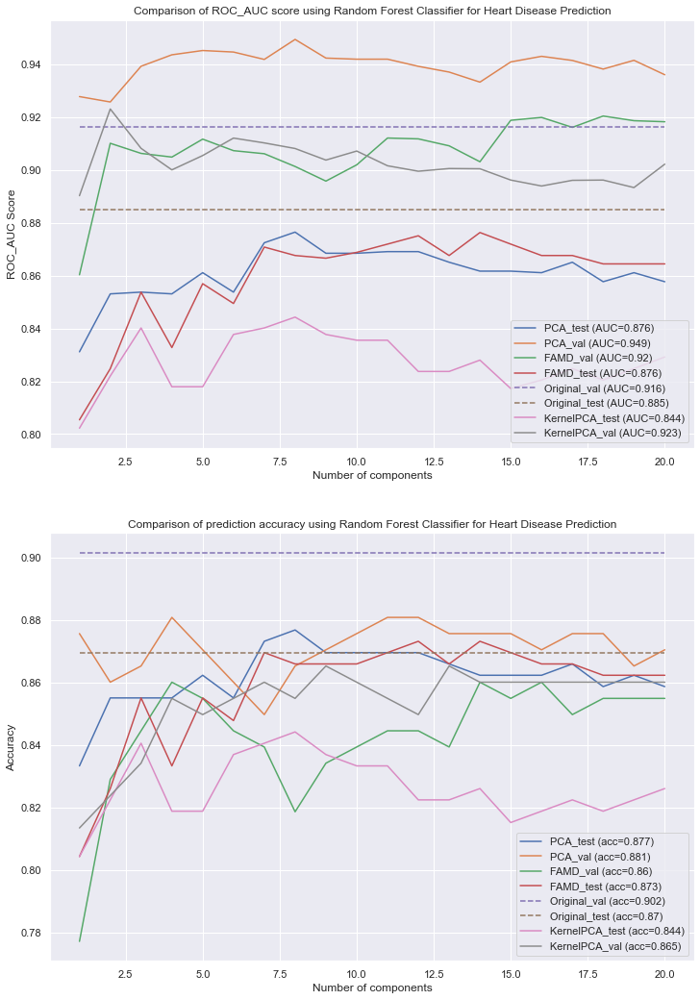

In [128]:
rf_famd_acc,rf_pca_acc,rf_kpca_acc=plot_perf_comp('Random Forest Classifier',random_rf.best_estimator_,rf_cv.mean(),rf_score,rf_acc_v,rf_acc_t)

StandardScaler()
Roc_AUC validation set: 0.9203333333333333
ROC_AUC test set: 0.8753354203935599
Accuracy validation set:0.8497409326424871
Accuracy test set:0.8659420289855072
Confusion Matrix:
[[ 95  28]
 [  9 144]]
MinMaxScaler()
Roc_AUC validation set: 0.9136666666666666
ROC_AUC test set: 0.8717387548234753
Accuracy validation set:0.844559585492228
Accuracy test set:0.855072463768116
Confusion Matrix:
[[ 90  33]
 [  7 146]]
RobustScaler()
Roc_AUC validation set: 0.9203333333333333
ROC_AUC test set: 0.8425058548009368
Accuracy validation set:0.8601036269430051
Accuracy test set:0.8442028985507246
Confusion Matrix:
[[101  22]
 [ 21 132]]
PowerTransformer()


C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Roc_AUC validation set: 0.9133333333333333
ROC_AUC test set: 0.8802401930523598
Accuracy validation set:0.8497409326424871
Accuracy test set:0.8695652173913043
Confusion Matrix:
[[ 95  28]
 [  8 145]]


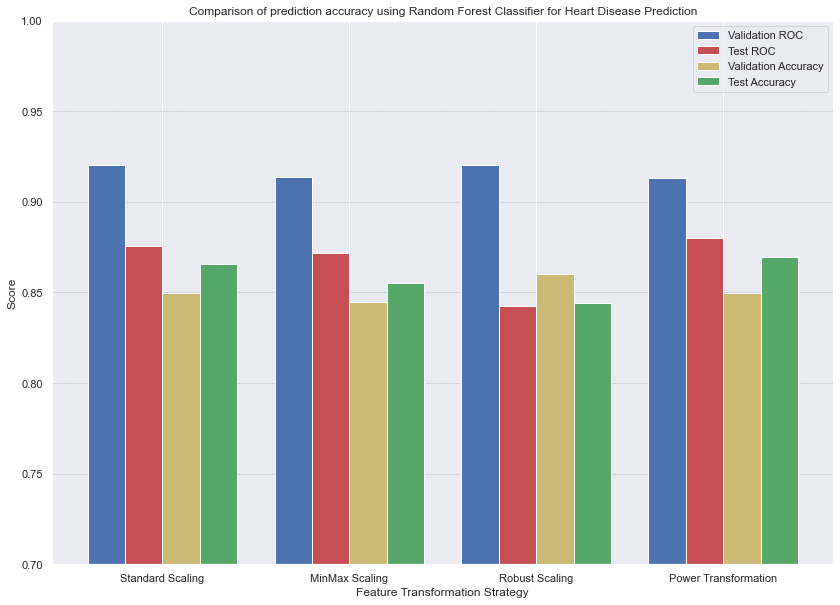

In [129]:
transformation_comp('Random Forest Classifier',random_rf.best_estimator_)

### III.6. ADABoost Classifier

ADABoost base estimator supports only estimators with the parameter sample_weight:

In [130]:
import inspect
from sklearn.utils import all_estimators
for name, clf in all_estimators(type_filter='classifier'):
    if 'sample_weight' in inspect.getfullargspec(clf.fit)[0]:
       print(name)

AdaBoostClassifier
BaggingClassifier
BernoulliNB
CalibratedClassifierCV
CategoricalNB
ComplementNB
DecisionTreeClassifier
DummyClassifier
ExtraTreeClassifier
ExtraTreesClassifier
GaussianNB
GradientBoostingClassifier
HistGradientBoostingClassifier
LinearSVC
LogisticRegression
LogisticRegressionCV
MultiOutputClassifier
MultinomialNB
NuSVC
Perceptron
RandomForestClassifier
RidgeClassifier
RidgeClassifierCV
SGDClassifier
SVC
StackingClassifier
VotingClassifier


In [131]:
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier

ada_clf=AdaBoostClassifier()
param_grid_ada = {
                  'base_estimator':[log_bp.best_estimator_,svm_bp.best_estimator_,
                                    random_rf.best_estimator_,DecisionTreeClassifier()],
                  'n_estimators':[30,50,70],
                  'learning_rate':[0.02,0.04,0.06]
              } 

ada_bp=GridSearchCV(ada_clf,param_grid=param_grid_ada,cv=5)
ada_bp.fit(X_train,y_train)
print(ada_bp.best_params_)
ada_cv,ada_score,ada_acc_v,ada_acc_t=clf_score(ada_bp.best_estimator_,X_val,y_val,X_test,y_test,cv=5)


C:\Users\valentf\Anaconda3\lib\site-packages\joblib\externals\loky\process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


{'base_estimator': RandomForestClassifier(max_depth=55, max_features='sqrt', min_samples_leaf=4,
                       min_samples_split=5, n_estimators=607, n_jobs=-1), 'learning_rate': 0.04, 'n_estimators': 30}
Roc_AUC validation set: 0.9056871233341821
ROC_AUC test set: 0.8753354203935599
Accuracy validation set:0.8601036269430051
Accuracy test set:0.8659420289855072
Confusion Matrix:
[[ 95  28]
 [  9 144]]


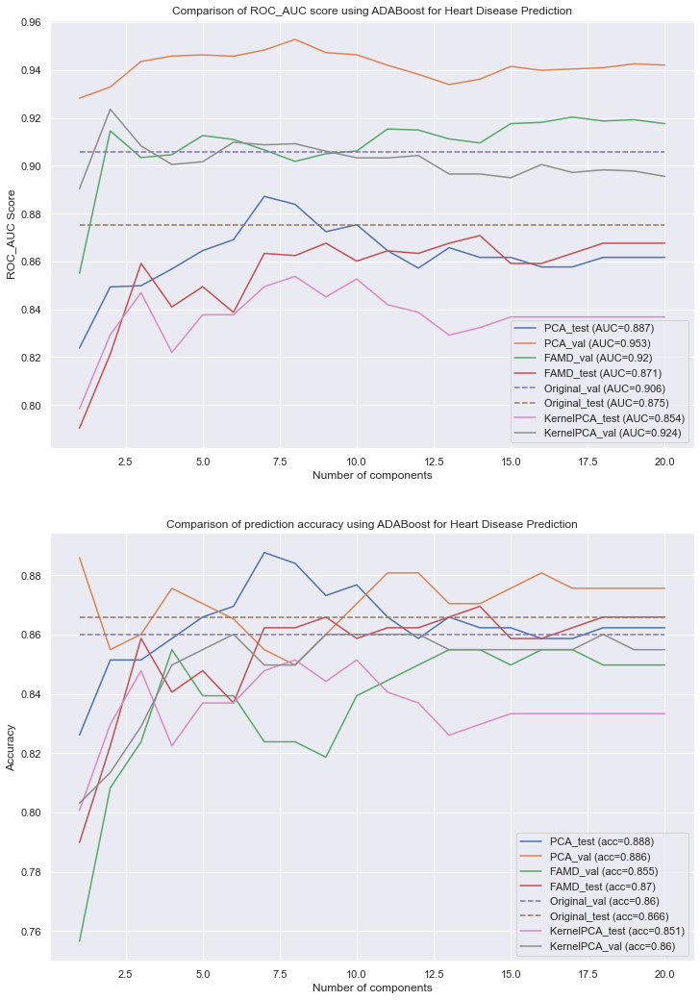

In [132]:
ada_famd_acc,ada_pca_acc,ada_kpca_acc=plot_perf_comp('ADABoost',ada_bp.best_estimator_,ada_cv.mean(),ada_score,ada_acc_v,ada_acc_t)

StandardScaler()
Roc_AUC validation set: 0.9132499999999999
ROC_AUC test set: 0.8724956507099164
Accuracy validation set:0.8601036269430051
Accuracy test set:0.8623188405797102
Confusion Matrix:
[[ 94  29]
 [  9 144]]
MinMaxScaler()
Roc_AUC validation set: 0.9086666666666666
ROC_AUC test set: 0.8824893917963225
Accuracy validation set:0.8549222797927462
Accuracy test set:0.8695652173913043
Confusion Matrix:
[[ 94  29]
 [  7 146]]
RobustScaler()
Roc_AUC validation set: 0.9111666666666667
ROC_AUC test set: 0.8503205128205128
Accuracy validation set:0.8601036269430051
Accuracy test set:0.8514492753623188
Confusion Matrix:
[[101  22]
 [ 19 134]]
PowerTransformer()


C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Roc_AUC validation set: 0.9083333333333332
ROC_AUC test set: 0.8753354203935599
Accuracy validation set:0.8601036269430051
Accuracy test set:0.8659420289855072
Confusion Matrix:
[[ 95  28]
 [  9 144]]


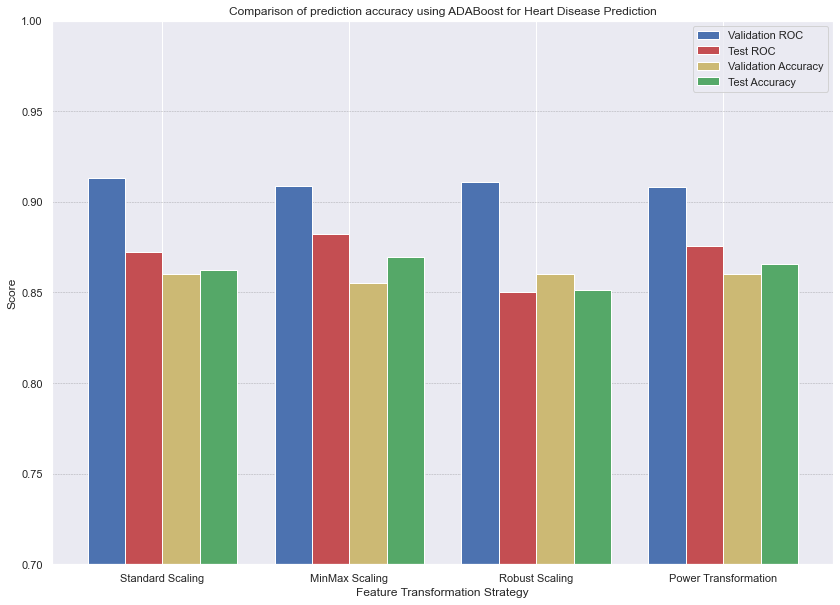

In [133]:
transformation_comp('ADABoost',ada_bp.best_estimator_)

### III.7. Voting Classifier

Similar to ADABoost, voting classifier can only use estimator having predict_proba method.

In [134]:
from sklearn.utils import all_estimators

estimators = all_estimators()

for name, class_ in estimators:
    if hasattr(class_, 'predict_proba'):
        print(name)

AdaBoostClassifier
BaggingClassifier
BayesianGaussianMixture
BernoulliNB
CalibratedClassifierCV
CategoricalNB
ClassifierChain
ComplementNB
DecisionTreeClassifier
DummyClassifier
ExtraTreeClassifier
ExtraTreesClassifier
GaussianMixture
GaussianNB
GaussianProcessClassifier
GradientBoostingClassifier
GridSearchCV
HalvingGridSearchCV
HalvingRandomSearchCV
HistGradientBoostingClassifier
KNeighborsClassifier
LabelPropagation
LabelSpreading
LinearDiscriminantAnalysis
LogisticRegression
LogisticRegressionCV
MLPClassifier
MultiOutputClassifier
MultinomialNB
NuSVC
OneVsRestClassifier
Pipeline
QuadraticDiscriminantAnalysis
RFE
RFECV
RadiusNeighborsClassifier
RandomForestClassifier
RandomizedSearchCV
SGDClassifier
SVC
SelfTrainingClassifier
StackingClassifier
VotingClassifier


In [135]:
from sklearn.ensemble import VotingClassifier


estimators=[('log',log_bp.best_estimator_),('ada',ada_bp.best_estimator_),('knn',knn_clf),
            ('rf',random_rf.best_estimator_),('svm',svm_bp.best_estimator_)]

ens_clf=VotingClassifier(estimators=estimators,n_jobs=-1,voting='soft')

param_grid_ens={
                'weights':[[1,1,1,1,1],[1.4,1.15,1,0.7,0.7],[1.4,1.2,1,0.8,0.6]]
                }
ens_bp=GridSearchCV(ens_clf,param_grid=param_grid_ens,cv=5)
ens_bp.fit(X_train,y_train)
print(ens_bp.best_params_)
ens_cv,ens_score,ens_acc_v,ens_acc_t=clf_score(ens_bp.best_estimator_,X_val,y_val,X_test,y_test,cv=5)


{'weights': [1, 1, 1, 1, 1]}
Roc_AUC validation set: 0.908525026172085
ROC_AUC test set: 0.8640873015873016
Accuracy validation set:0.8497409326424871
Accuracy test set:0.8586956521739131
Confusion Matrix:
[[ 96  27]
 [ 12 141]]


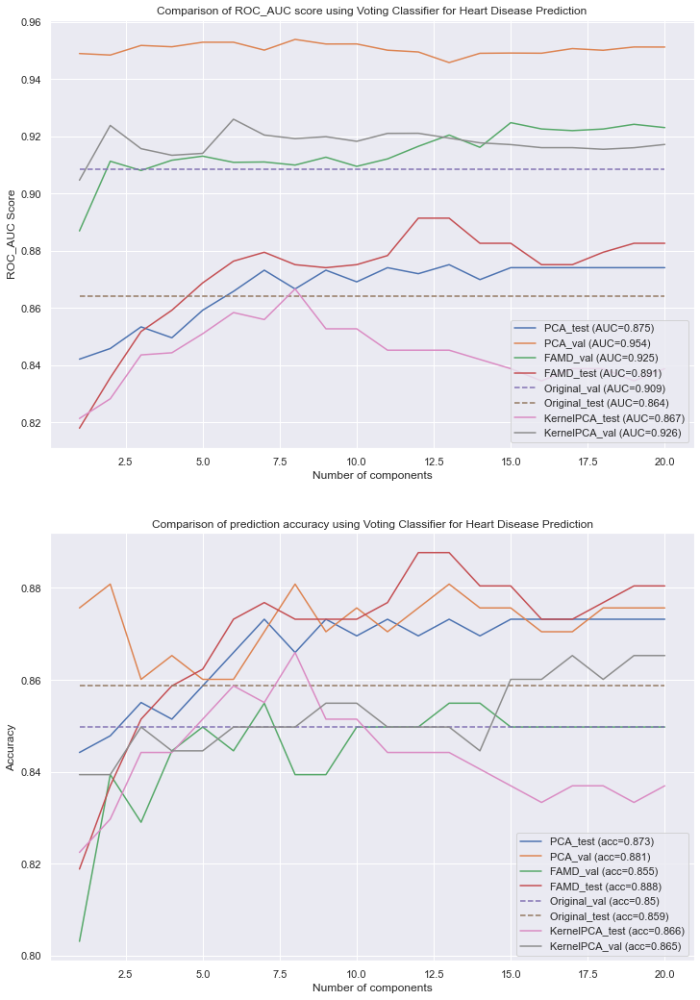

In [136]:
ens_famd_acc,ens_pca_acc,ens_kpca_acc=plot_perf_comp('Voting Classifier',ens_bp.best_estimator_,ens_cv.mean(),ens_score,ens_acc_v,ens_acc_t)

StandardScaler()
Roc_AUC validation set: 0.9061666666666666
ROC_AUC test set: 0.8640873015873016
Accuracy validation set:0.8497409326424871
Accuracy test set:0.8586956521739131
Confusion Matrix:
[[ 96  27]
 [ 12 141]]
MinMaxScaler()
Roc_AUC validation set: 0.90575
ROC_AUC test set: 0.8746817538896748
Accuracy validation set:0.8549222797927462
Accuracy test set:0.8623188405797102
Confusion Matrix:
[[ 93  30]
 [  8 145]]
RobustScaler()
Roc_AUC validation set: 0.9263333333333332
ROC_AUC test set: 0.8434873949579832
Accuracy validation set:0.8497409326424871
Accuracy test set:0.8442028985507246
Confusion Matrix:
[[108  15]
 [ 28 125]]
PowerTransformer()


C:\Users\valentf\Anaconda3\lib\site-packages\sklearn\preprocessing\_data.py:3253: RuntimeWarning: divide by zero encountered in log
  loglike = -n_samples / 2 * np.log(x_trans.var())


Roc_AUC validation set: 0.9057499999999999
ROC_AUC test set: 0.8671098170631214
Accuracy validation set:0.844559585492228
Accuracy test set:0.8623188405797102
Confusion Matrix:
[[ 97  26]
 [ 12 141]]


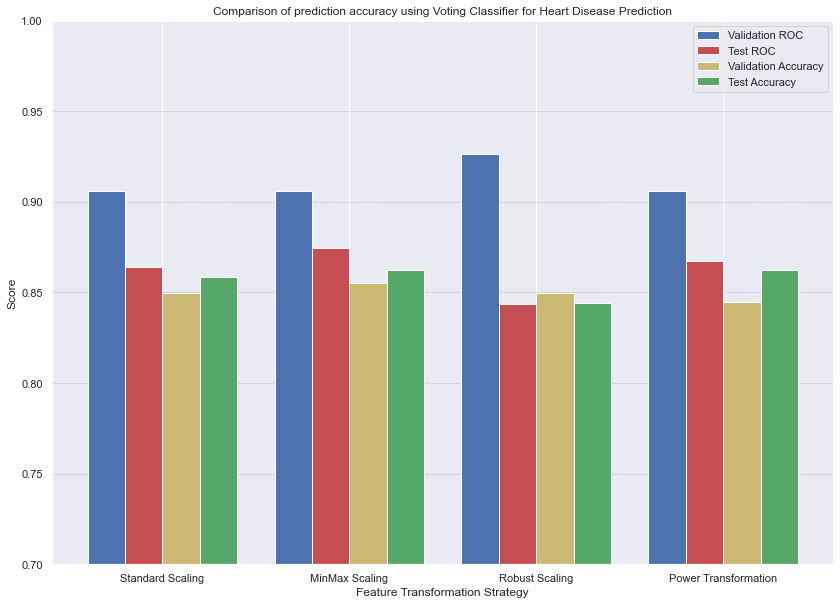

In [137]:
transformation_comp('Voting Classifier',ens_bp.best_estimator_)

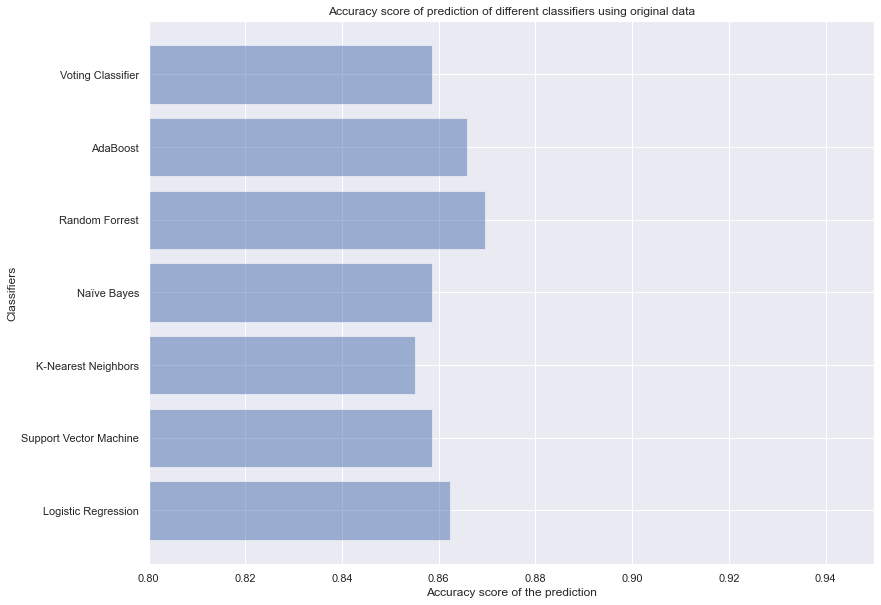

In [146]:
x_labels=['Logistic Regression','Support Vector Machine','K-Nearest Neighbors','Naïve Bayes', 
          'Random Forrest','AdaBoost','Voting Classifier']

acc_list_ori=[log_acc_testscore,svm_acc_t,knn_acc_t,nb_acc_t,rf_acc_t,ada_acc_t,ens_acc_t]
acc_list_pca=[max(log_pca_acc),max(svm_pca_acc),max(knn_pca_acc),max(nb_pca_acc),
              max(rf_pca_acc),max(ada_pca_acc),max(ens_pca_acc)]
acc_list_famd=[max(log_famd_acc),max(svm_famd_acc),max(knn_famd_acc),max(nb_famd_acc),
               max(rf_famd_acc),max(ada_famd_acc),max(ens_famd_acc)]
acc_list_kpca=[max(log_kpca_acc),max(svm_kpca_acc),max(knn_kpca_acc),max(nb_kpca_acc),
               max(rf_kpca_acc),max(ada_kpca_acc),max(ens_kpca_acc)]

log_famd_acc,log_pca_acc,log_kpca_acc

def plot_class(x_labels,test_acc,name):
    fig, ax = plt.subplots(figsize=(13, 10))
    ax.barh(x_labels, test_acc, align='center', alpha=0.5, ecolor='black', capsize=10)
    ax.set_ylabel('Classifiers')
    ax.set_xlabel('Accuracy score of the prediction')
    ax.set_title('Accuracy score of prediction of different classifiers using '+ name+' data')
    ax.yaxis.grid(True)
    plt.xlim([0.8,0.95])
    
plot_class(x_labels,acc_list_ori,'original')

Ensemble methods are very similar to the 'simple methods' in term of accuracy on the original dataset. However ensemble methods with FAMD features usually leads to a better accuracy (above 0.9 expected).


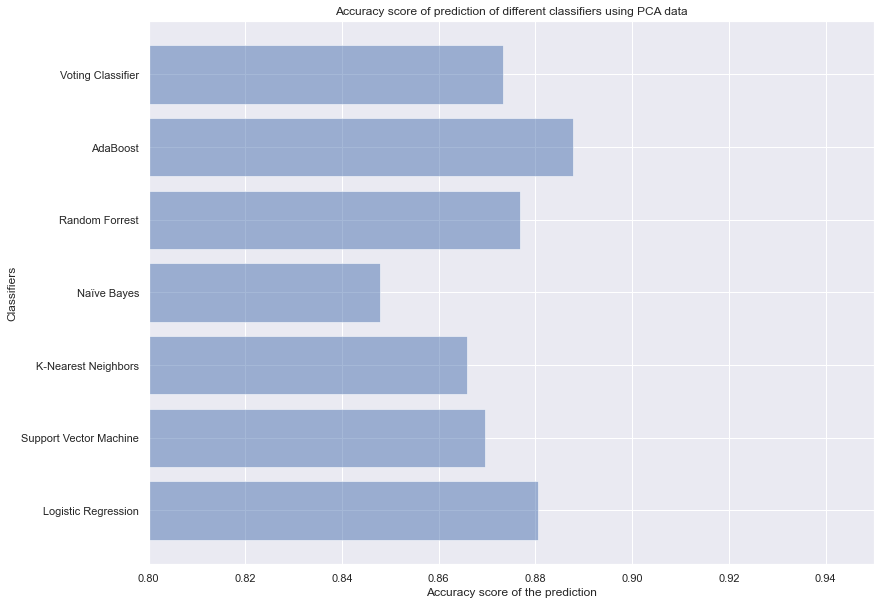

In [145]:
plot_class(x_labels,acc_list_pca,'PCA')

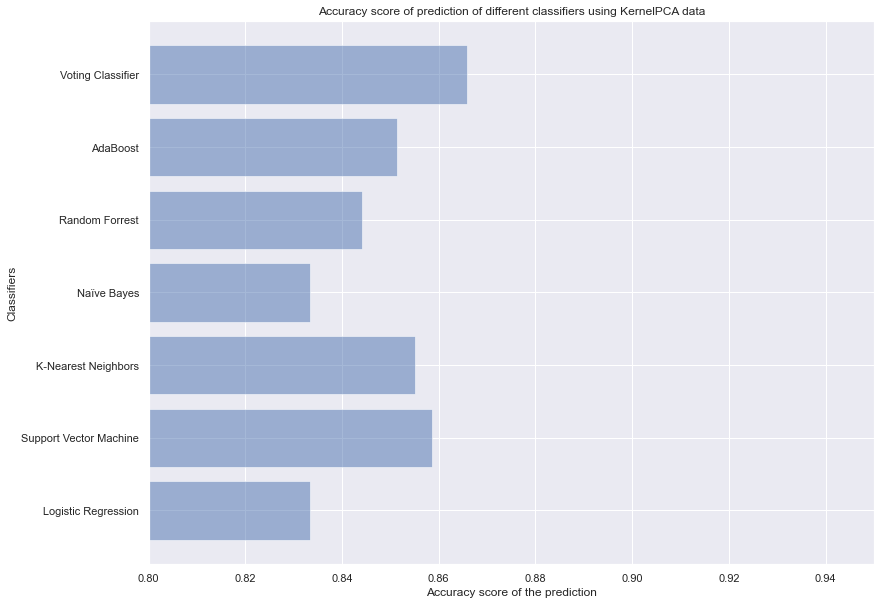

In [147]:
plot_class(x_labels,acc_list_kpca,'KernelPCA')

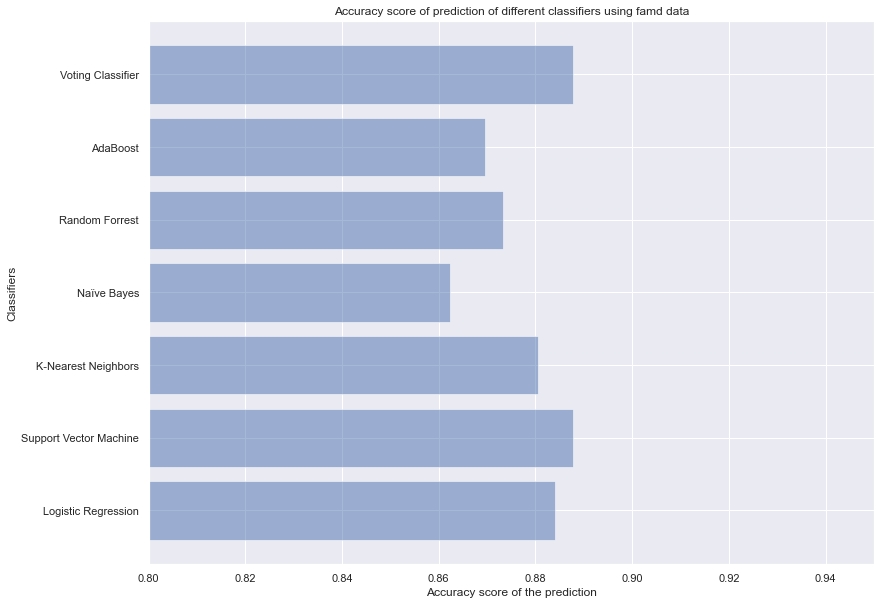

In [148]:
plot_class(x_labels,acc_list_famd,'famd')

## Improvement possibilities

This project could yield better results with the following additions:

<ul>
    <li> Hyperparameter tuning using multivariate optimization. It would lead to a better accuracy, but significantly increase the runtime </li>
    <li> Analyze the impact of predictors scaling methods on components analysis </li>
    <li> Use custom code to include a validation set for imputer optimization (scikitlearn.impute uses train and test set for cross validation, but no validation which can result in information leakage)</li>
</ul>

In [139]:
#stratifying leads better results - probably because some subsamples predictions would be full of 0 or 1